<a href="https://colab.research.google.com/github/keeprich/AI-Trading-Bot/blob/main/MACD_200MA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install oandapyV20

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.6/51.6 kB 954.0 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for oandapyV20: filename=oandapyV20-0.7.2-py3-none-any.whl size=69778 sha256=adbfc2cd0364f8fcf82e732ba15675784ad8b6d33a1eb57c99c85a2786301db2
  Stored in directory: /root/.cache/pip/wheels/8e/69/ab/a6da84a85b9bf3b5a98ca15c6c52b7854f32b10c70fe0531a1
Successfully built oandapyV20


In [ ]:
import oandapyV20
from oandapyV20 import API
from oandapyV20.endpoints.instruments import InstrumentsCandles
from oandapyV20.endpoints.orders import OrderCreate
import pandas as pd
import time
import matplotlib.pyplot as plt

# Initialize API


# Fetch historical price data
def fetch_price_data(instrument="EUR_USD", granularity="M5", count=300):
    params = {"granularity": granularity, "count": count}
    candles = InstrumentsCandles(instrument=instrument, params=params)
    data = api.request(candles)
    prices = []
    for candle in data["candles"]:
        prices.append({
            "time": candle["time"],
            "open": float(candle["mid"]["o"]),
            "high": float(candle["mid"]["h"]),
            "low": float(candle["mid"]["l"]),
            "close": float(candle["mid"]["c"])
        })
    df = pd.DataFrame(prices)
    df["time"] = pd.to_datetime(df["time"])
    return df

# Calculate indicators (200-period MA and MACD)
def calculate_indicators(df):
    # 200-period moving average
    df['MA_200'] = df['close'].rolling(window=200).mean()

    # MACD (12, 26, 9)
    df['EMA12'] = df['close'].ewm(span=12, adjust=False).mean()
    df['EMA26'] = df['close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = df['EMA12'] - df['EMA26']
    df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False).mean()
    return df

# Define trading strategy conditions
def should_buy(df, current_price):
    return (current_price > df['MA_200'].iloc[-1]) and \
           (df['MACD'].iloc[-1] < 0 and df['MACD'].iloc[-2] >= 0)

def should_sell(df, current_price):
    return (current_price < df['MA_200'].iloc[-1]) and \
           (df['MACD'].iloc[-1] > 0 and df['MACD'].iloc[-2] <= 0)

# Place an order
def place_order(instrument, action, lot_size, sl, tp):
    units = str(lot_size) if action == "buy" else str(-lot_size)
    order_data = {
        "order": {
            "units": units,
            "instrument": instrument,
            "timeInForce": "FOK",
            "type": "MARKET",
            "positionFill": "DEFAULT",
            "takeProfitOnFill": {"price": f"{tp:.5f}"},
            "stopLossOnFill": {"price": f"{sl:.5f}"}
        }
    }
    try:
        response = api.request(OrderCreate(ACCOUNT_ID, data=order_data))
        print(f"{action.capitalize()} order placed: {response}")
    except oandapyV20.exceptions.V20Error as e:
        print("Error placing order:", e)

# Visualization
def visualize(df, buy_signals, sell_signals):
    plt.figure(figsize=(14, 8))

    # Plot price and moving average
    plt.plot(df['time'], df['close'], label='Close Price')
    plt.plot(df['time'], df['MA_200'], label='200-period MA', color='orange')

    # Plot buy and sell signals
    plt.scatter(df.iloc[buy_signals].index, df['close'].iloc[buy_signals], marker='^', color='green', label="Buy Signal", alpha=1)
    plt.scatter(df.iloc[sell_signals].index, df['close'].iloc[sell_signals], marker='v', color='red', label="Sell Signal", alpha=1)

    plt.legend()
    plt.title("Price with Buy/Sell Signals and 200 MA")
    plt.xlabel("Time")
    plt.ylabel("Price")
    plt.grid()
    plt.show()

    # Plot MACD
    plt.figure(figsize=(14, 5))
    plt.plot(df['time'], df['MACD'], label="MACD", color="blue")
    plt.plot(df['time'], df['MACD_signal'], label="MACD Signal", color="red")
    plt.axhline(0, color='black', linestyle='--')
    plt.legend()
    plt.title("MACD Indicator")
    plt.xlabel("Time")
    plt.ylabel("MACD Value")
    plt.grid()
    plt.show()

# Main trading loop
def trade(instrument="EUR_USD", lot_size=1000):
    while True:
        # Fetch and process data
        df = fetch_price_data(instrument)
        df = calculate_indicators(df)
        current_price = df['close'].iloc[-1]

        # Initialize lists for visualizing signals
        buy_signals, sell_signals = [], []

        # Check for buy/sell signals
        if should_buy(df, current_price):
            # Calculate SL and TP
            sl = df['MA_200'].iloc[-1] * 0.995
            tp = current_price + (current_price - sl) * 1.5
            place_order(instrument, "buy", lot_size, sl, tp)
            buy_signals.append(len(df) - 1)  # Mark signal position for visualization

        elif should_sell(df, current_price):
            # Calculate SL and TP
            sl = df['MA_200'].iloc[-1] * 1.005
            tp = current_price - (sl - current_price) * 1.5
            place_order(instrument, "sell", lot_size, sl, tp)
            sell_signals.append(len(df) - 1)  # Mark signal position for visualization

        # Visualize after each check
        visualize(df, buy_signals, sell_signals)

        # Wait before next check
        time.sleep(300)  # Check every 5 minutes (M5)


ModuleNotFoundError: No module named 'oandapyV20'

Sell order placed: {'orderCreateTransaction': {'id': '138', 'accountID': '101-004-30239848-002', 'userID': 30239848, 'batchID': '138', 'requestID': '115348019627710536', 'time': '2024-11-11T06:39:25.684729520Z', 'type': 'MARKET_ORDER', 'instrument': 'EUR_USD', 'units': '-1000', 'timeInForce': 'FOK', 'positionFill': 'DEFAULT', 'takeProfitOnFill': {'price': '1.06299', 'timeInForce': 'GTC'}, 'stopLossOnFill': {'price': '1.07732', 'timeInForce': 'GTC', 'triggerMode': 'TOP_OF_BOOK'}, 'reason': 'CLIENT_ORDER'}, 'orderFillTransaction': {'id': '139', 'accountID': '101-004-30239848-002', 'userID': 30239848, 'batchID': '138', 'requestID': '115348019627710536', 'time': '2024-11-11T06:39:25.684729520Z', 'type': 'ORDER_FILL', 'orderID': '138', 'instrument': 'EUR_USD', 'units': '-1000', 'requestedUnits': '-1000', 'price': '1.07156', 'pl': '0.0000', 'quotePL': '0', 'financing': '0.0000', 'baseFinancing': '0', 'commission': '0.0000', 'accountBalance': '99904.2716', 'gainQuoteHomeConversionFactor': '1'

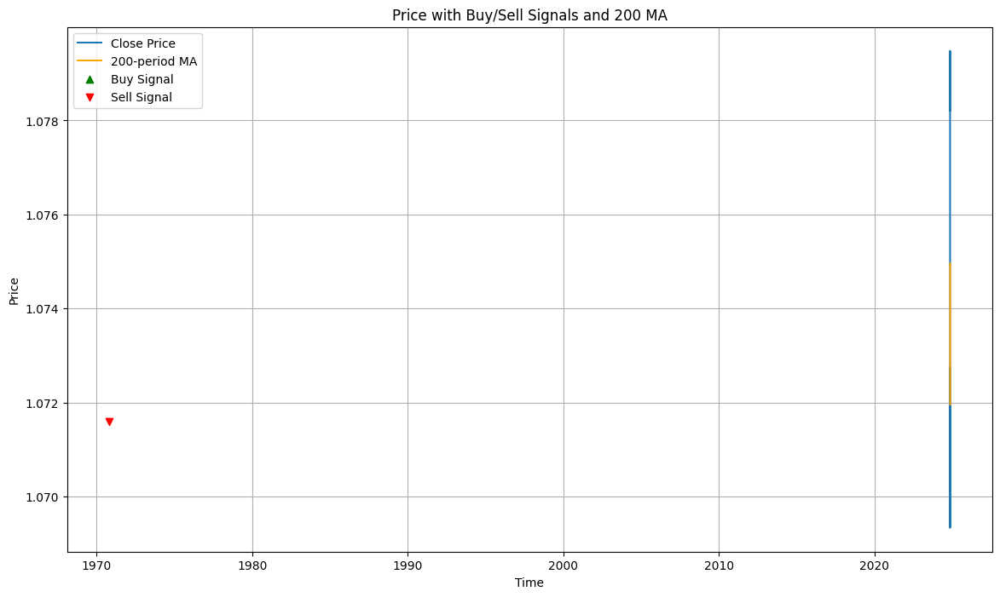

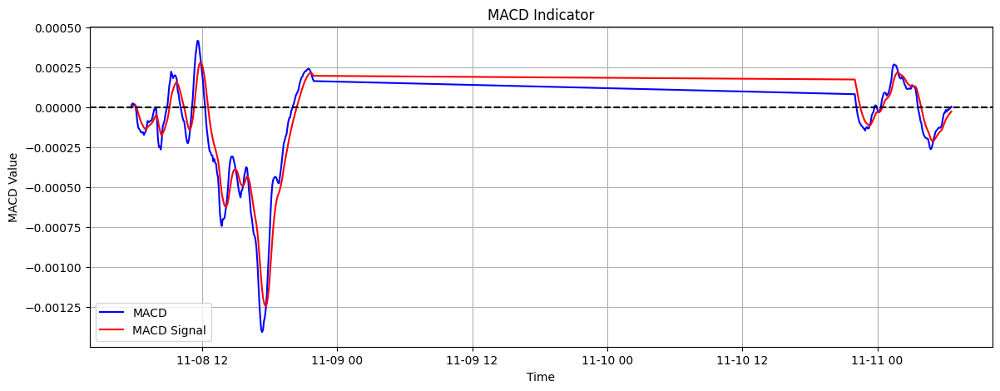

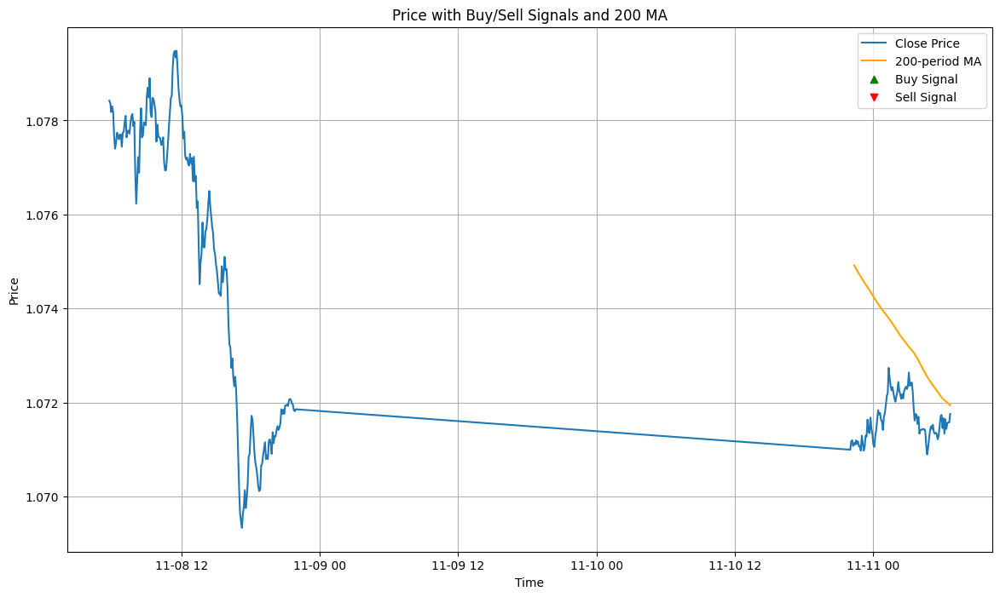

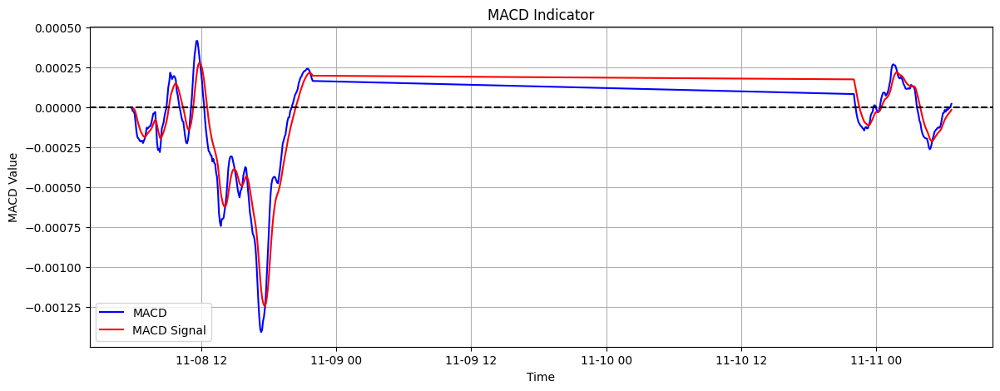

KeyboardInterrupt: 

In [ ]:
trade("EUR_USD", lot_size=1000)


In [ ]:
import oandapyV20
from oandapyV20 import API
from oandapyV20.endpoints.instruments import InstrumentsCandles
from oandapyV20.endpoints.orders import OrderCreate
import pandas as pd
import time
import matplotlib.pyplot as plt

# Initialize OANDA API
API_KEY = "7881b59039beb34197d5c0d3d16f0a7a-fa4ffbfebacce78af23ec0227bef49bd"
ACCOUNT_ID = "101-004-30239848-002"
api = API(access_token=API_KEY)

# Fetch historical price data
def fetch_price_data(instrument="EUR_USD", granularity="M5", count=300):
    params = {"granularity": granularity, "count": count}
    candles = InstrumentsCandles(instrument=instrument, params=params)
    data = api.request(candles)
    prices = []
    for candle in data["candles"]:
        prices.append({
            "time": candle["time"],
            "open": float(candle["mid"]["o"]),
            "high": float(candle["mid"]["h"]),
            "low": float(candle["mid"]["l"]),
            "close": float(candle["mid"]["c"])
        })
    df = pd.DataFrame(prices)
    df["time"] = pd.to_datetime(df["time"])
    return df

# Calculate indicators (200-period MA, MACD, and ATR for volatility)
def calculate_indicators(df):
    # 200-period moving average
    df['MA_200'] = df['close'].rolling(window=200).mean()

    # MACD (12, 26, 9)
    df['EMA12'] = df['close'].ewm(span=12, adjust=False).mean()
    df['EMA26'] = df['close'].ewm(span=26, adjust=False).mean()
    df['MACD'] = df['EMA12'] - df['EMA26']
    df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False).mean()

    # ATR for volatility check
    df['high_low'] = df['high'] - df['low']
    df['high_close'] = abs(df['high'] - df['close'].shift())
    df['low_close'] = abs(df['low'] - df['close'].shift())
    df['tr'] = df[['high_low', 'high_close', 'low_close']].max(axis=1)
    df['ATR'] = df['tr'].rolling(window=14).mean()  # 14-period ATR
    return df

# Define trading strategy conditions
def should_buy(df, current_price, atr_threshold):
    return (current_price > df['MA_200'].iloc[-1]) and \
           (df['MACD'].iloc[-1] < 0 and df['MACD'].iloc[-2] >= 0) and \
           (df['ATR'].iloc[-1] > atr_threshold)

def should_sell(df, current_price, atr_threshold):
    return (current_price < df['MA_200'].iloc[-1]) and \
           (df['MACD'].iloc[-1] > 0 and df['MACD'].iloc[-2] <= 0) and \
           (df['ATR'].iloc[-1] > atr_threshold)

# Place an order
def place_order(instrument, action, lot_size, sl, tp):
    units = str(lot_size) if action == "buy" else str(-lot_size)
    order_data = {
        "order": {
            "units": units,
            "instrument": instrument,
            "timeInForce": "FOK",
            "type": "MARKET",
            "positionFill": "DEFAULT",
            "takeProfitOnFill": {"price": f"{tp:.5f}"},
            "stopLossOnFill": {"price": f"{sl:.5f}"}
        }
    }
    try:
        response = api.request(OrderCreate(ACCOUNT_ID, data=order_data))
        print(f"{action.capitalize()} order placed: {response}")
    except oandapyV20.exceptions.V20Error as e:
        print("Error placing order:", e)

# Visualization
def visualize(df, buy_signals, sell_signals):
    plt.figure(figsize=(14, 8))

    # Plot price and moving average
    plt.plot(df['time'], df['close'], label='Close Price')
    plt.plot(df['time'], df['MA_200'], label='200-period MA', color='orange')

    # Plot buy and sell signals
    plt.scatter(df.iloc[buy_signals].index, df['close'].iloc[buy_signals], marker='^', color='green', label="Buy Signal", alpha=1)
    plt.scatter(df.iloc[sell_signals].index, df['close'].iloc[sell_signals], marker='v', color='red', label="Sell Signal", alpha=1)

    plt.legend()
    plt.title("Price with Buy/Sell Signals and 200 MA")
    plt.xlabel("Time")
    plt.ylabel("Price")
    plt.grid()
    plt.show()

    # Plot MACD
    plt.figure(figsize=(14, 5))
    plt.plot(df['time'], df['MACD'], label="MACD", color="blue")
    plt.plot(df['time'], df['MACD_signal'], label="MACD Signal", color="red")
    plt.axhline(0, color='black', linestyle='--')
    plt.legend()
    plt.title("MACD Indicator")
    plt.xlabel("Time")
    plt.ylabel("MACD Value")
    plt.grid()
    plt.show()

# Main trading loop
def trade(instrument="EUR_USD", lot_size=1000):
    # ATR threshold for significant volatility
    atr_threshold = 0.0005  # Adjust this based on asset volatility

    while True:
        # Fetch and process data
        df = fetch_price_data(instrument)
        df = calculate_indicators(df)
        current_price = df['close'].iloc[-1]

        # Show dataset info and head for visibility
        print(df.info())
        print(df.head())

        # Initialize lists for visualizing signals
        buy_signals, sell_signals = [], []

        # Check for buy/sell signals
        if should_buy(df, current_price, atr_threshold):
            # Calculate SL and TP
            sl = df['MA_200'].iloc[-1] * 0.995
            tp = current_price + (current_price - sl) * 1.5
            place_order(instrument, "buy", lot_size, sl, tp)
            buy_signals.append(len(df) - 1)  # Mark signal position for visualization

        elif should_sell(df, current_price, atr_threshold):
            # Calculate SL and TP
            sl = df['MA_200'].iloc[-1] * 1.005
            tp = current_price - (sl - current_price) * 1.5
            place_order(instrument, "sell", lot_size, sl, tp)
            sell_signals.append(len(df) - 1)  # Mark signal position for visualization

        # Visualize after each check
        visualize(df, buy_signals, sell_signals)

        # Wait before next check
        time.sleep(300)  # Check every 5 minutes (M5)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

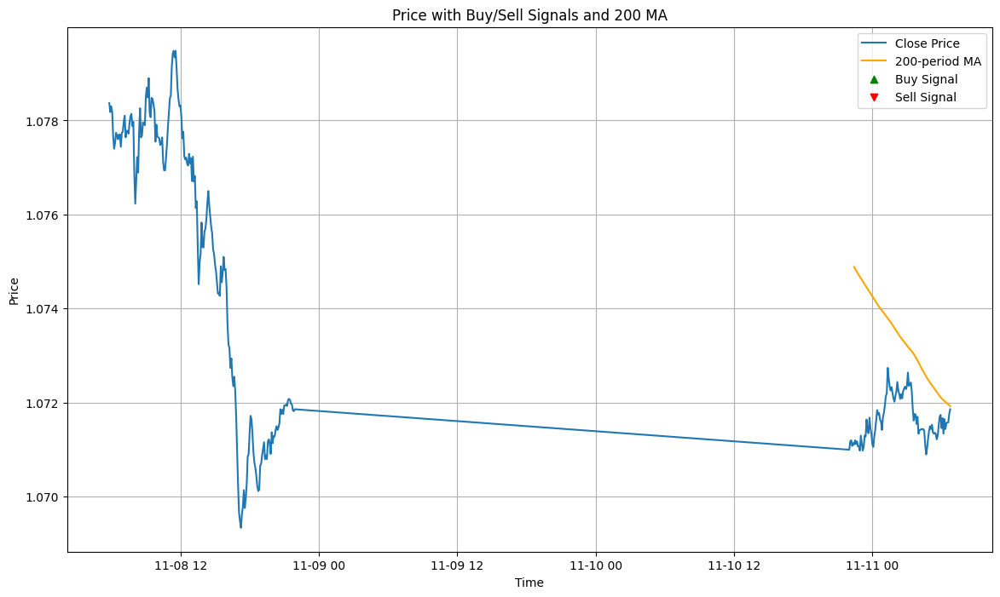

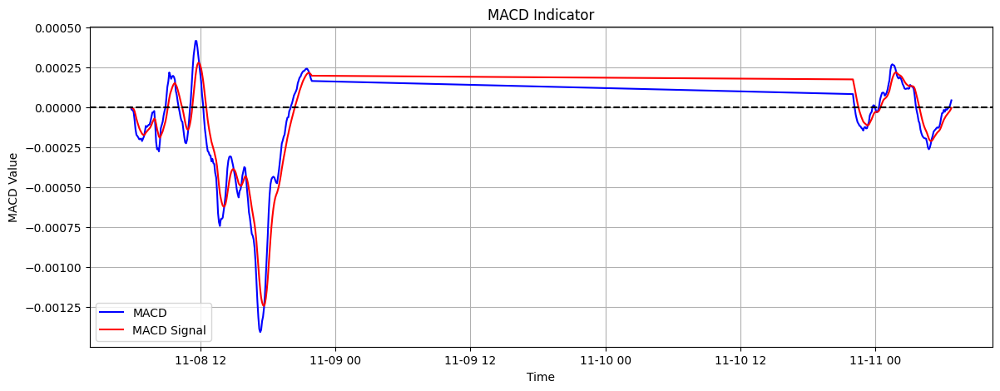

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

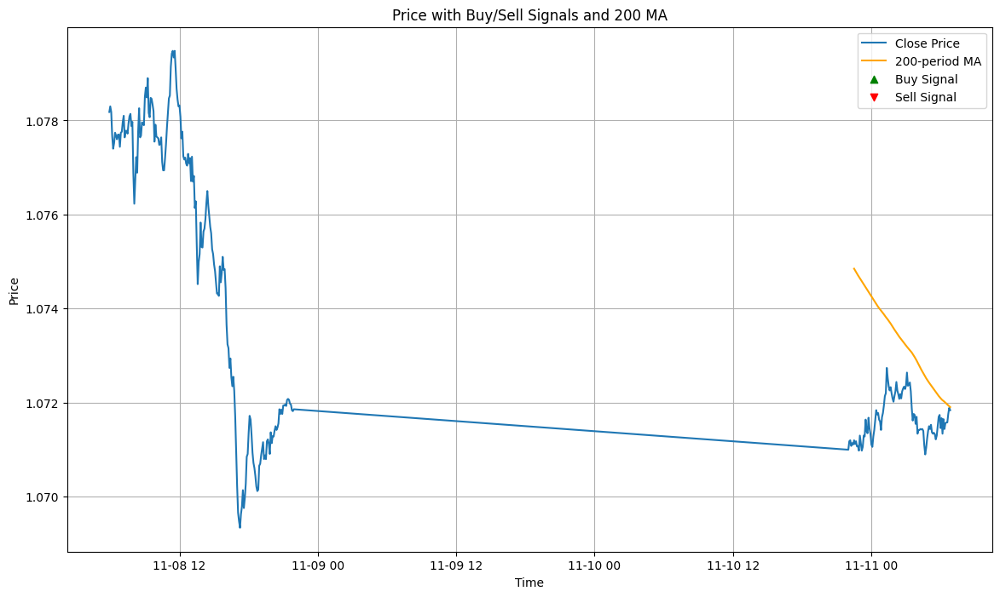

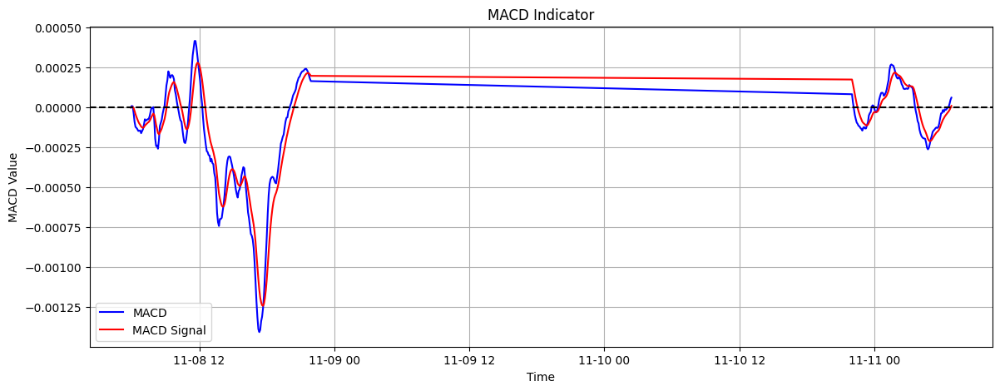

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

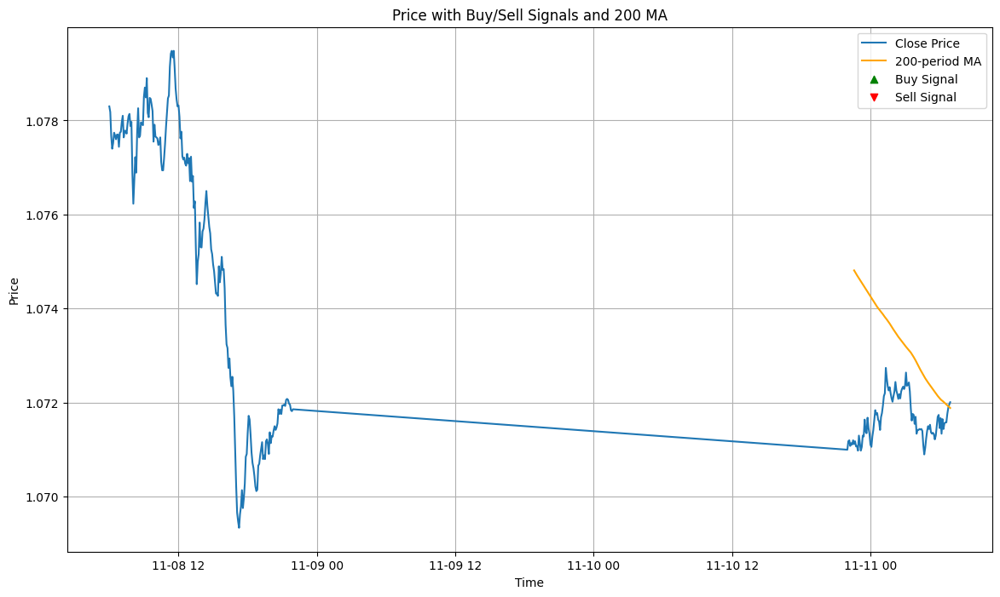

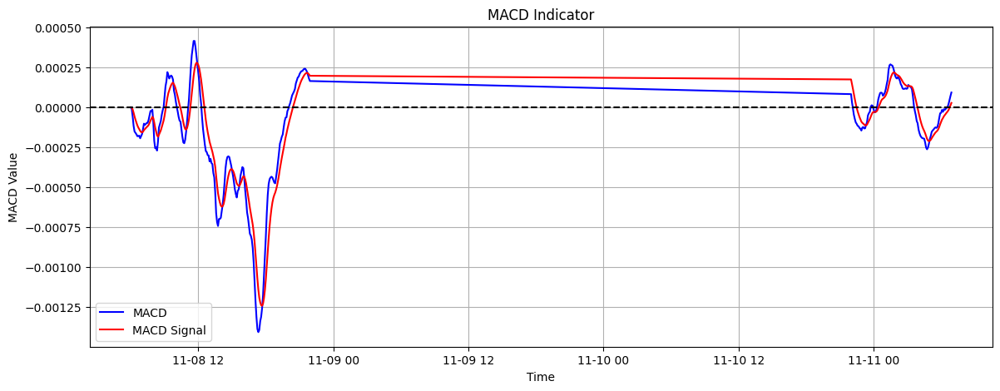

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

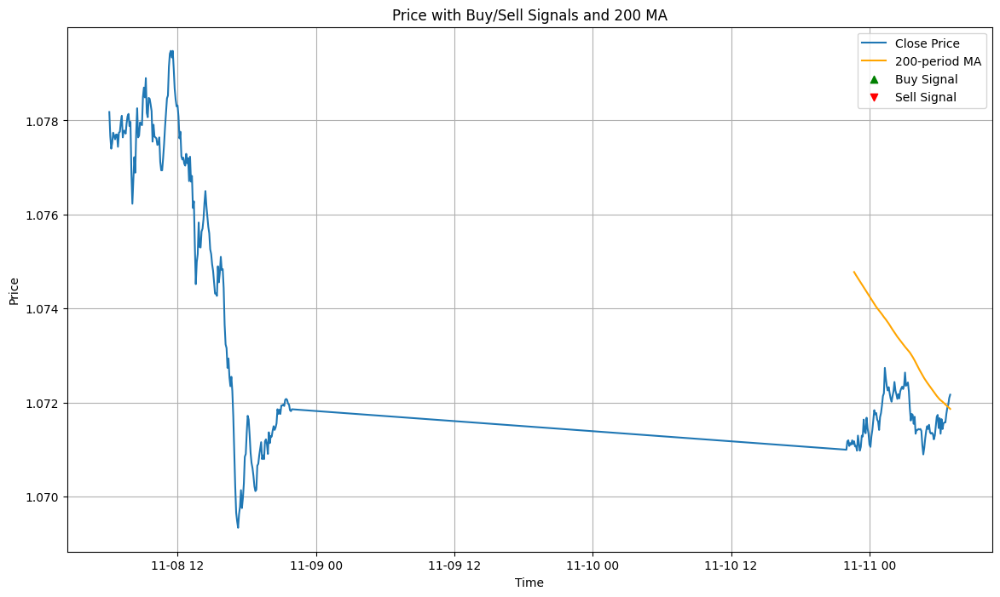

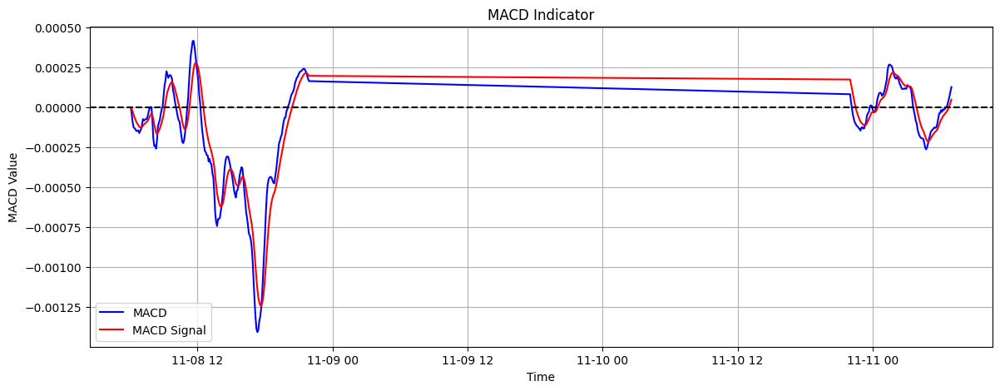

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

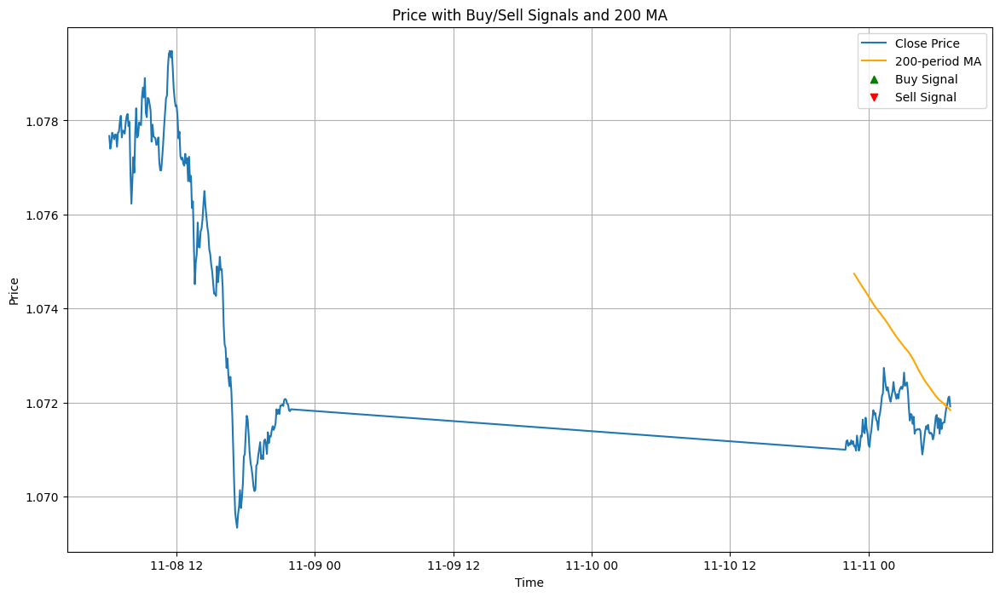

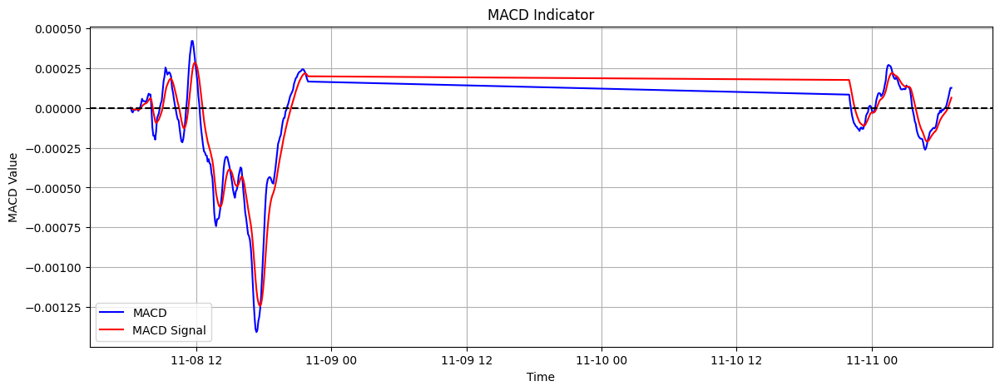

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

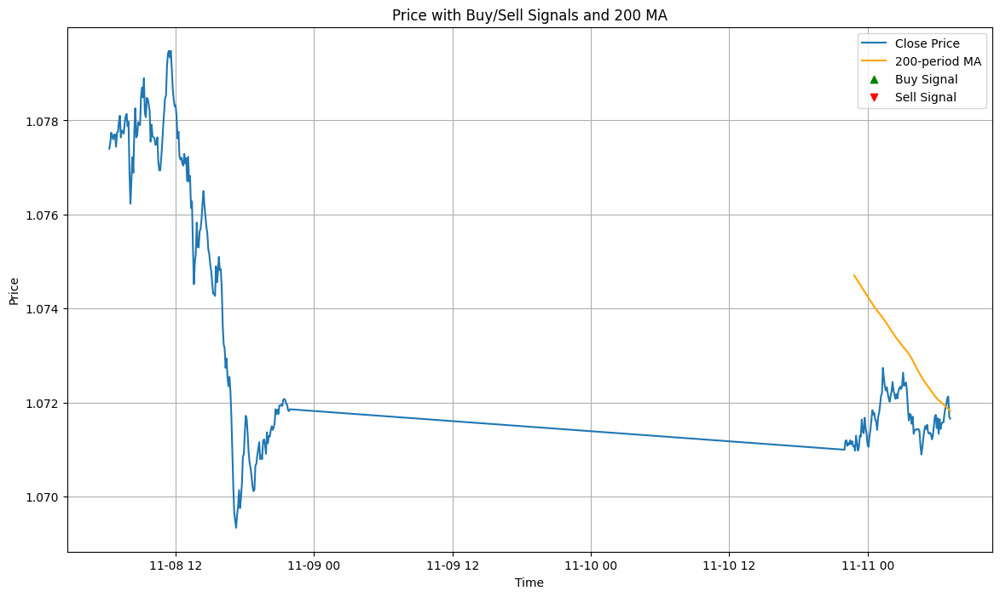

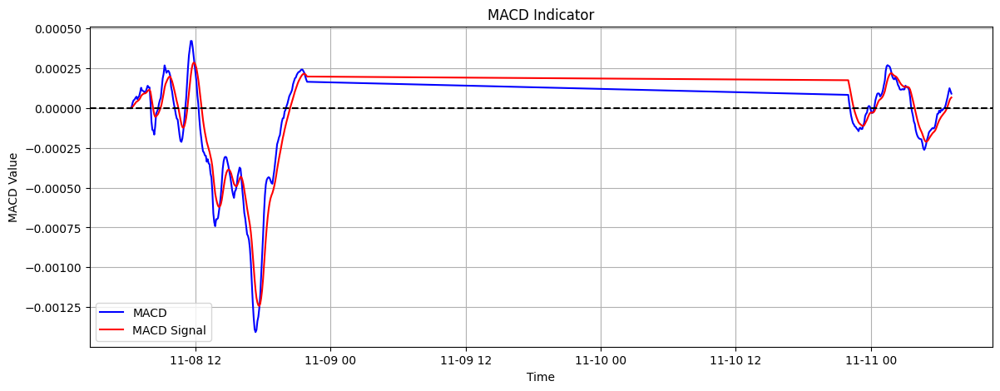

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

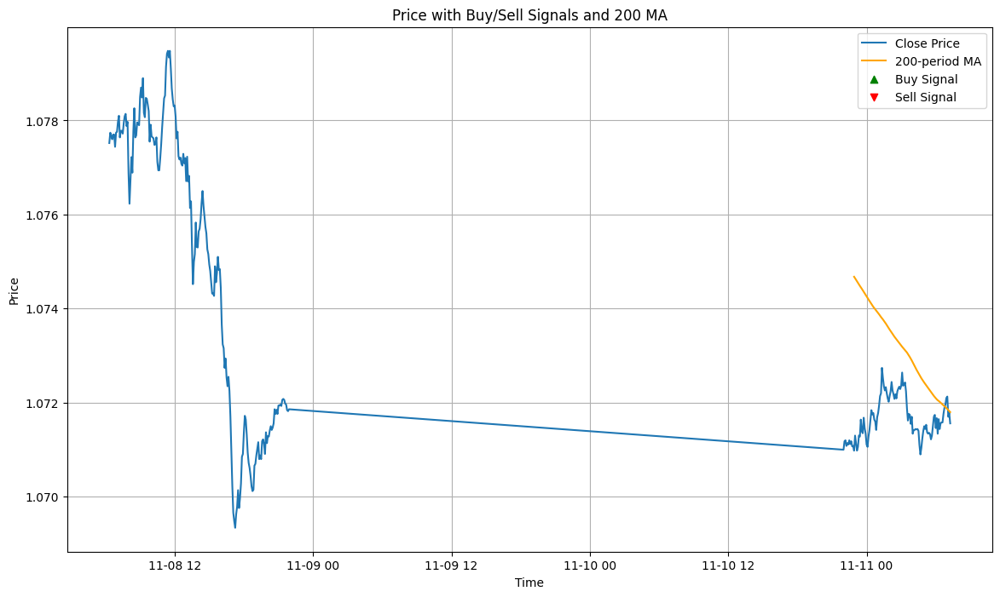

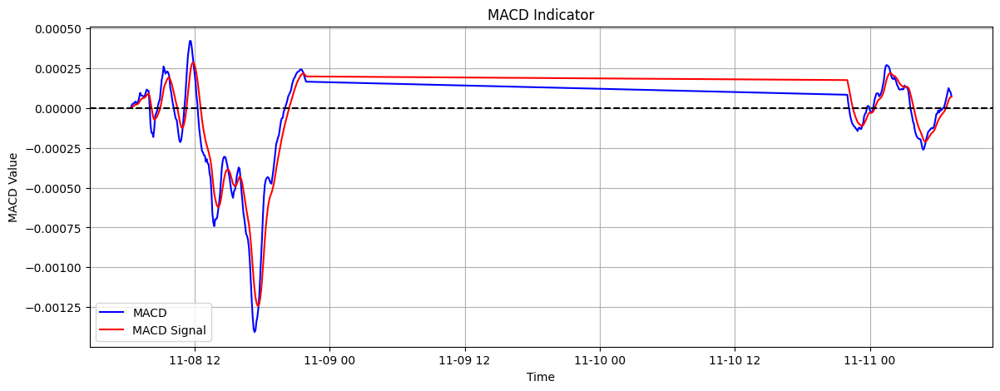

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

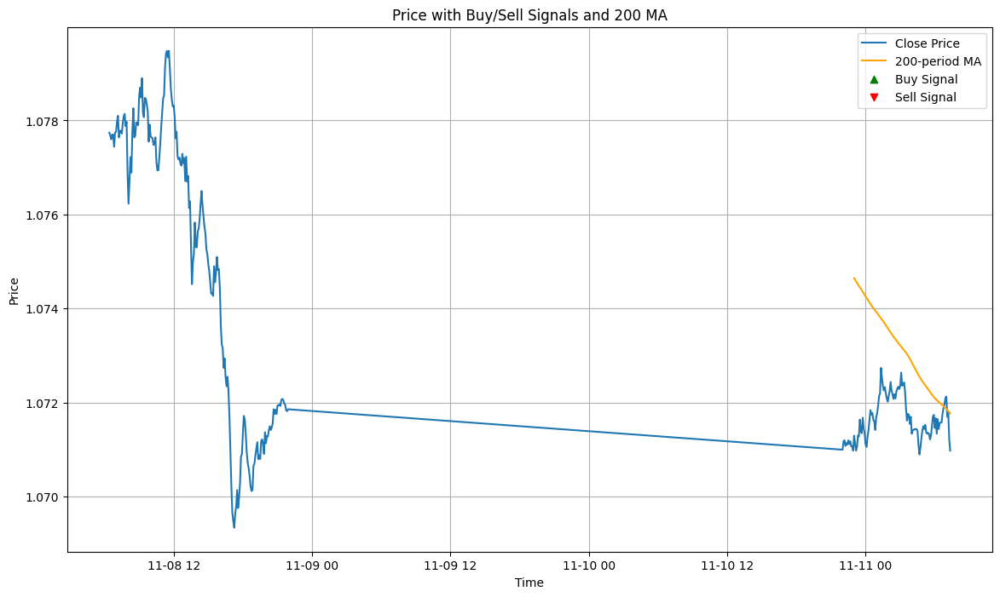

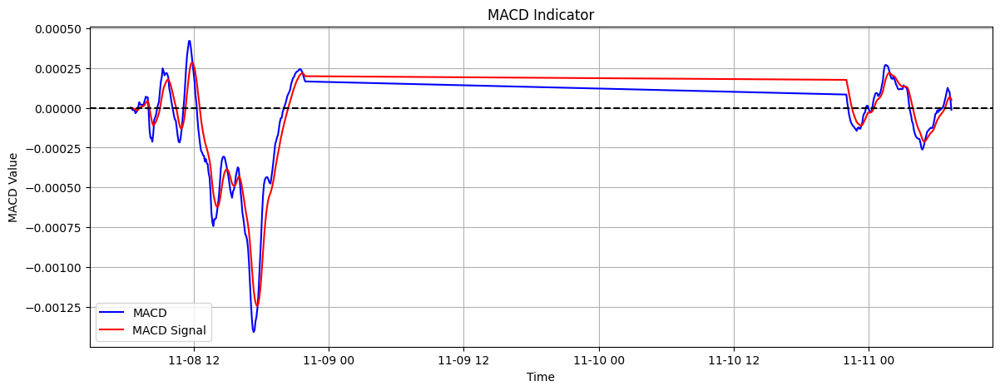

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

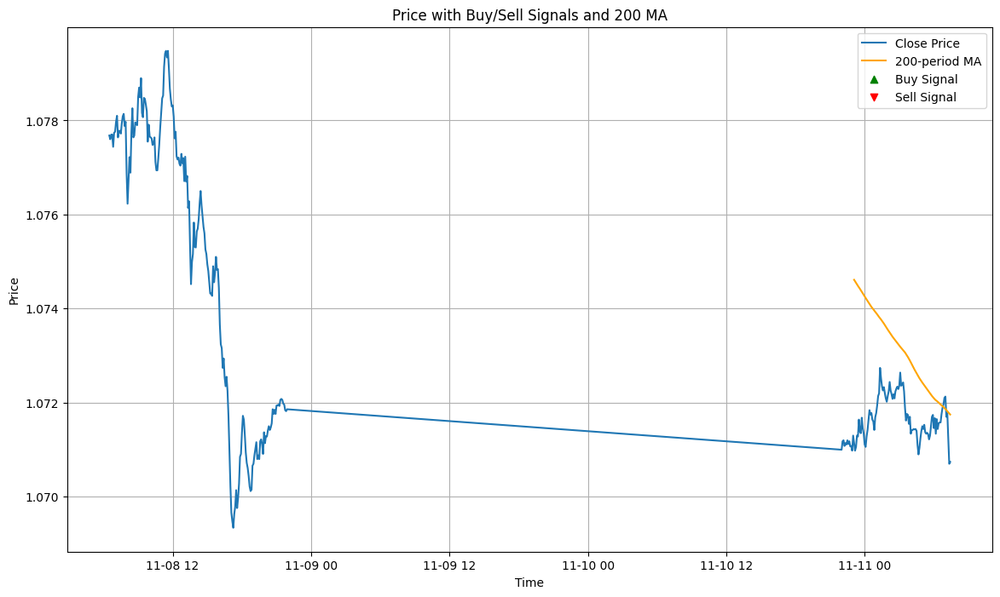

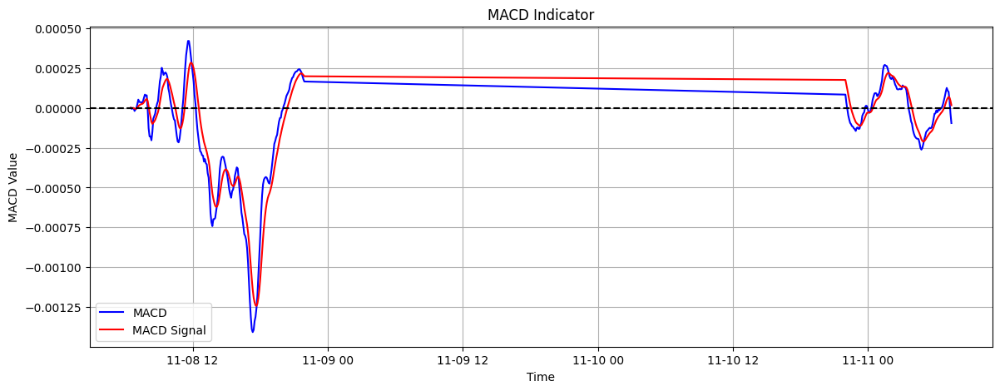

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

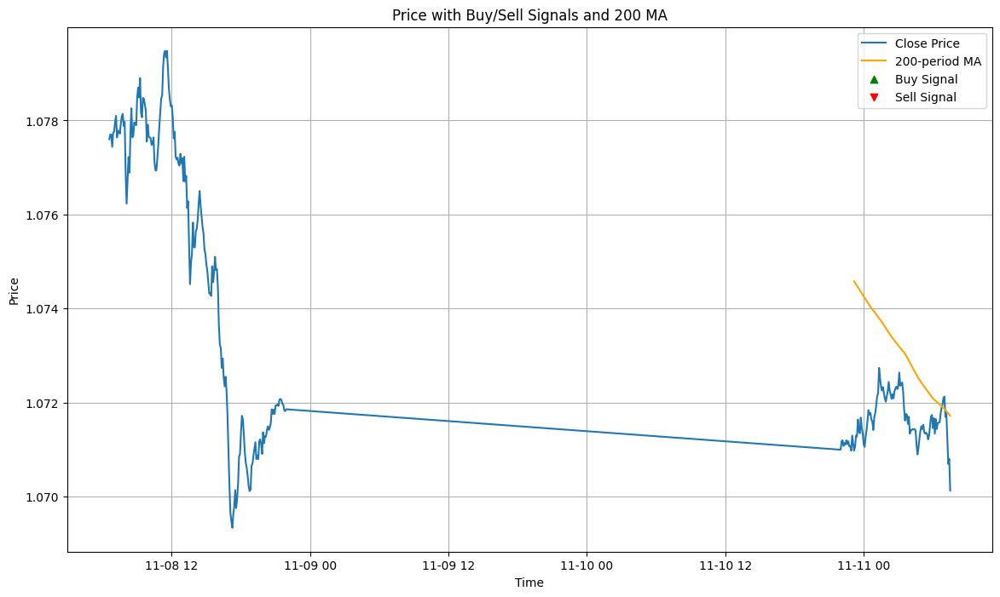

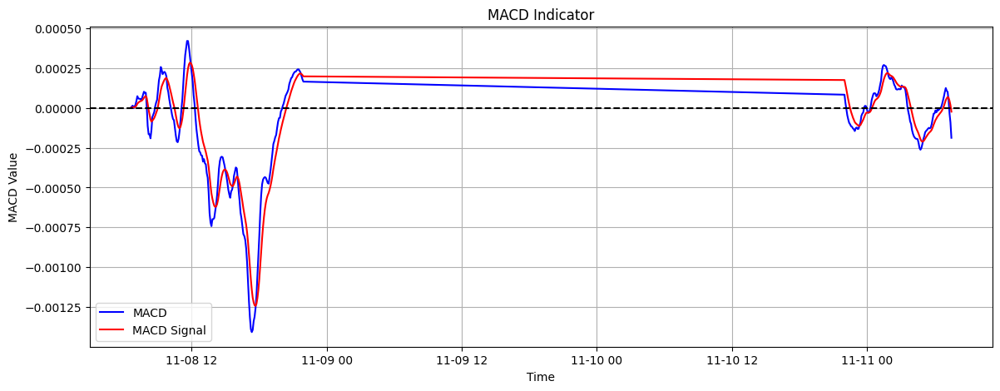

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

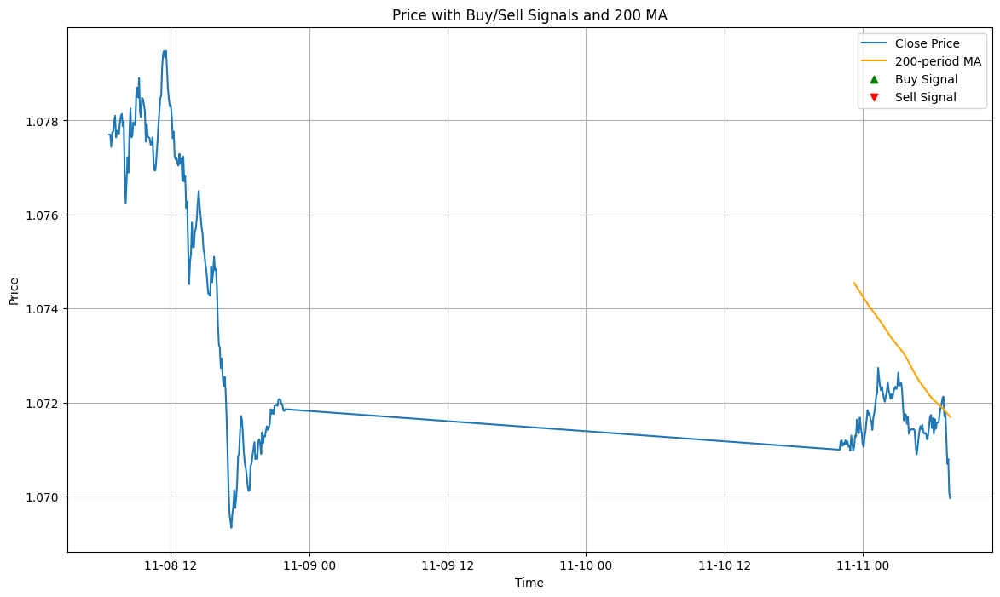

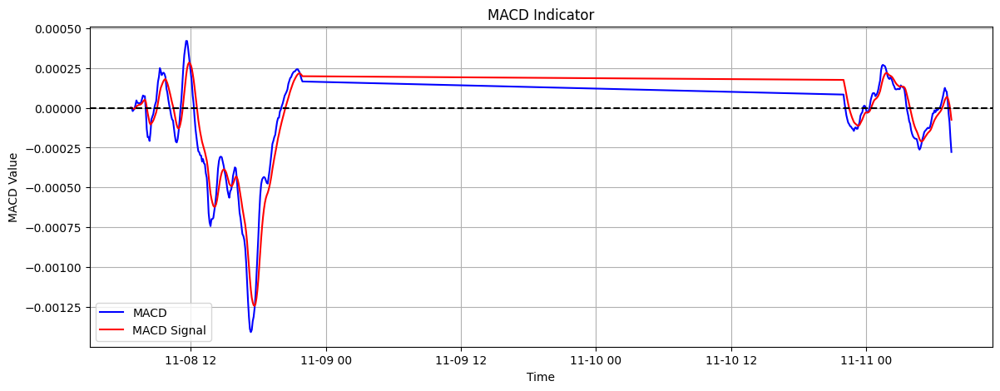

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

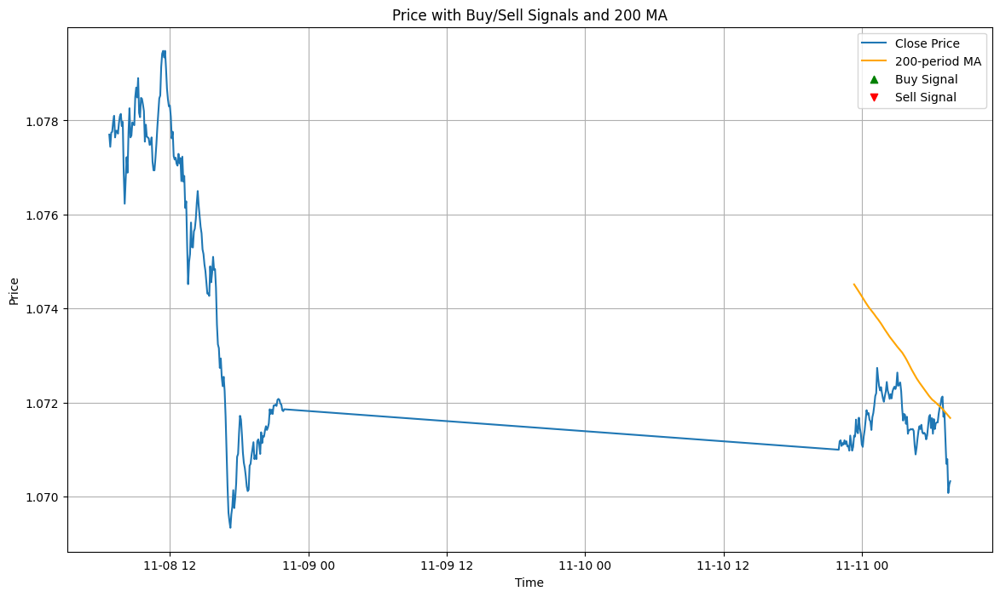

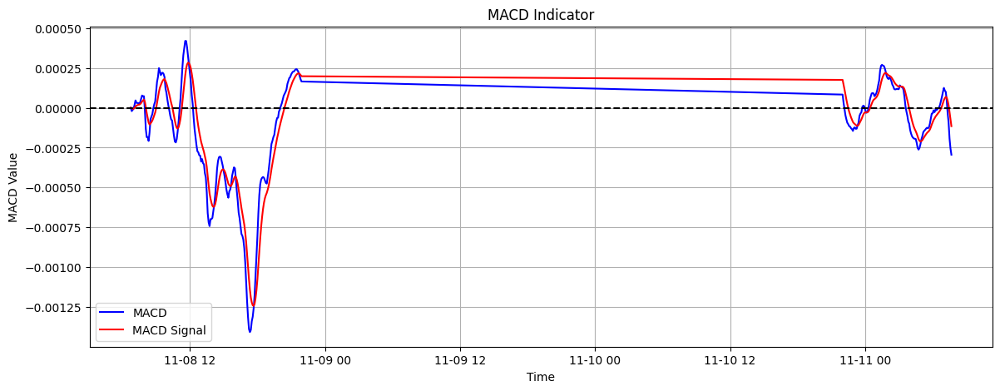

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

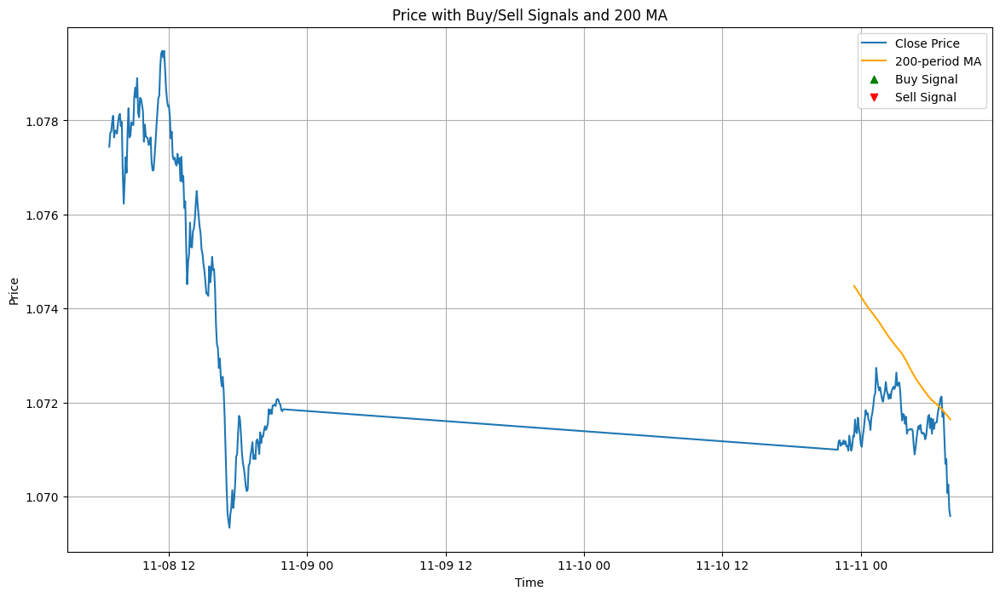

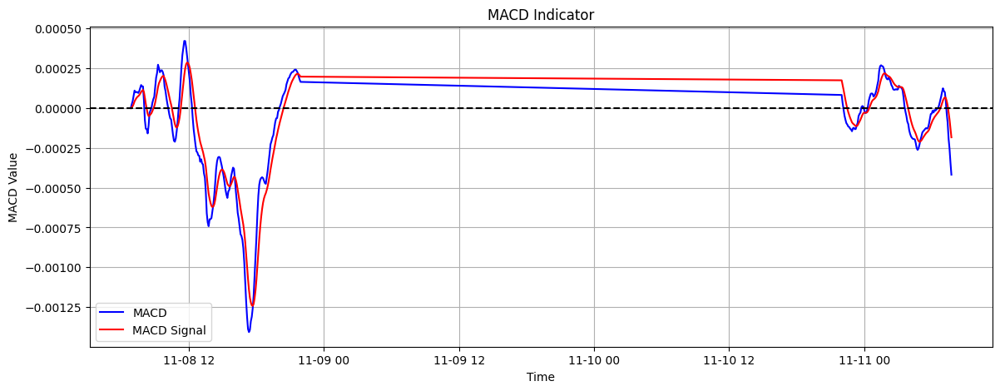

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

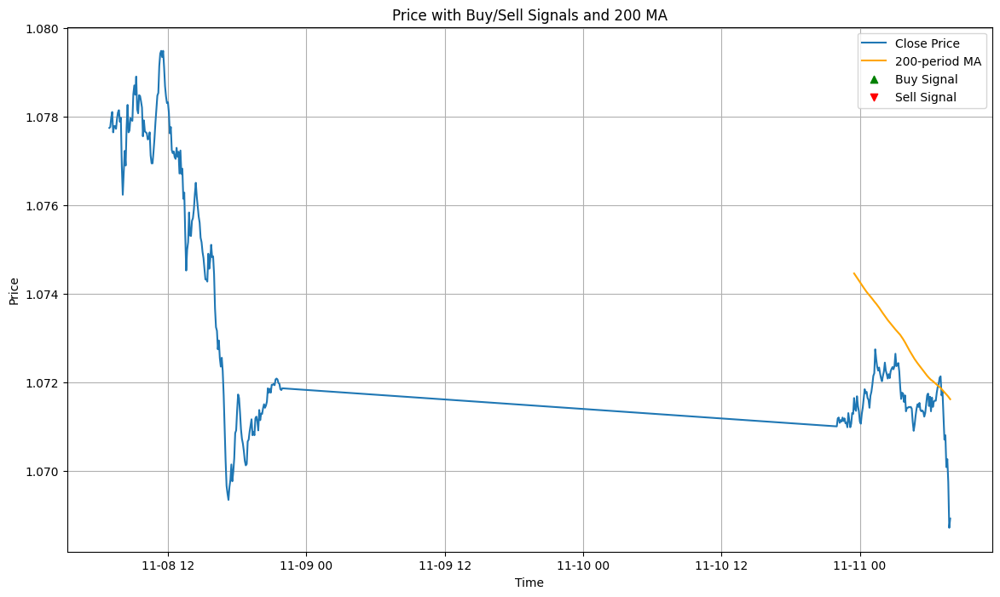

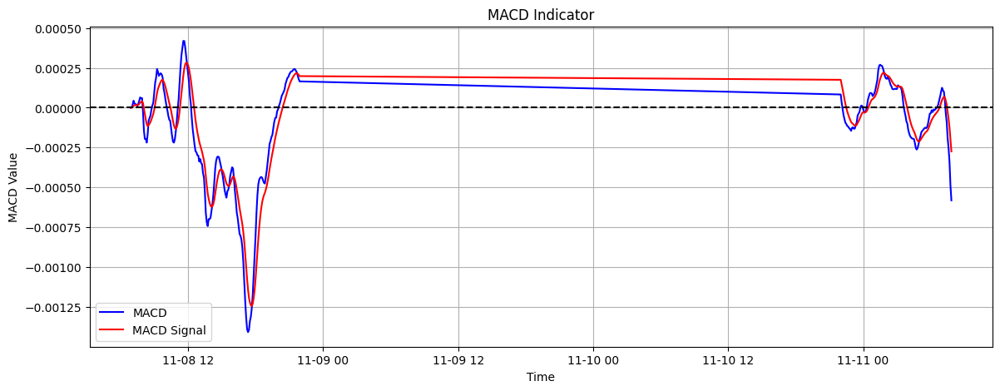

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

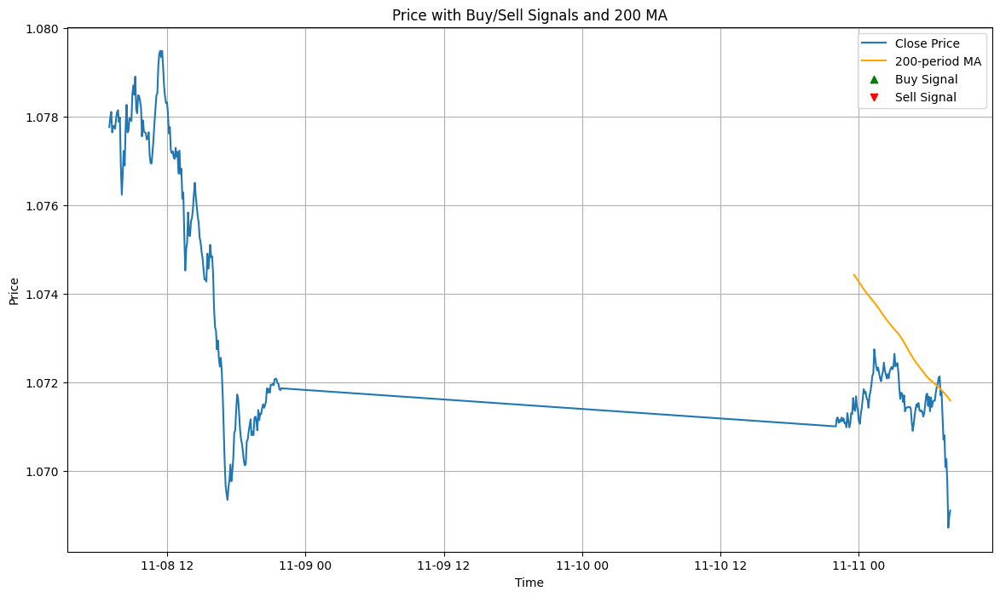

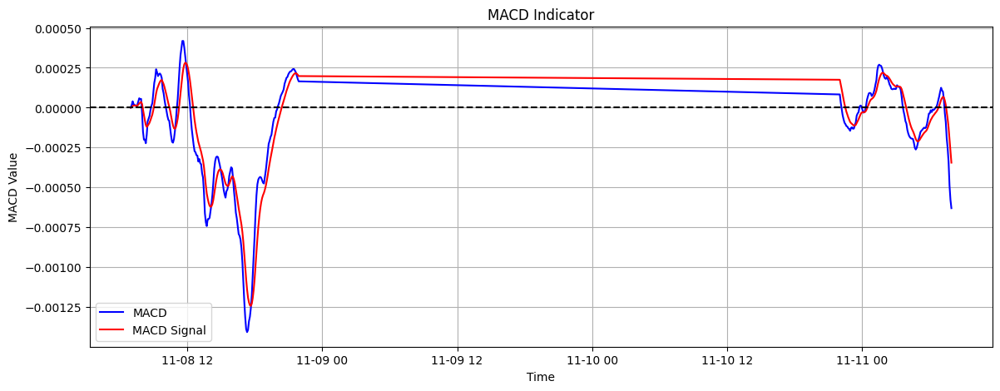

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

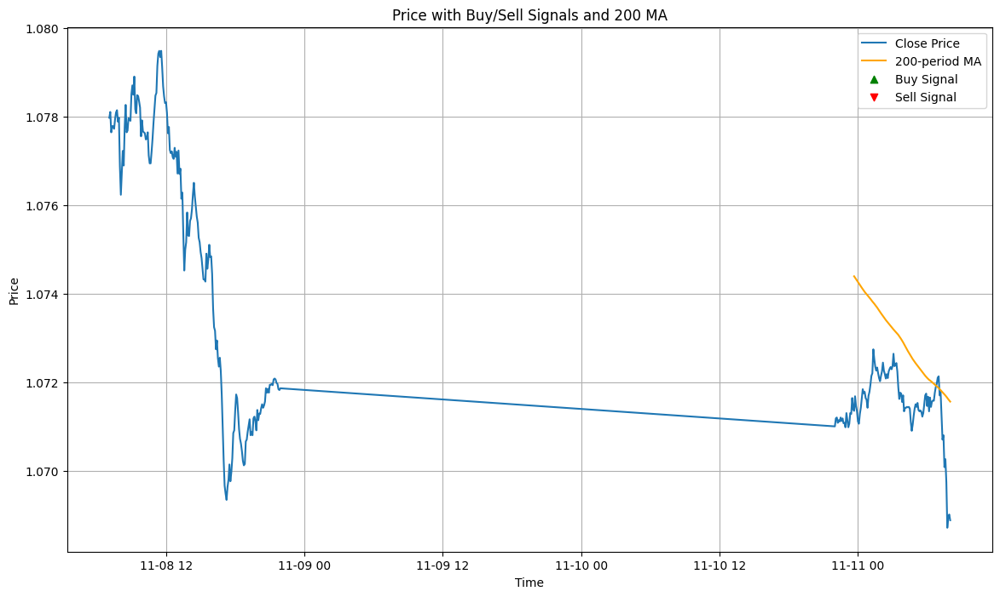

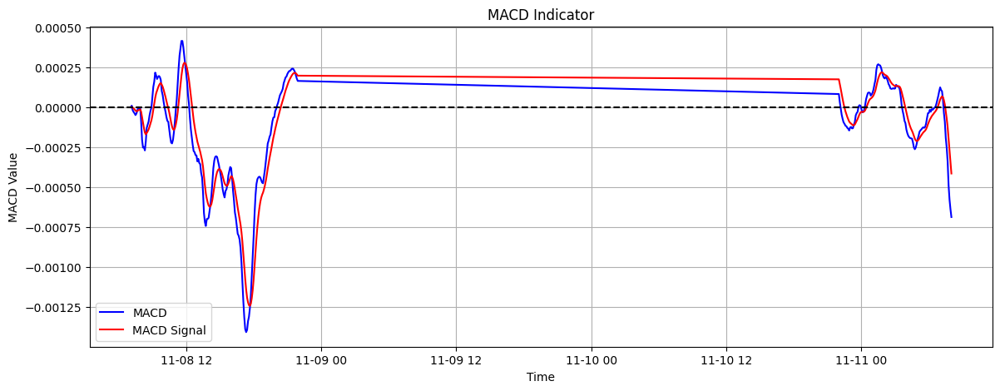

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

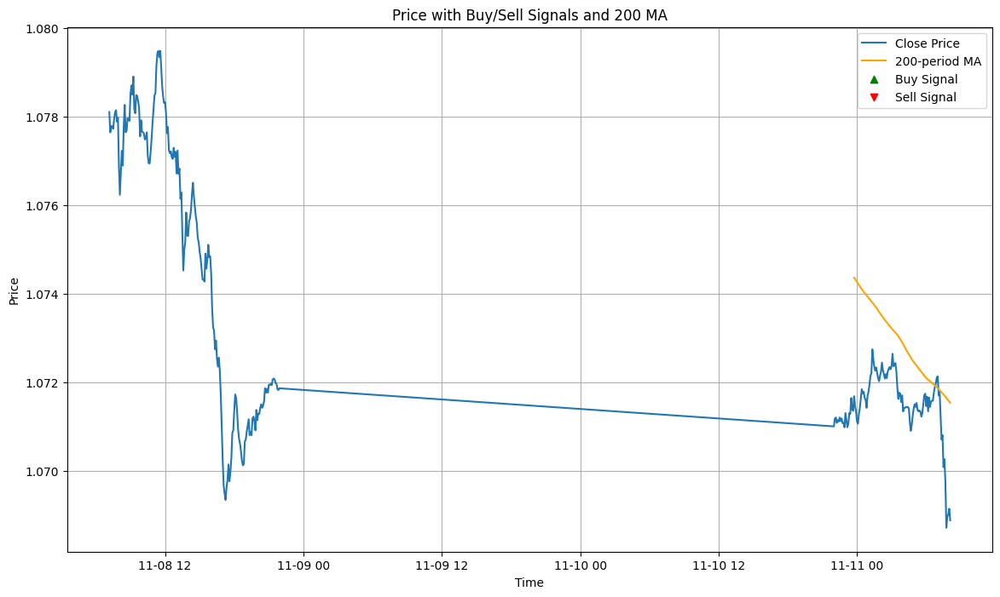

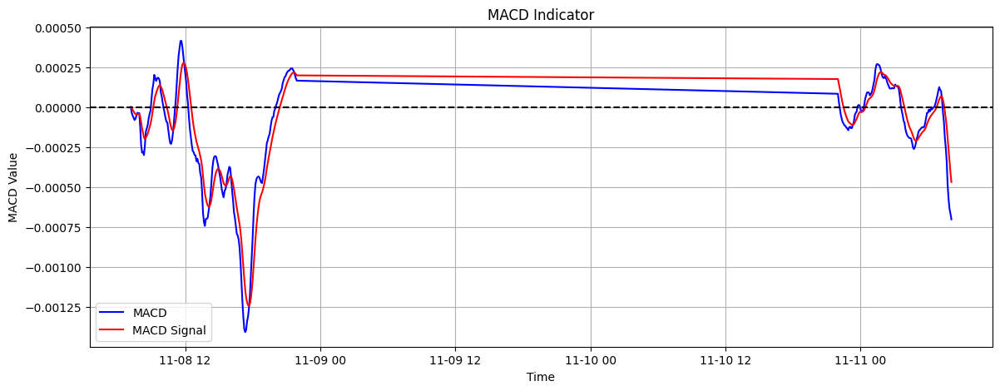

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

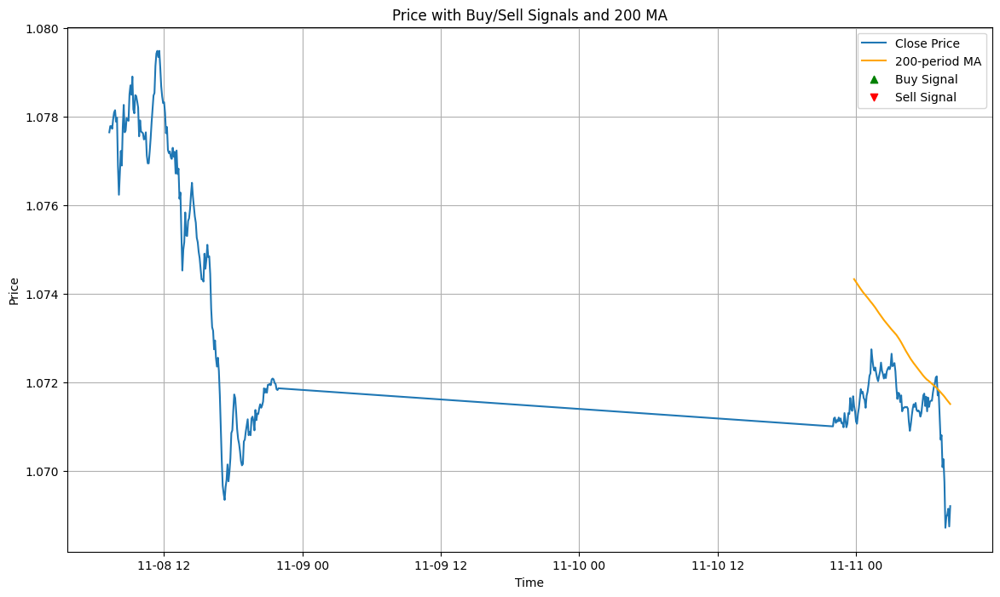

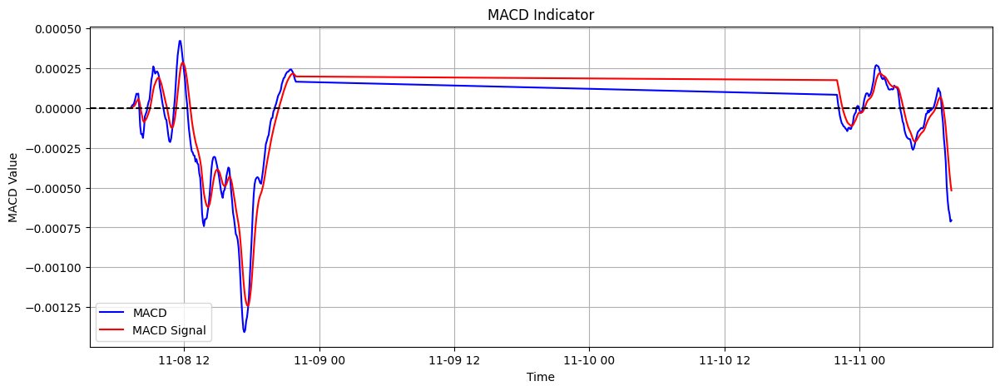

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

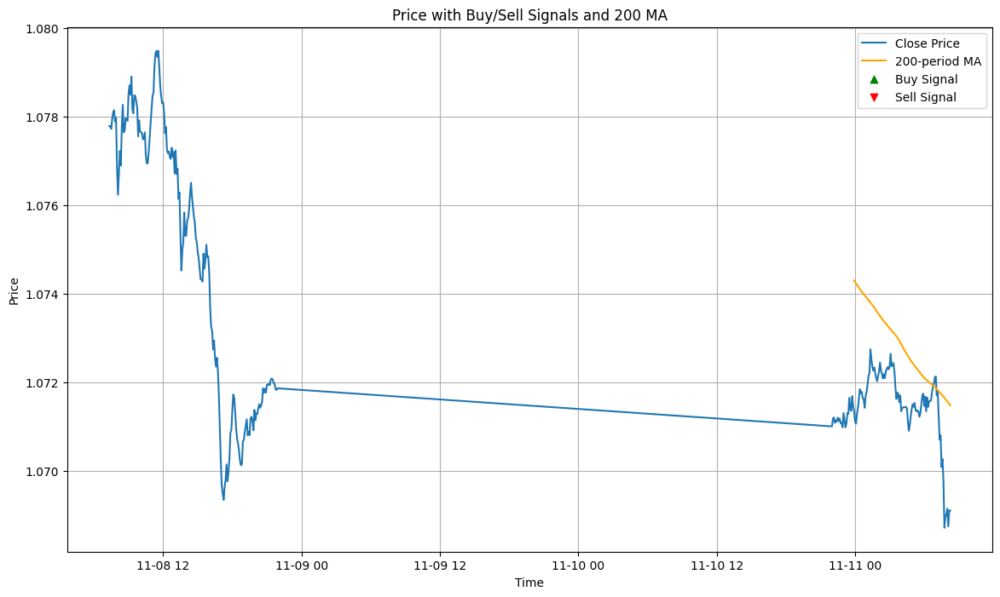

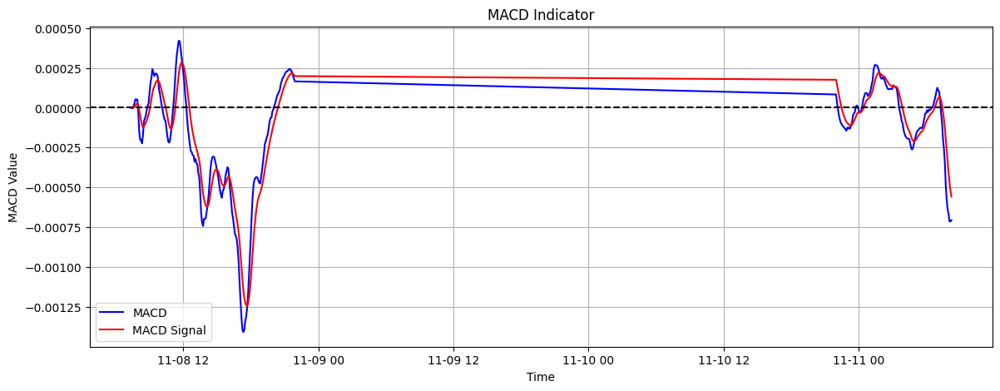

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

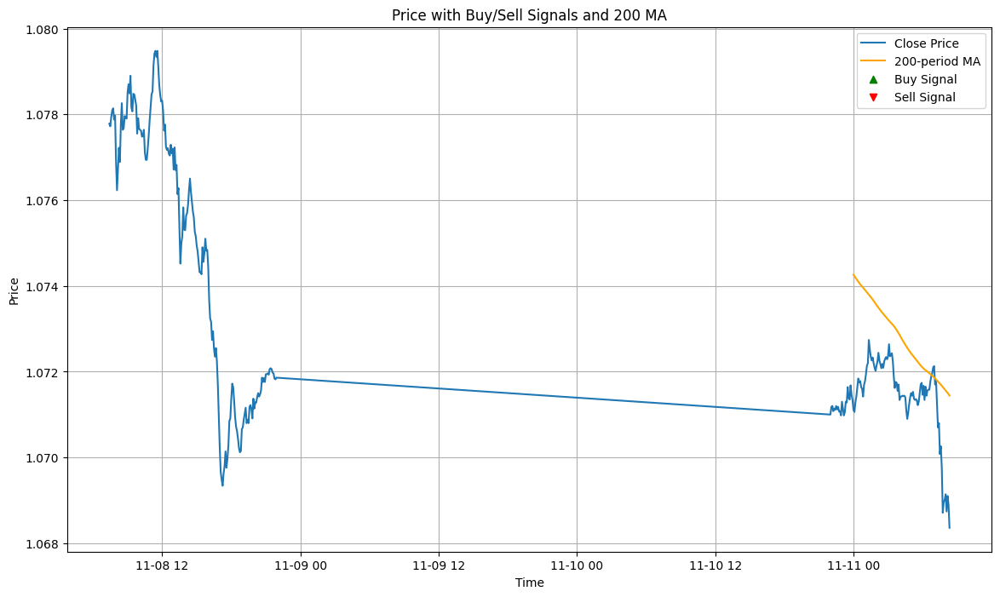

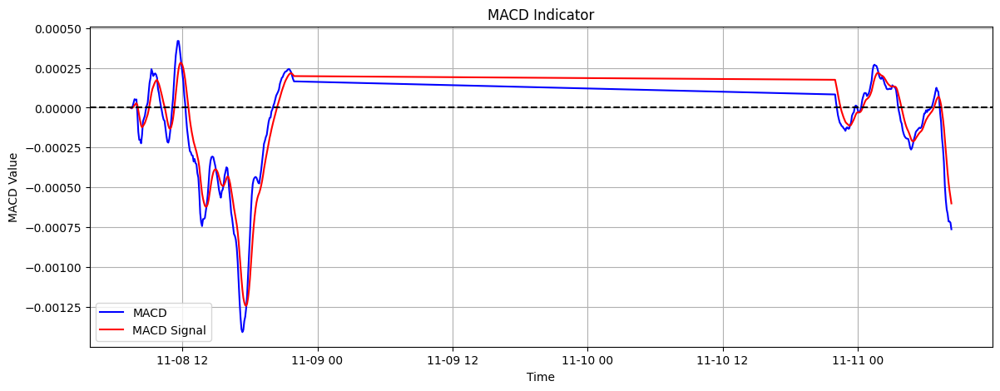

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

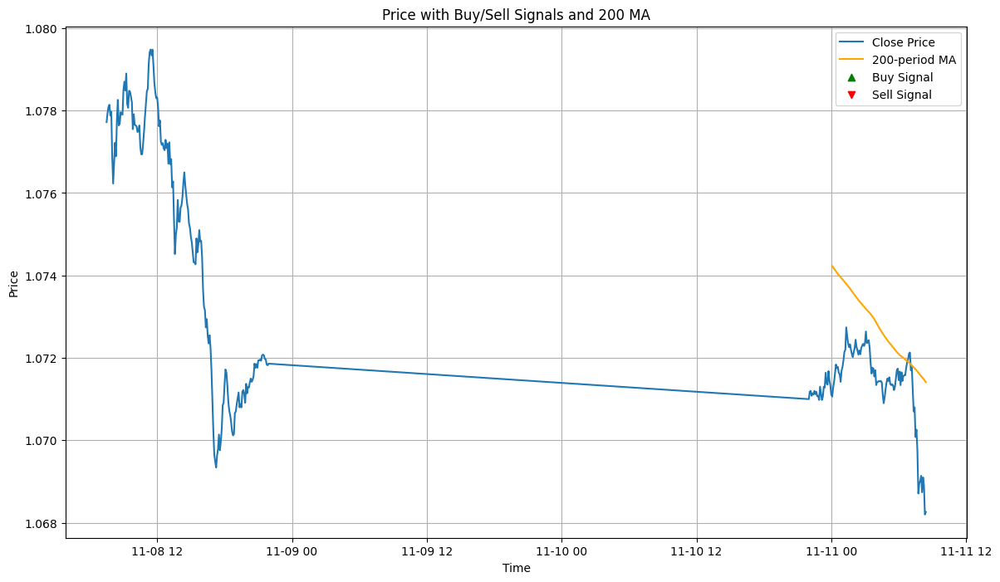

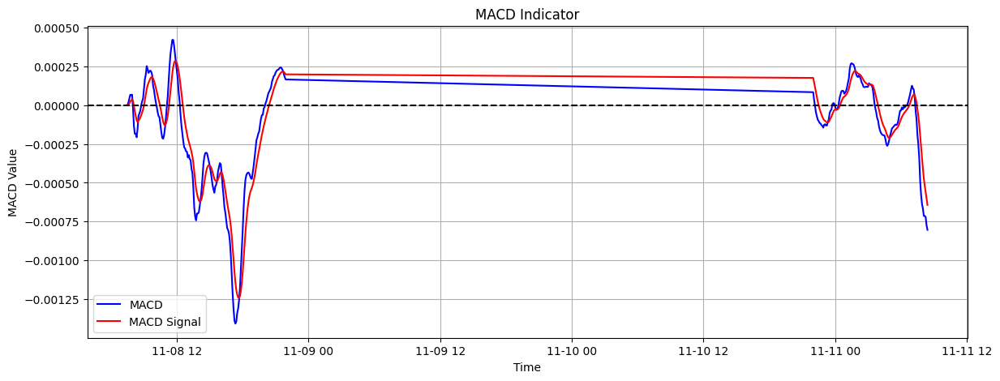

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

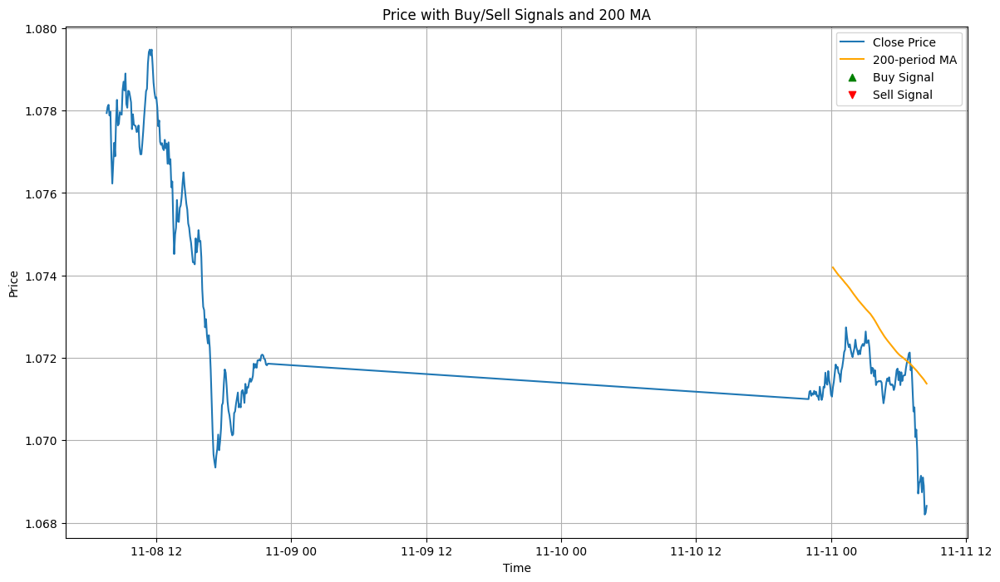

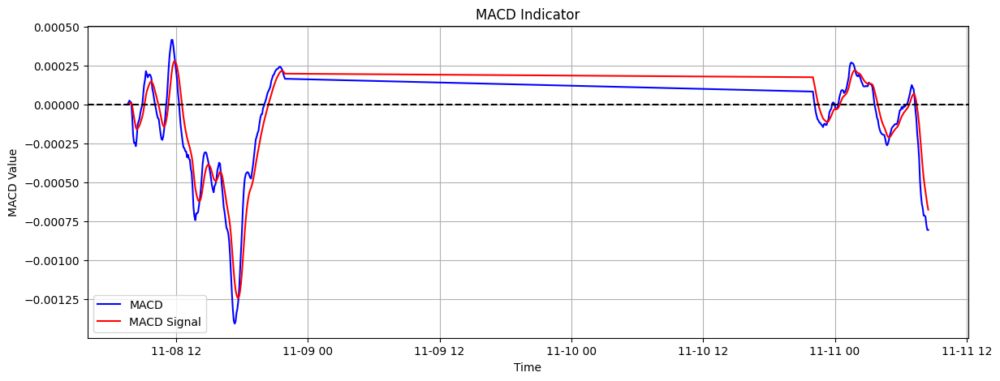

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

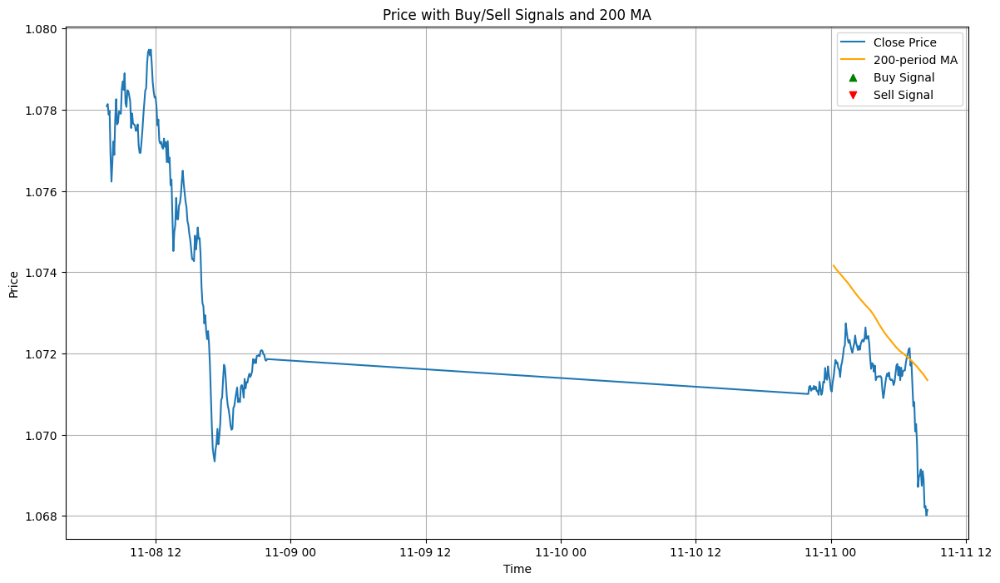

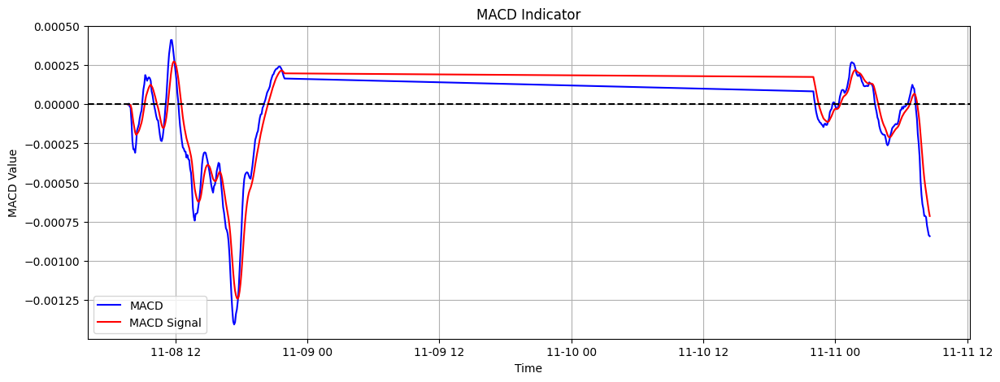

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

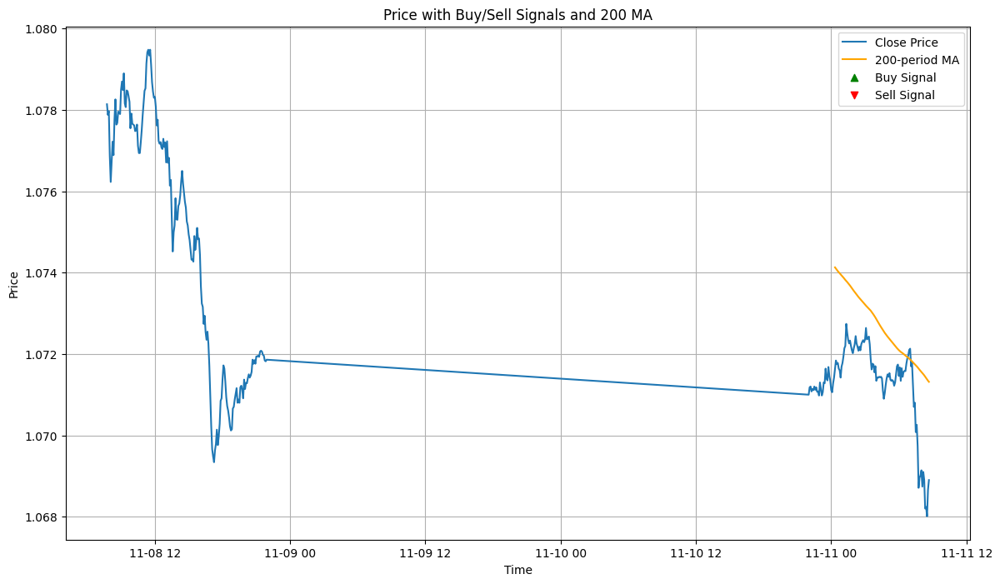

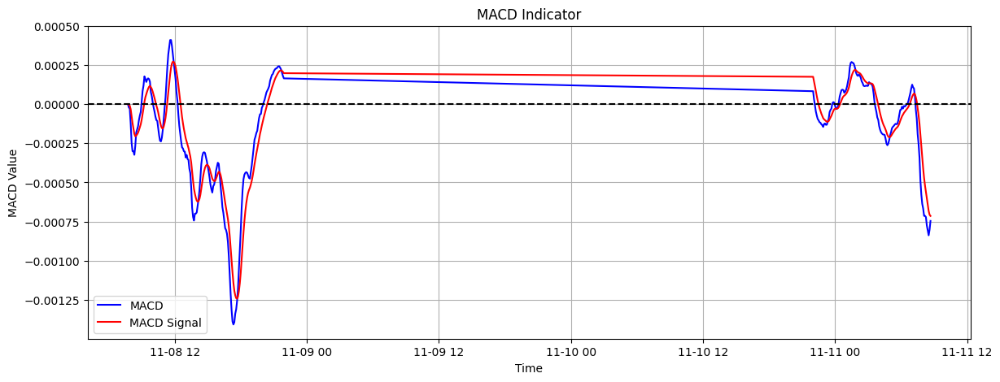

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

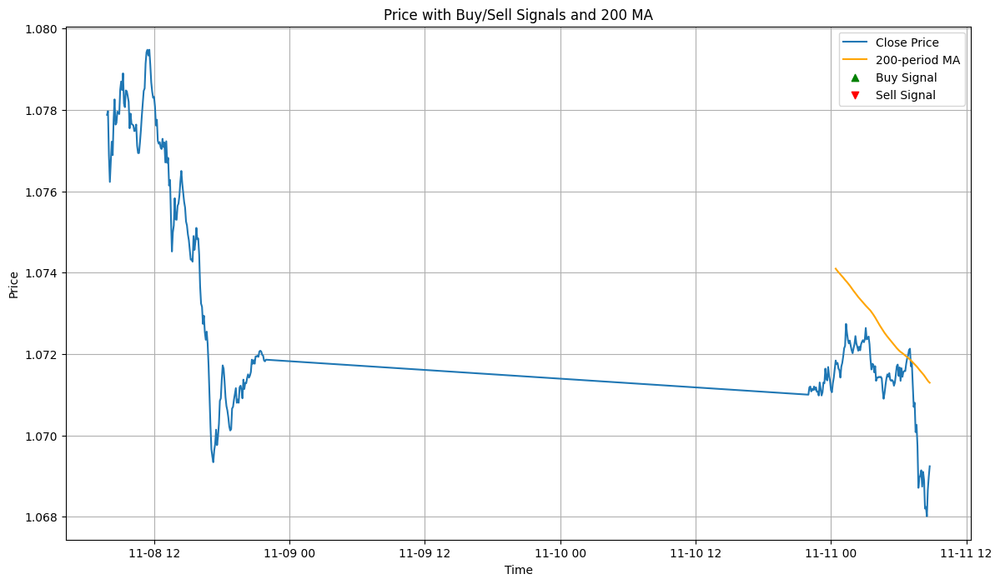

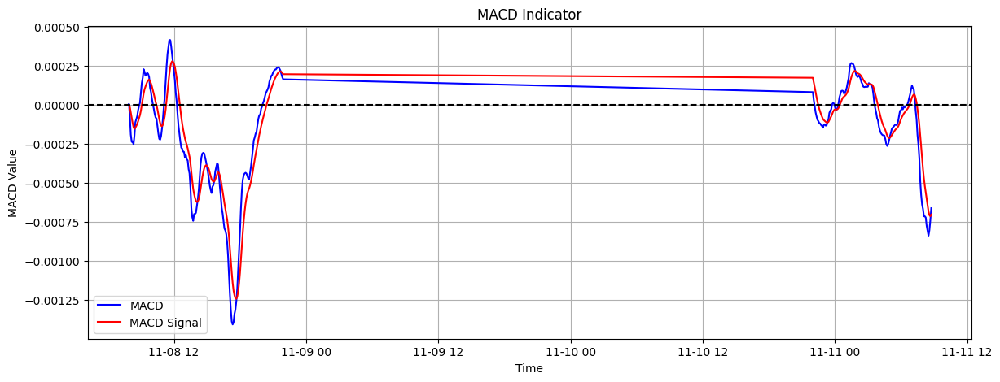

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

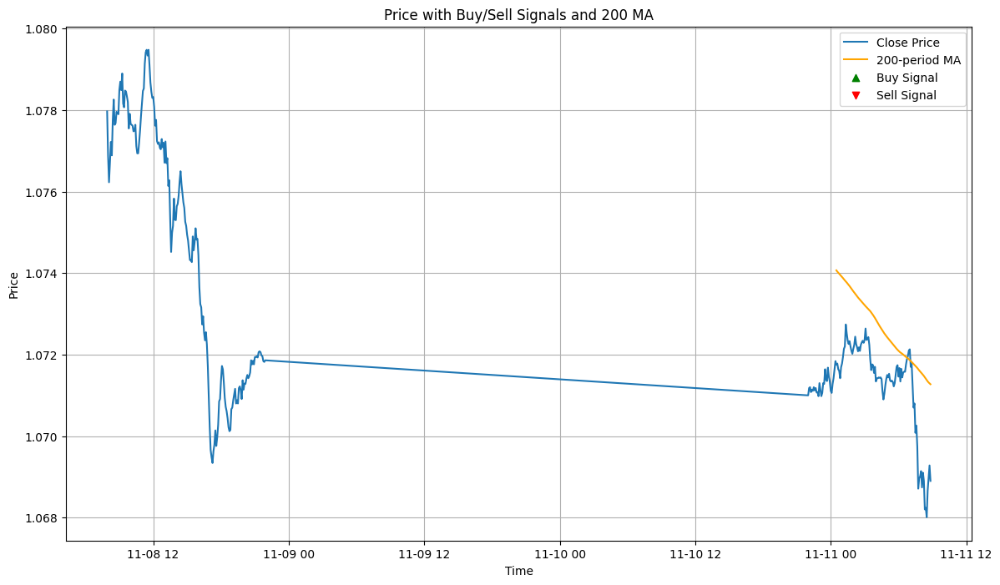

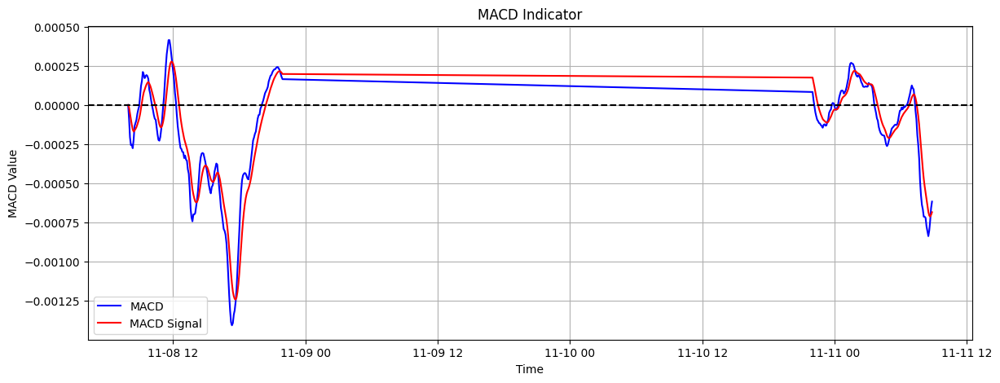

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

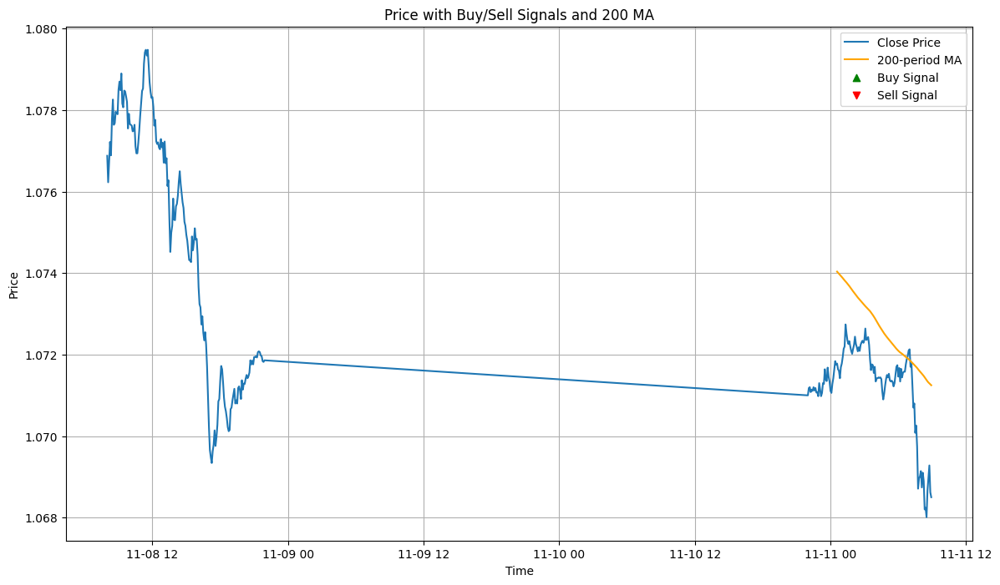

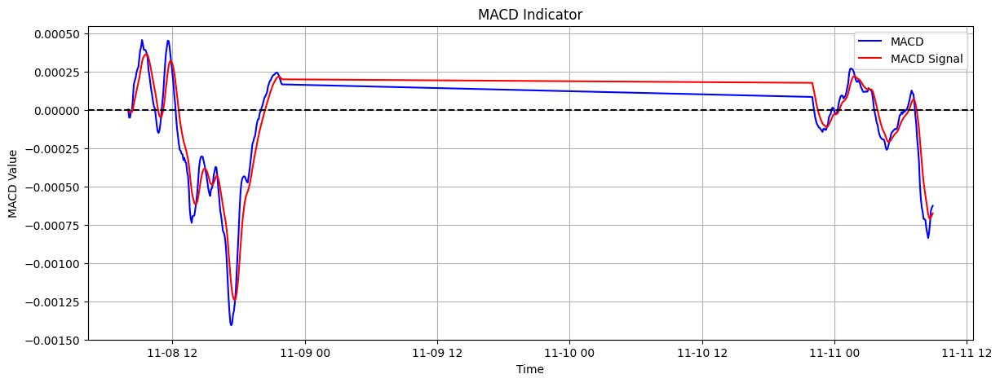

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

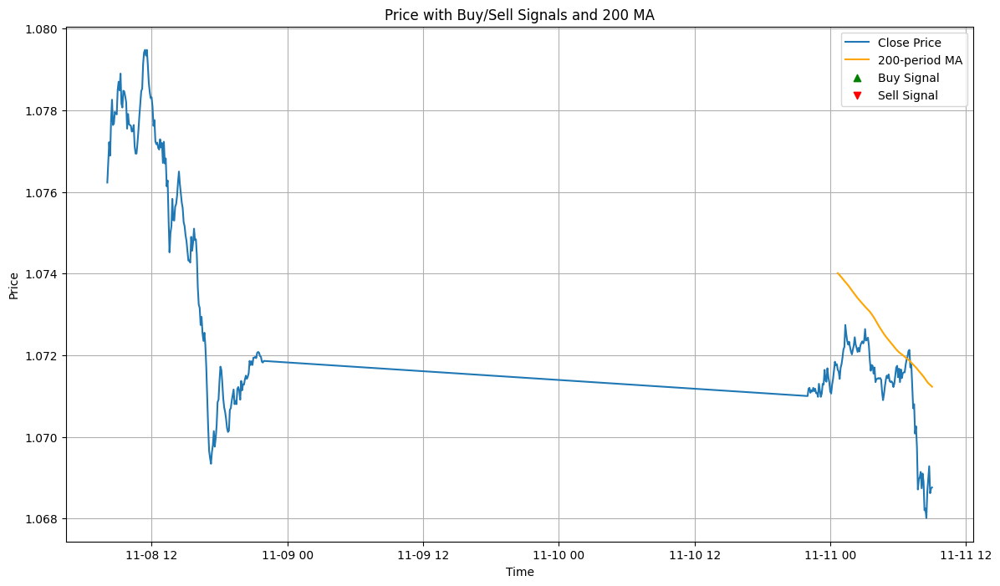

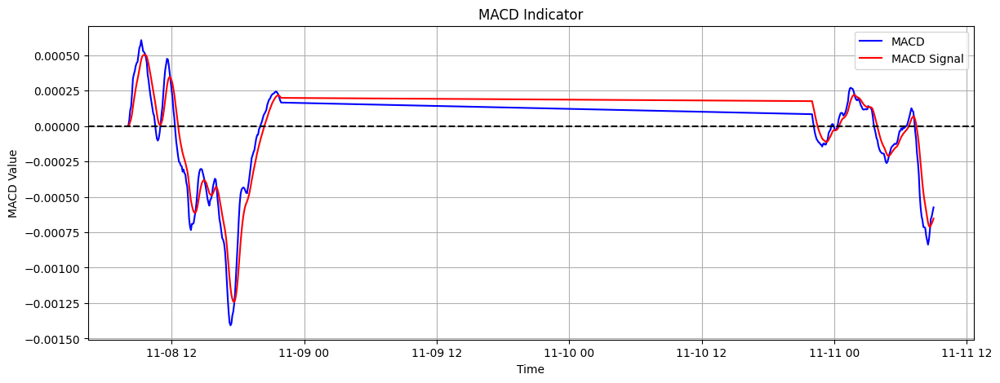

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

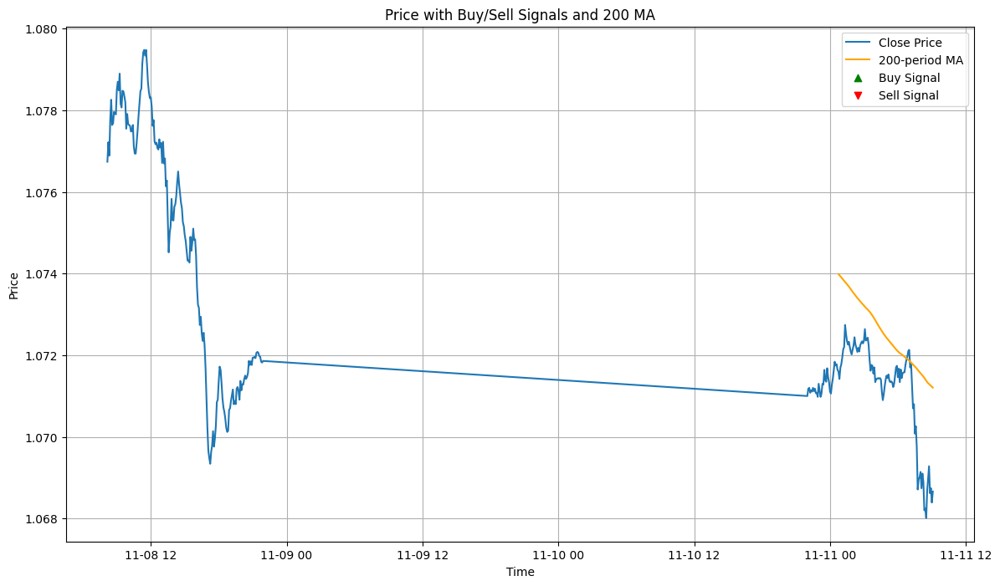

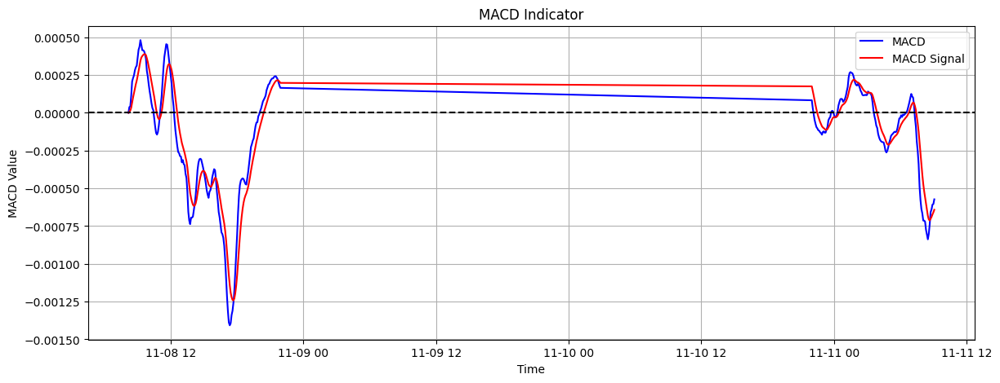

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

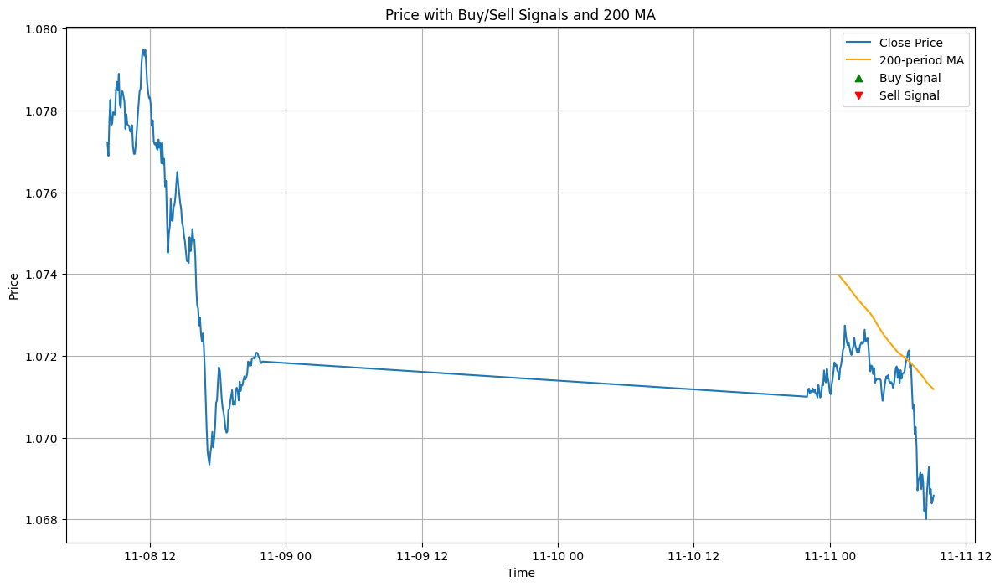

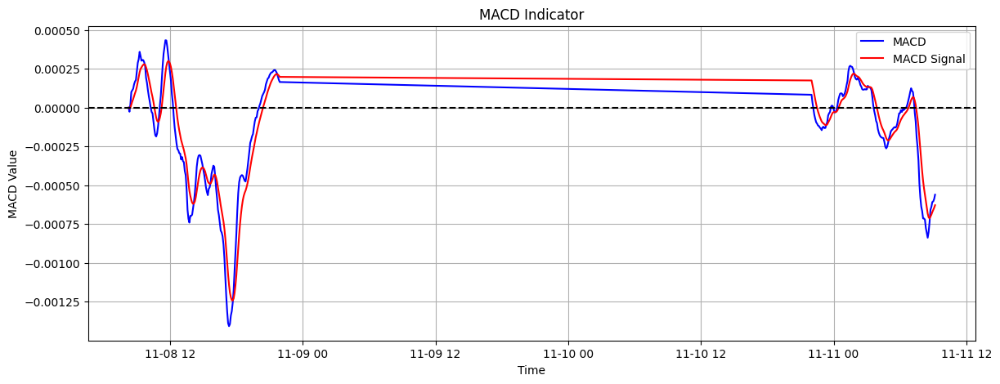

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

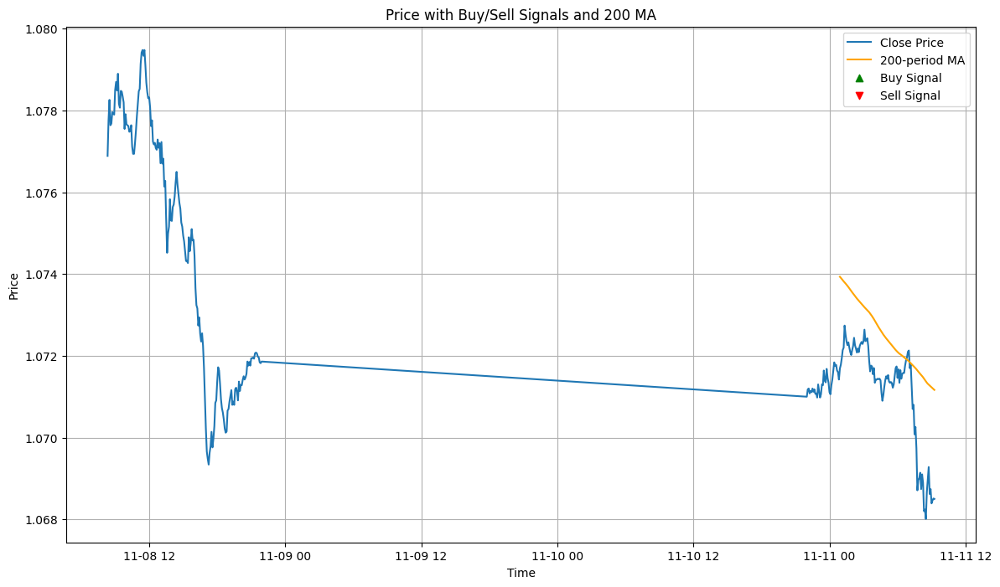

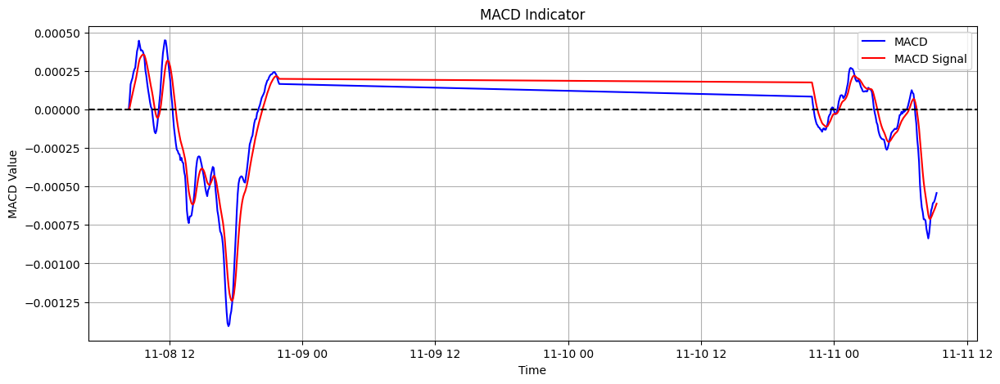

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

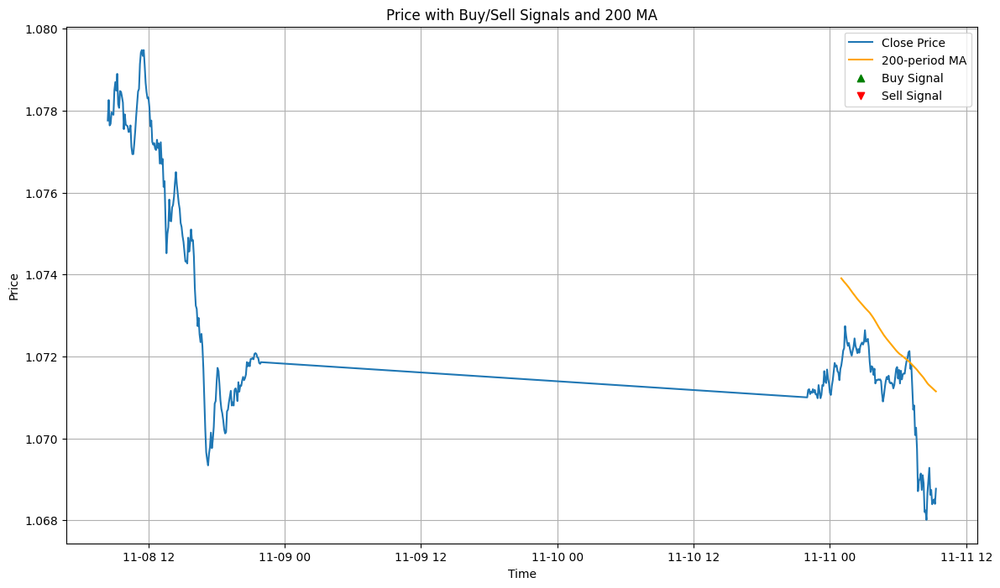

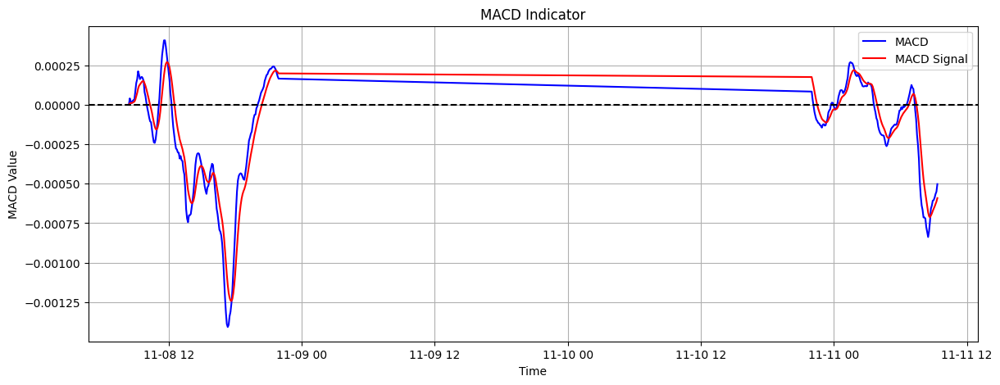

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

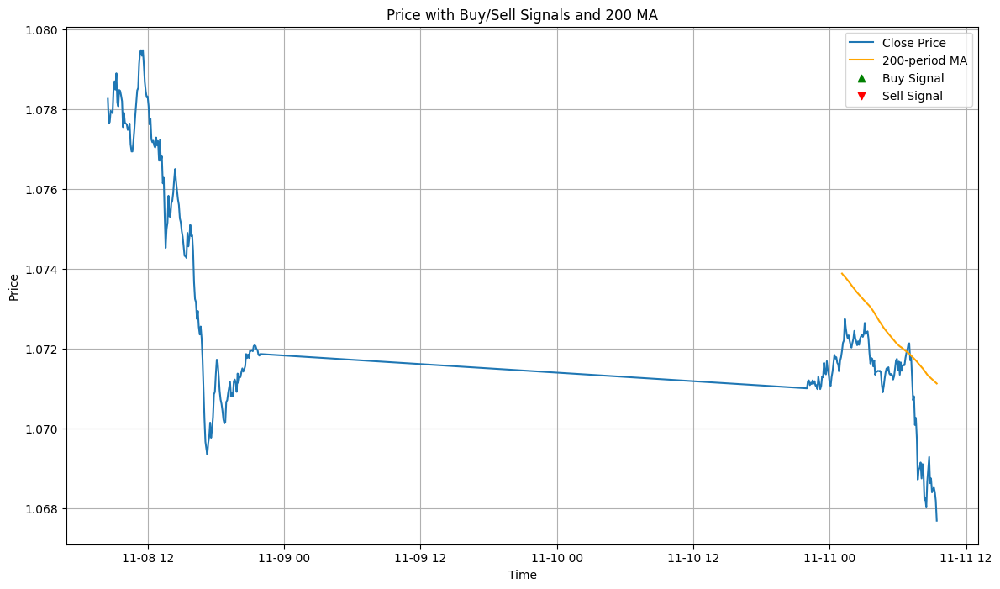

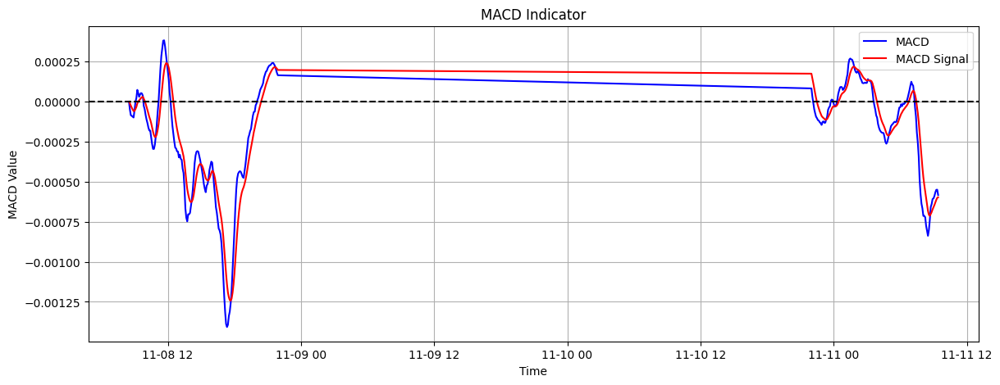

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

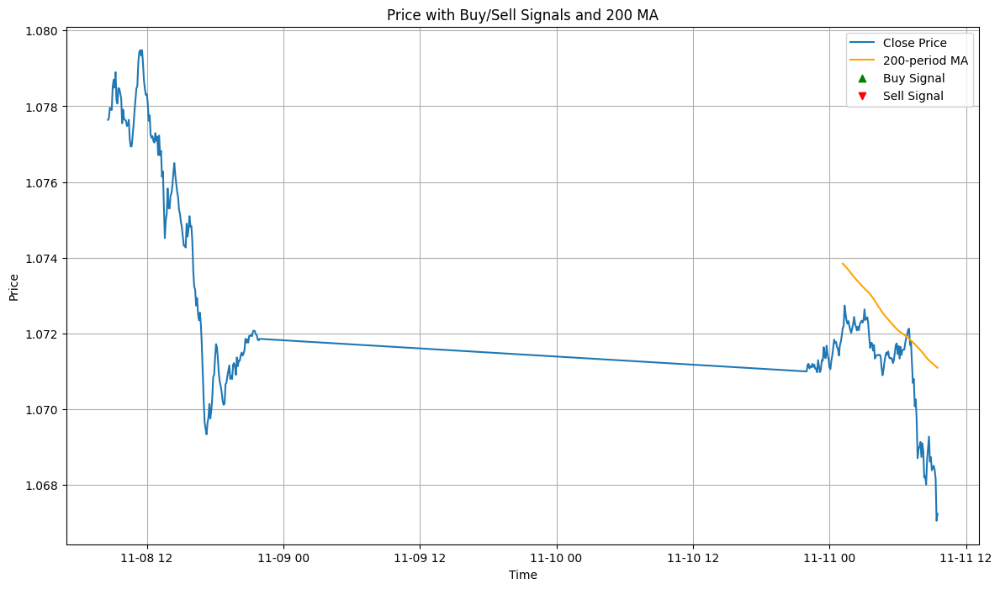

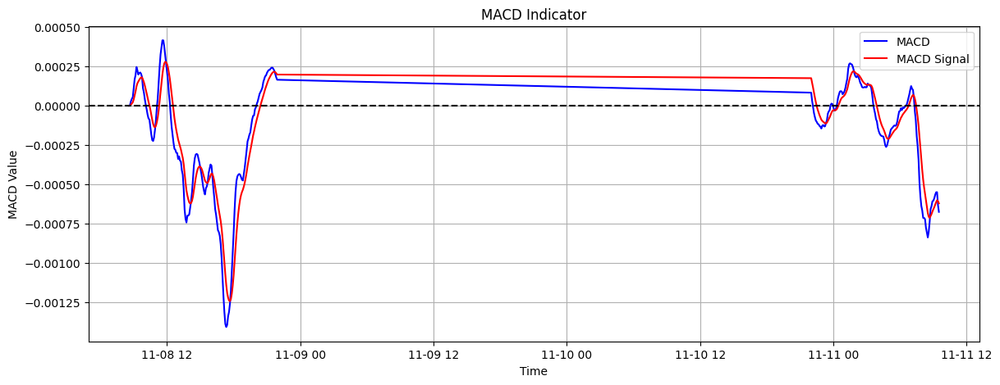

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

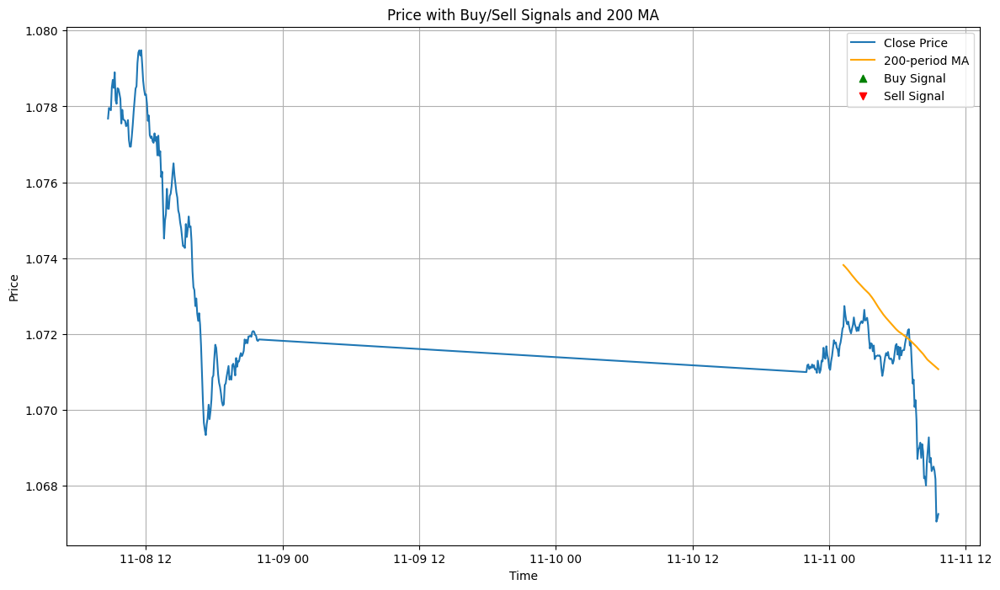

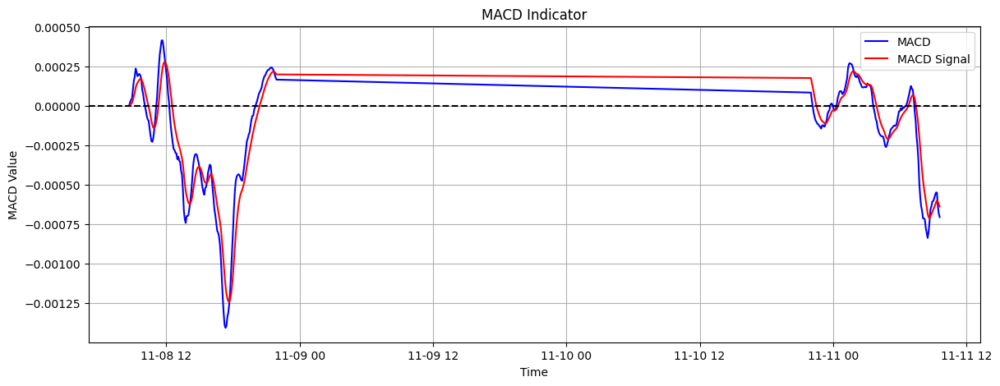

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

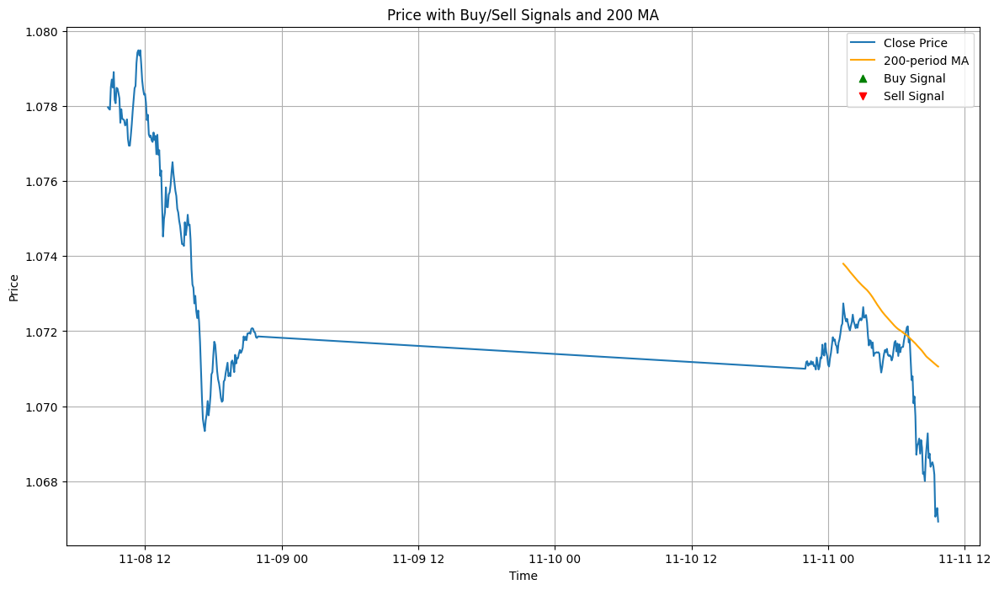

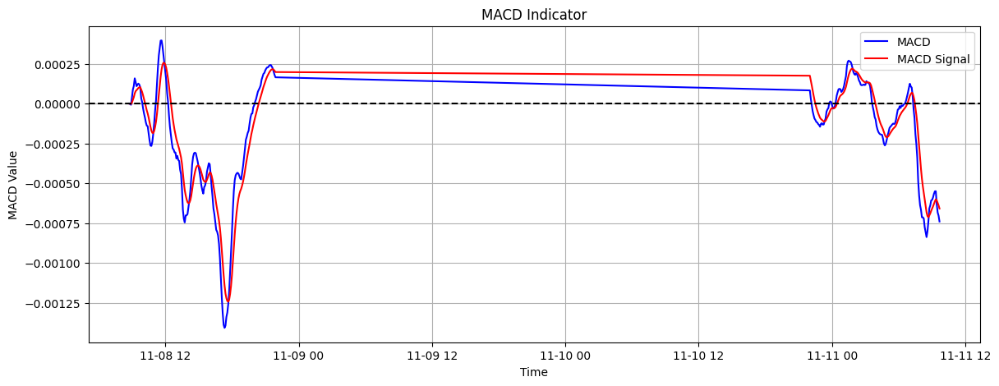

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

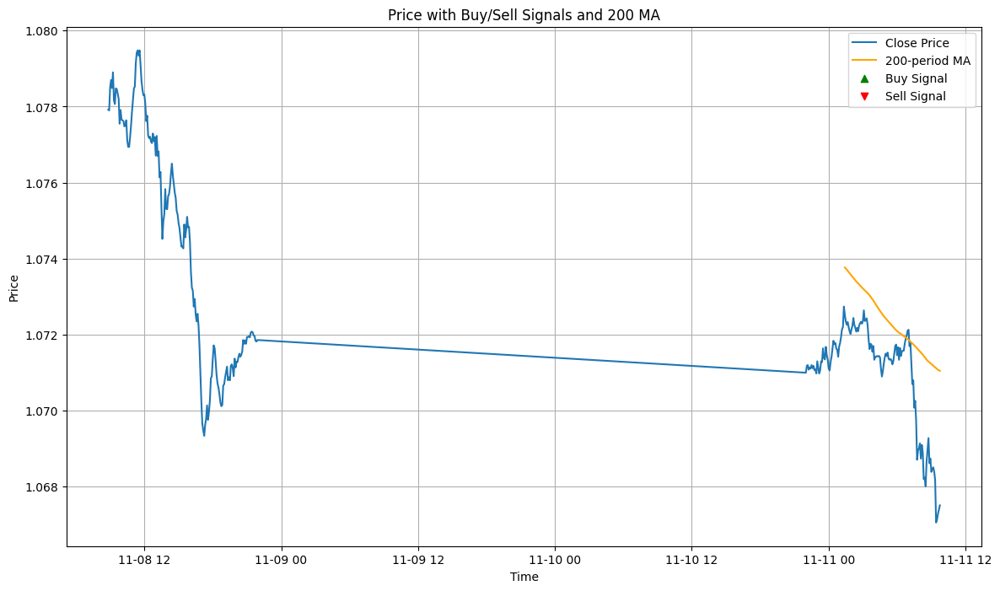

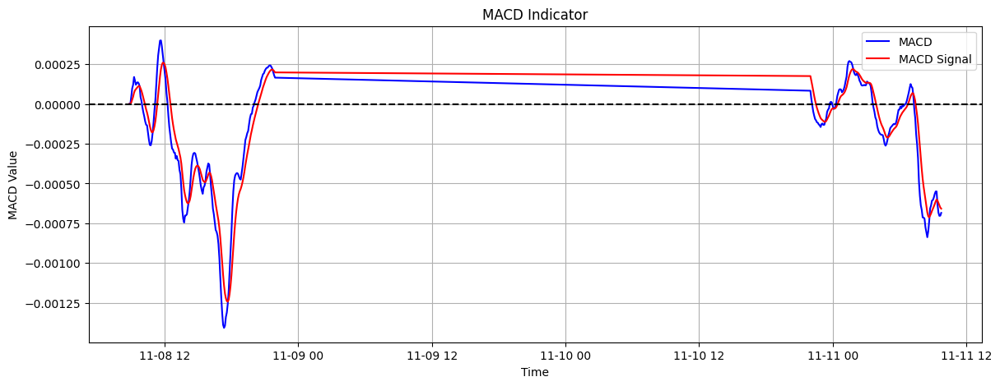

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

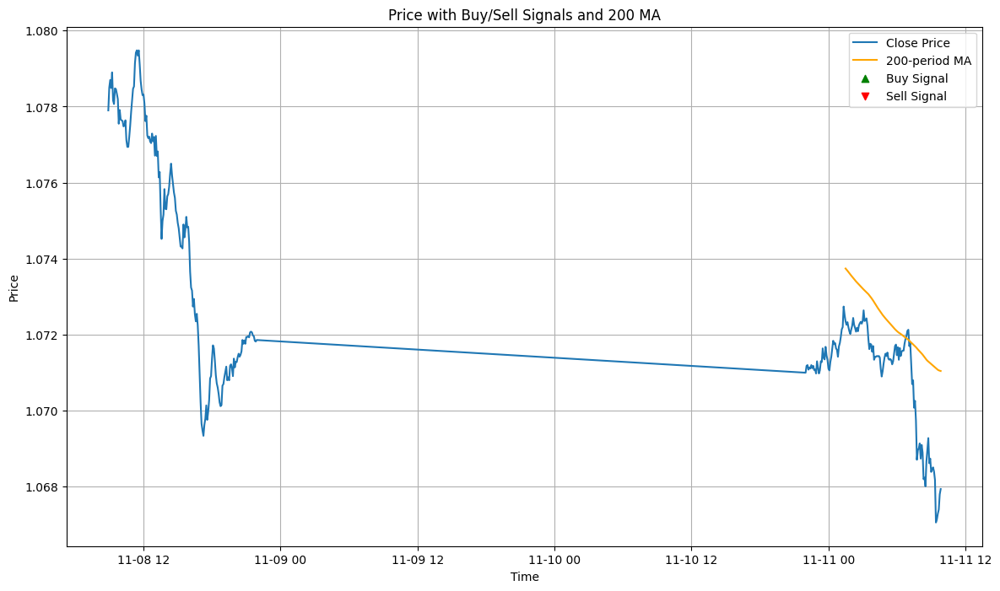

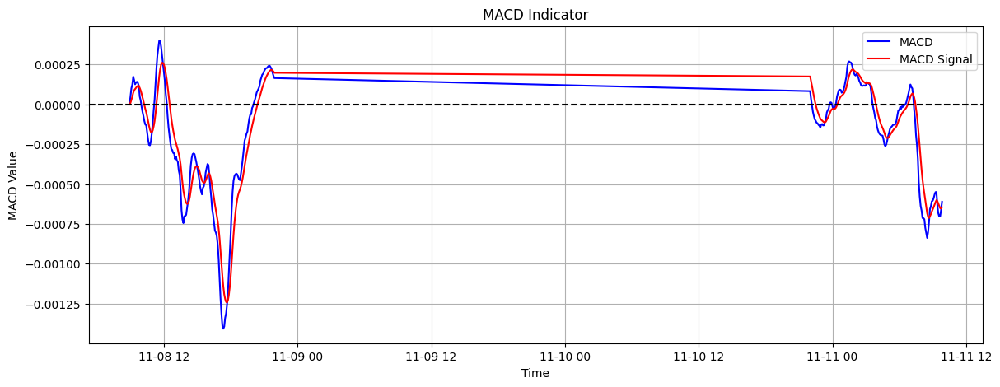

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

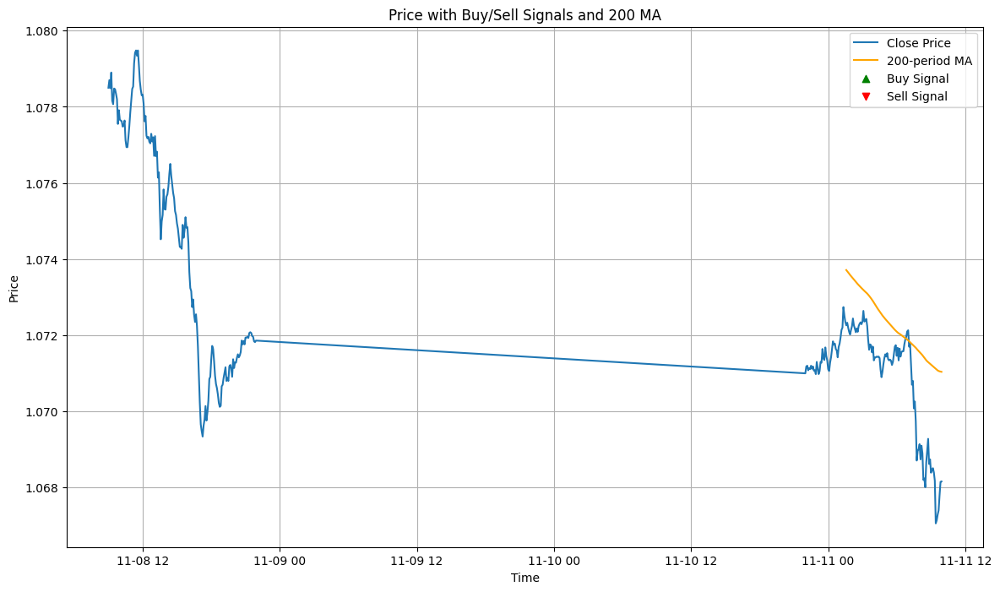

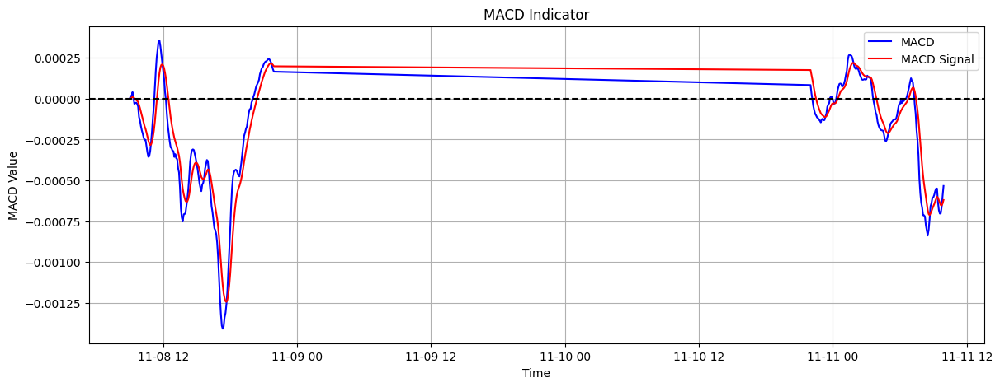

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

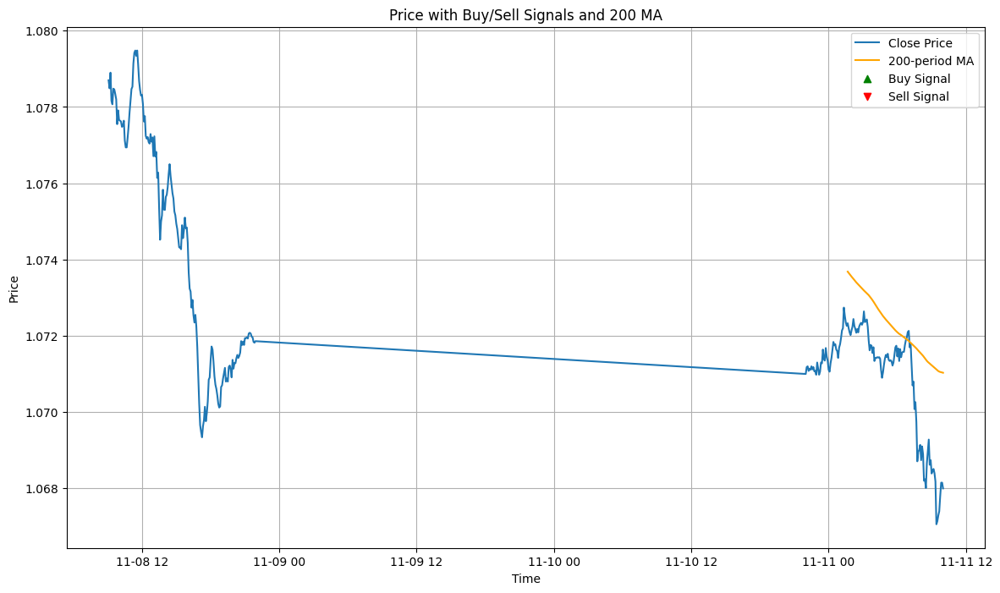

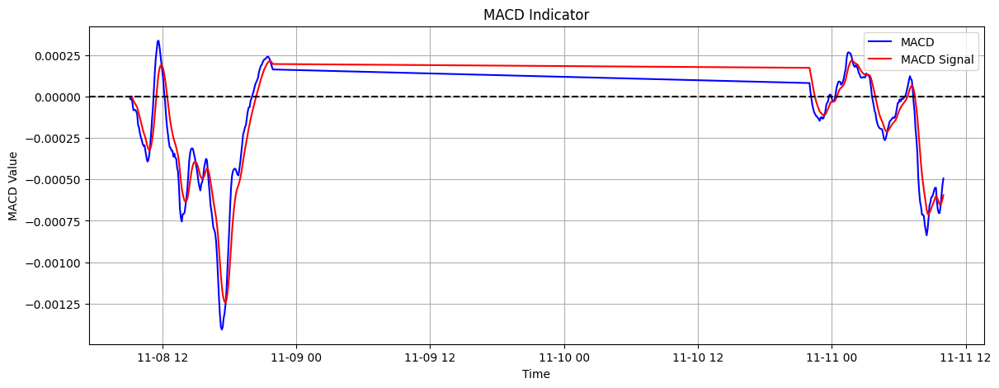

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

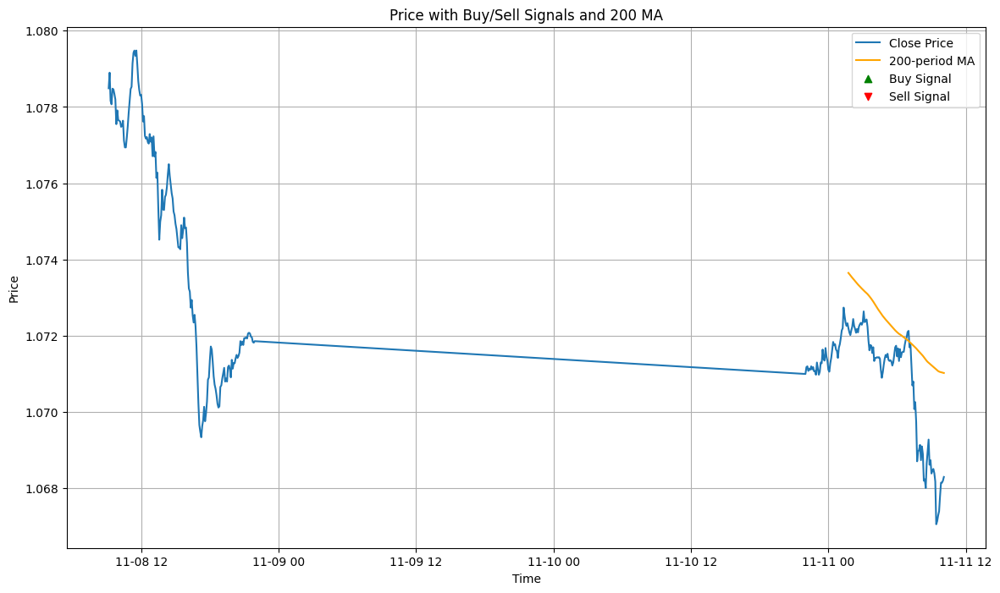

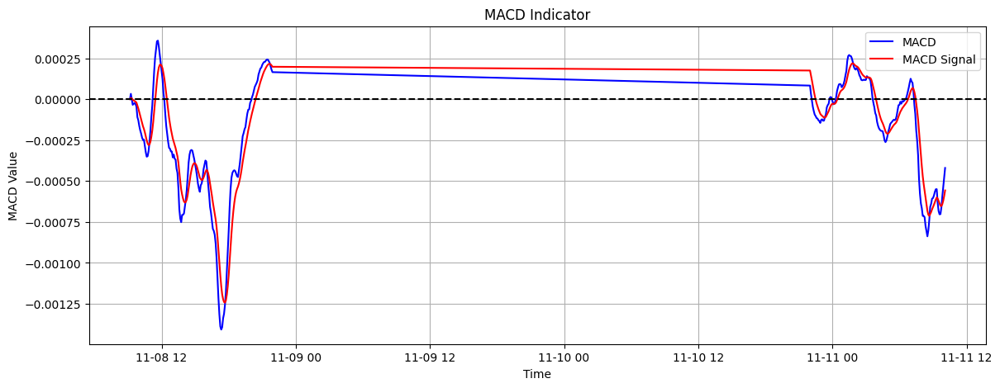

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

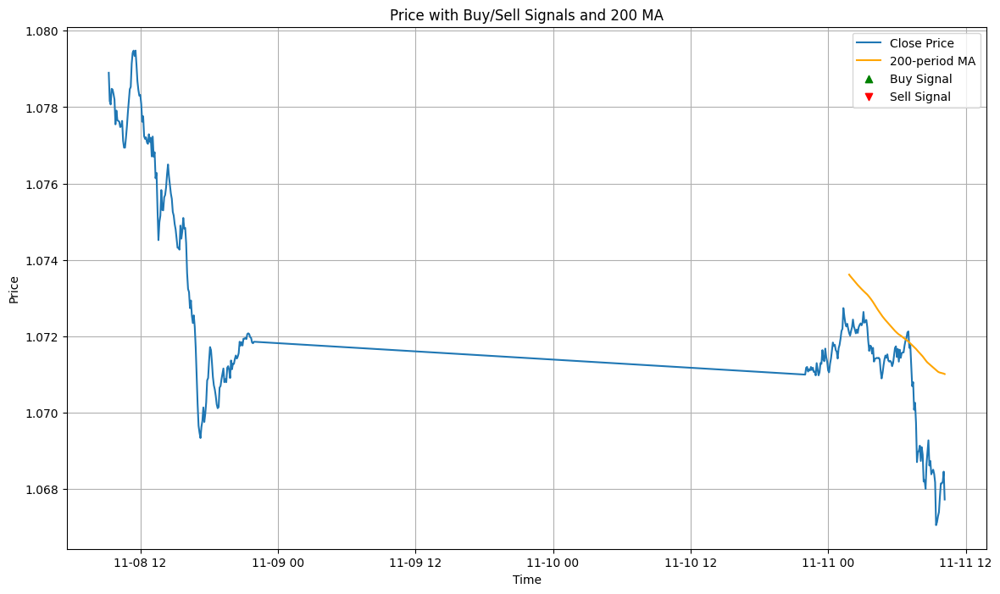

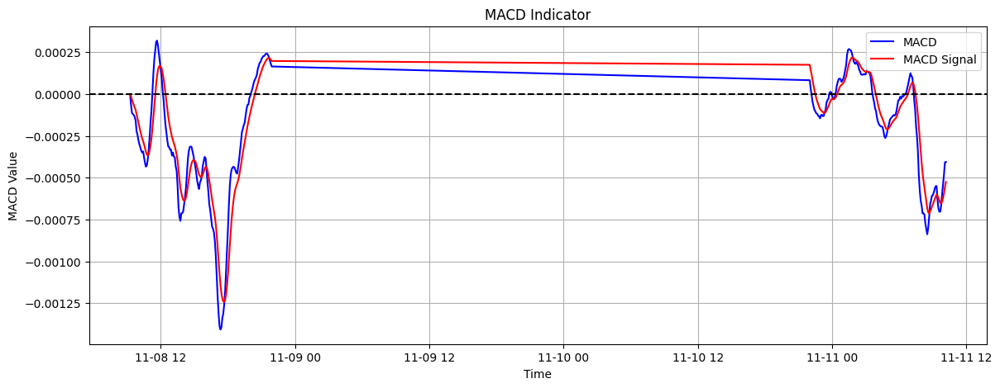

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

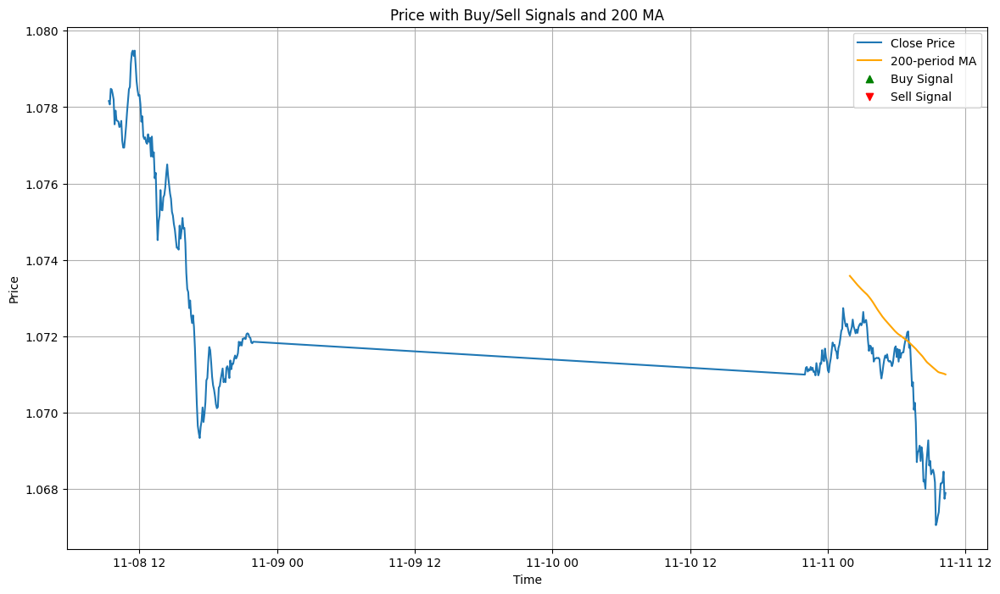

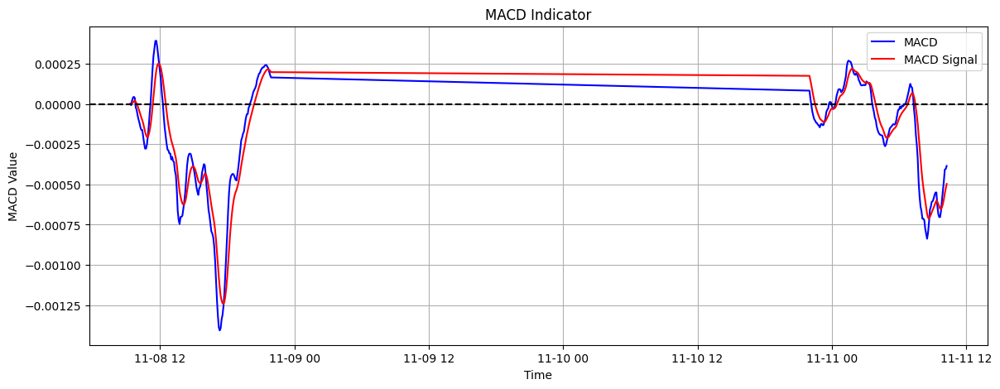

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

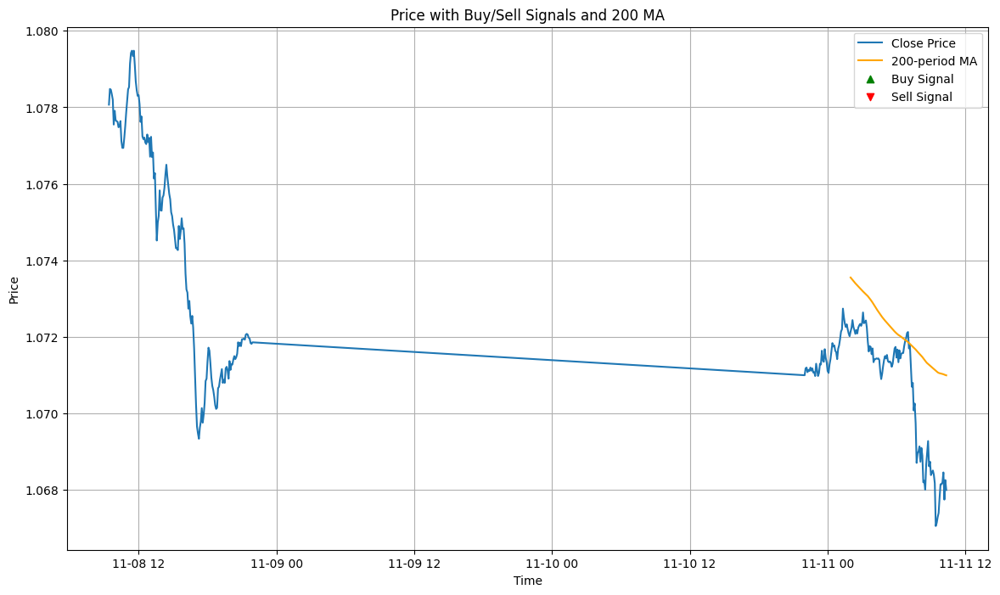

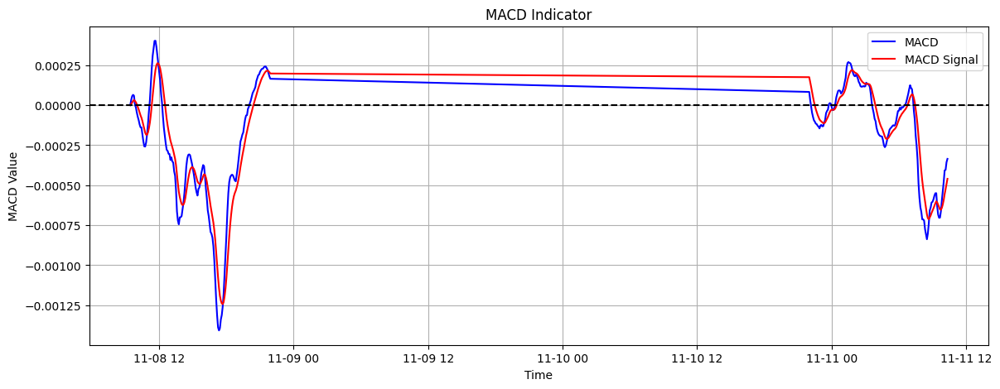

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

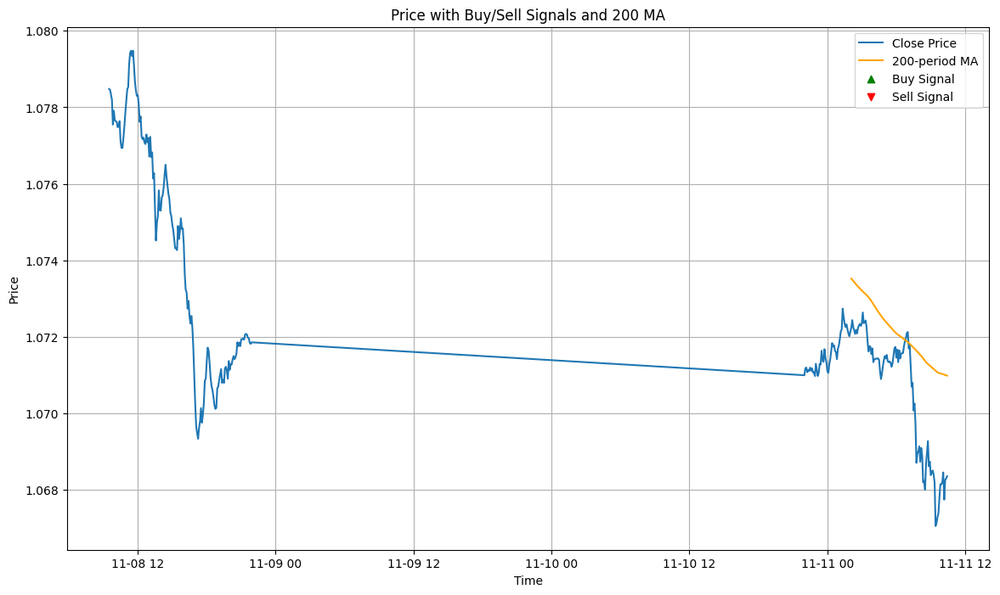

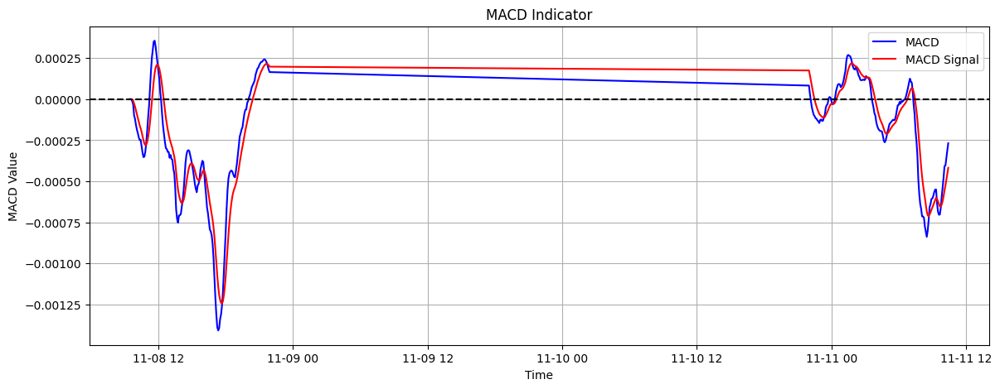

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

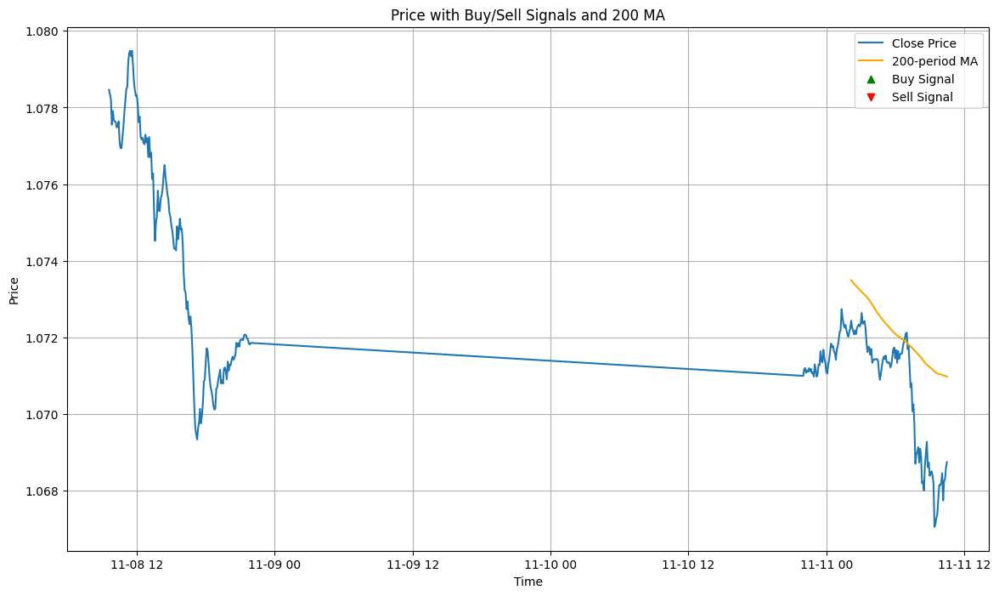

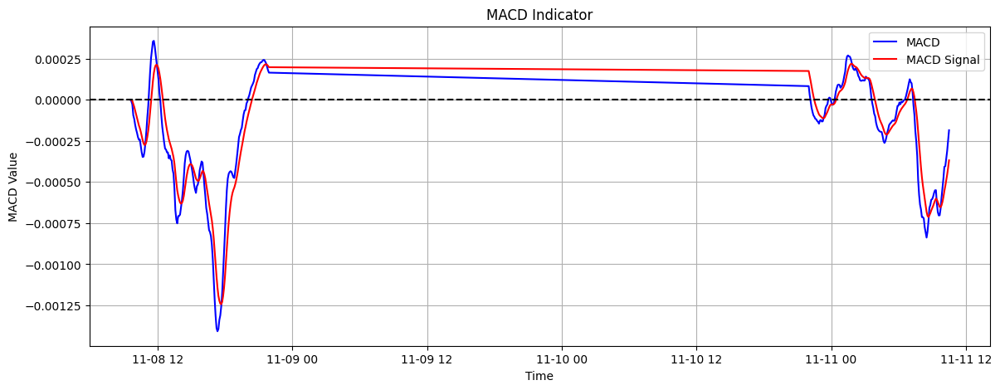

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

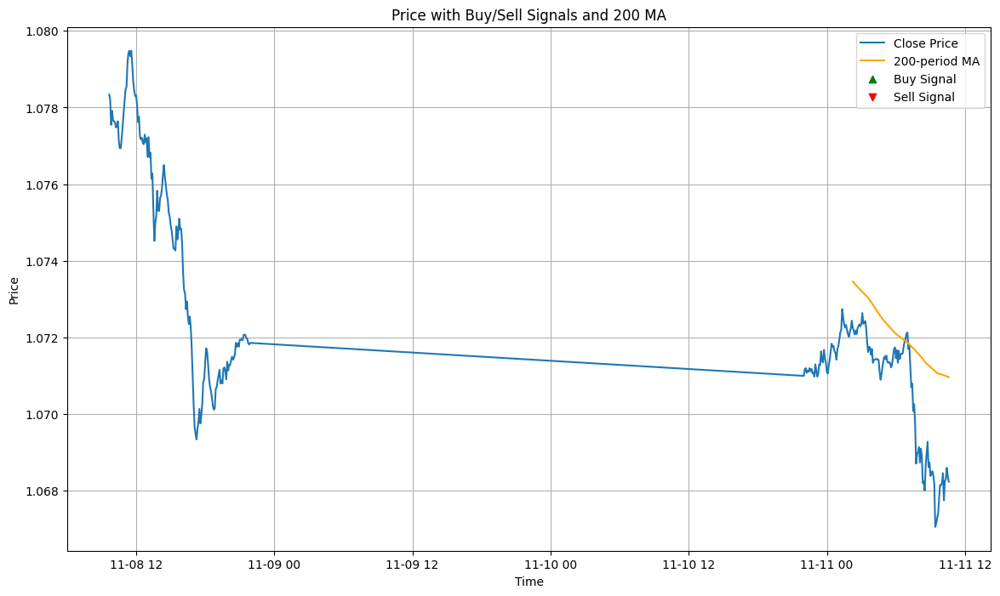

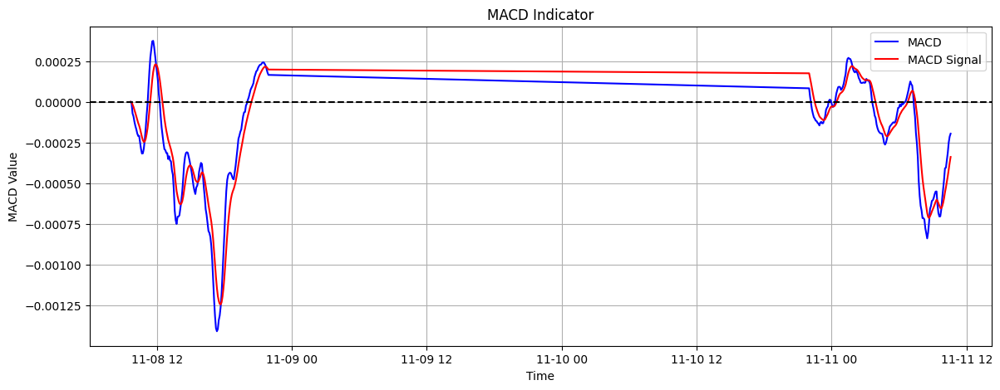

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

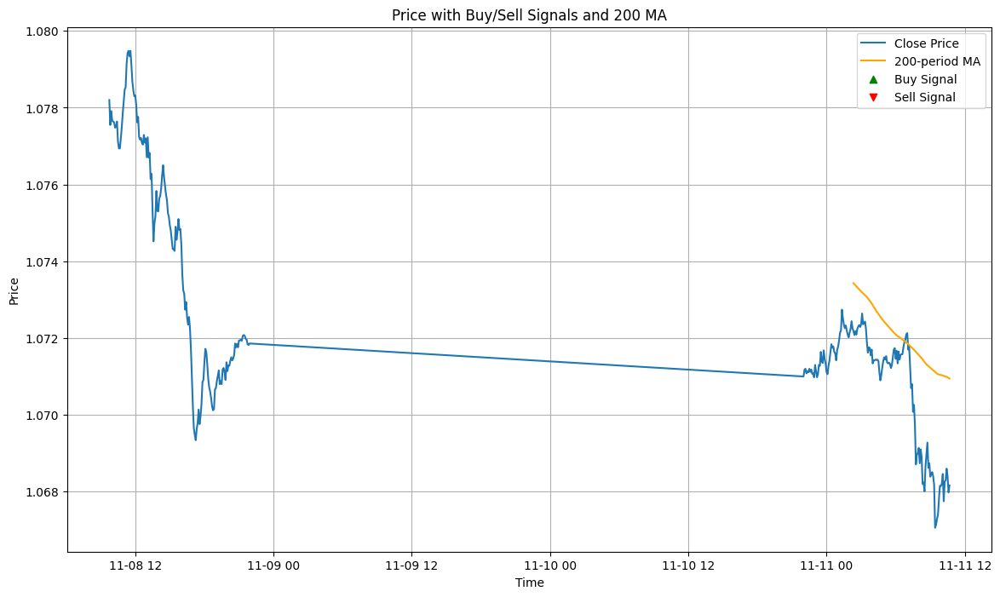

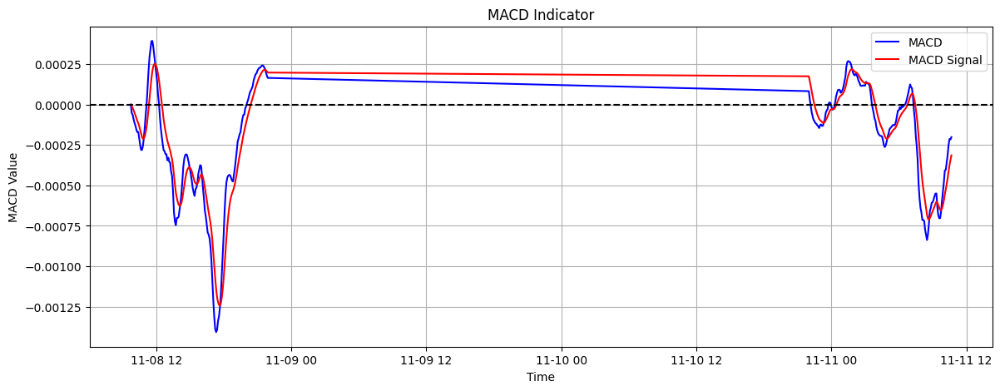

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

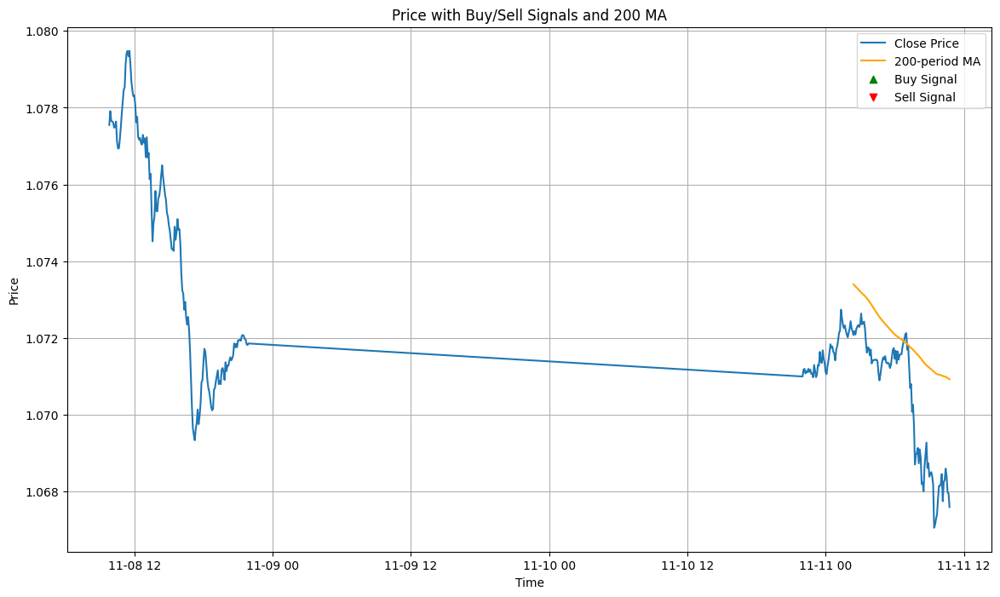

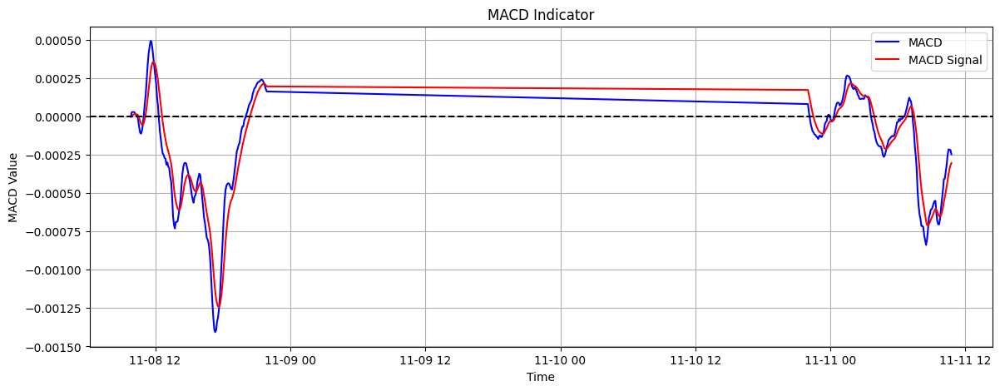

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

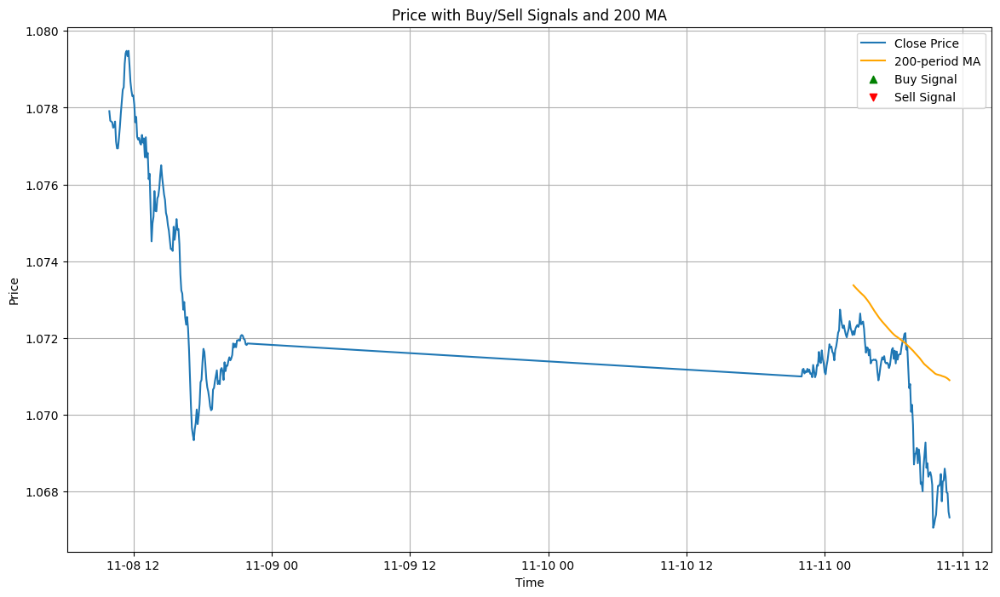

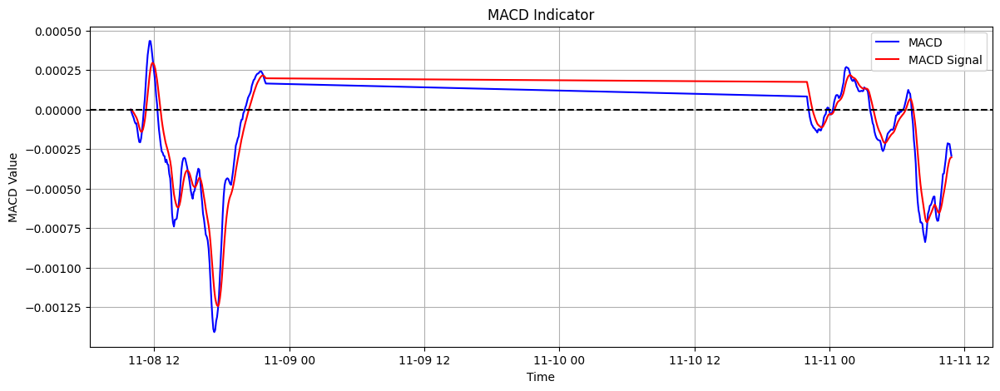

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

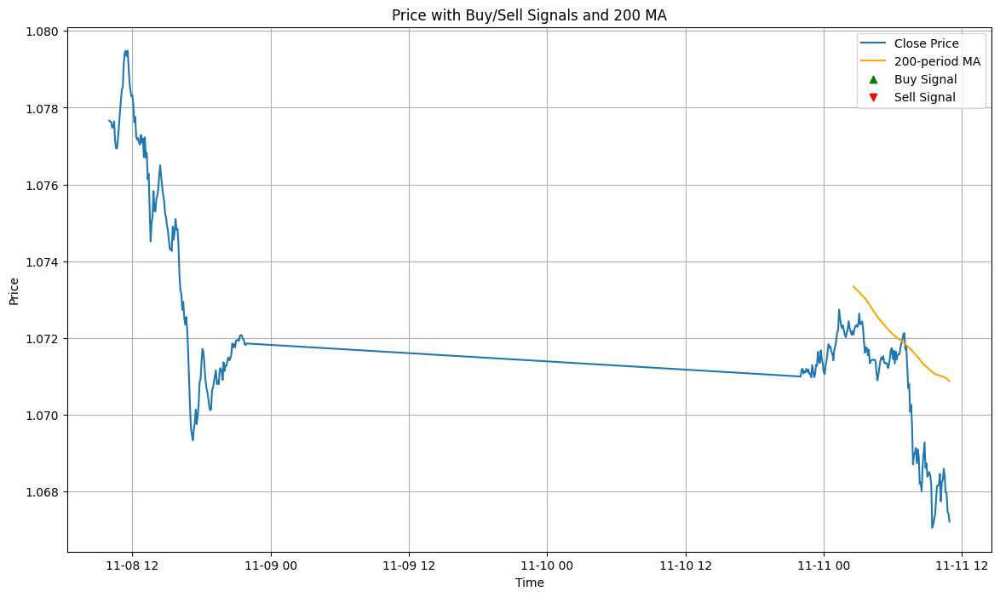

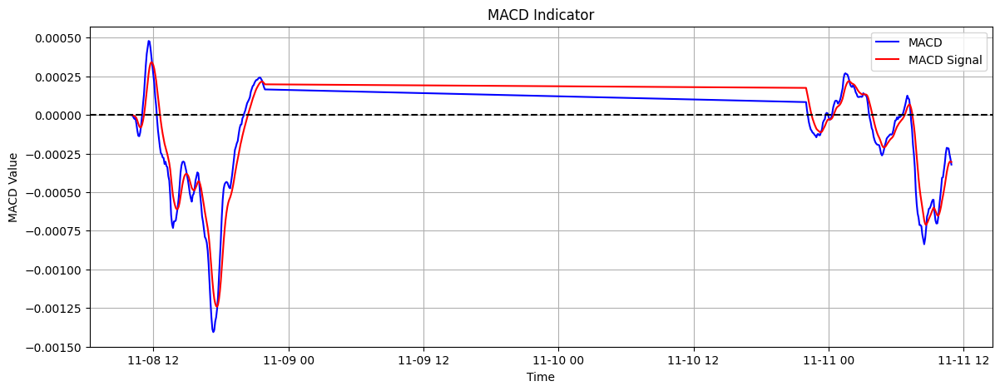

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

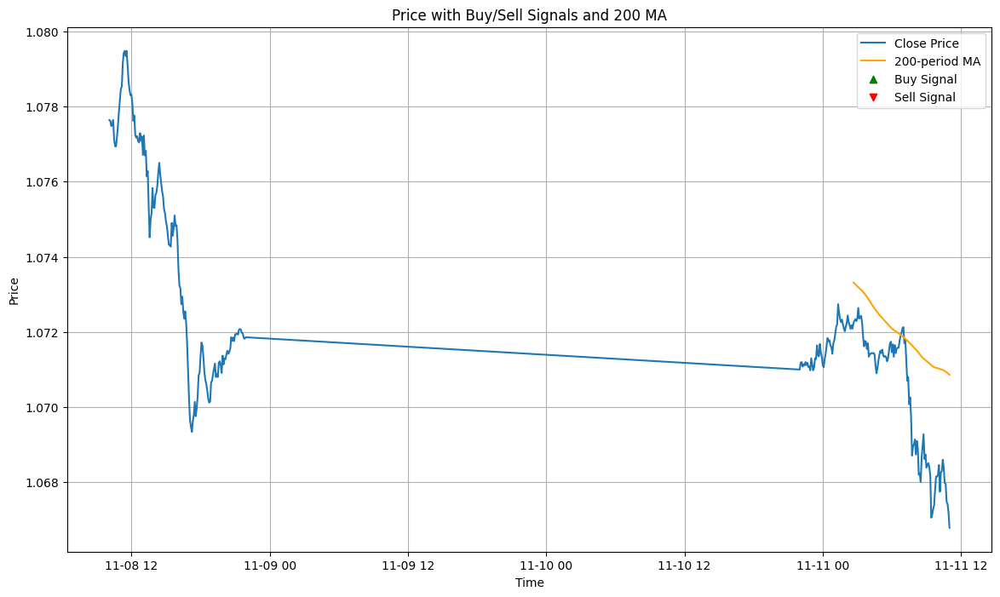

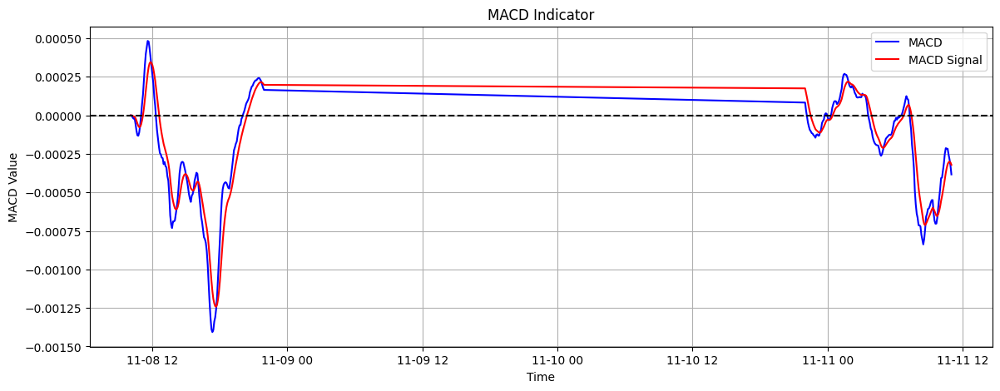

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

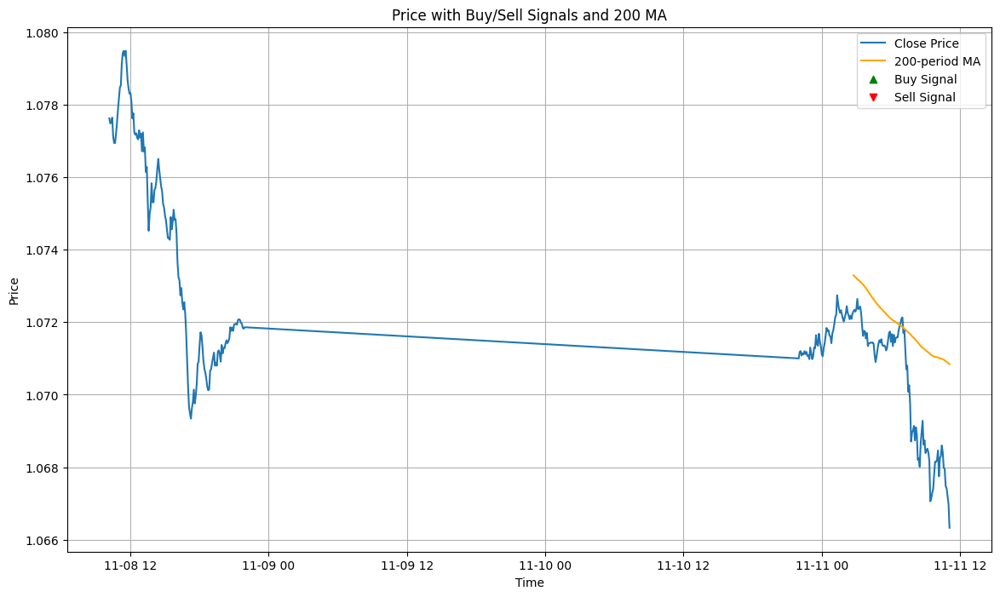

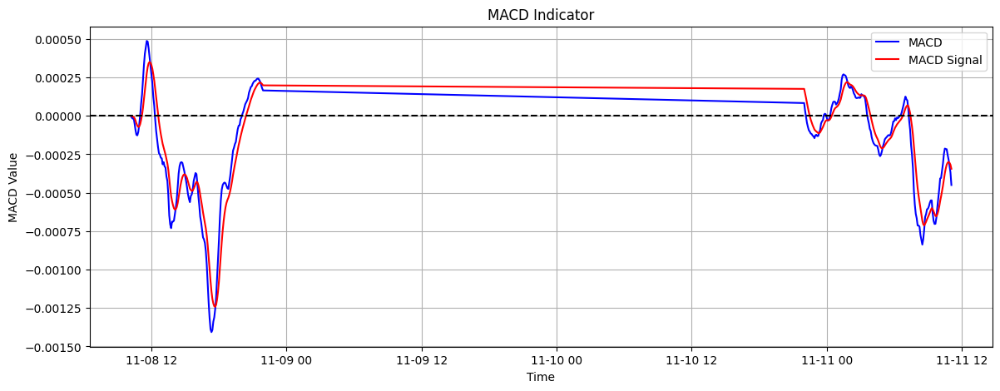

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

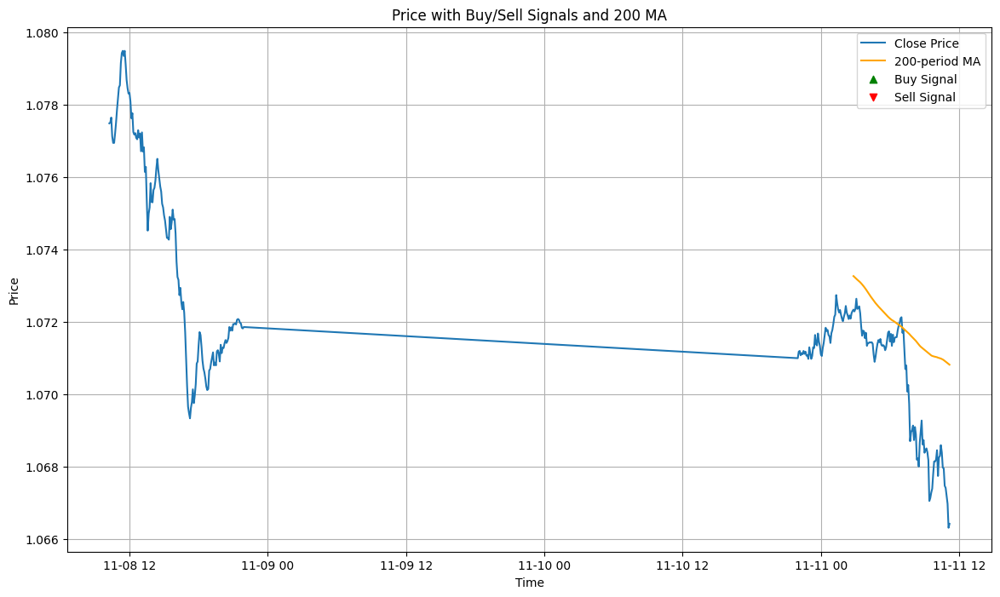

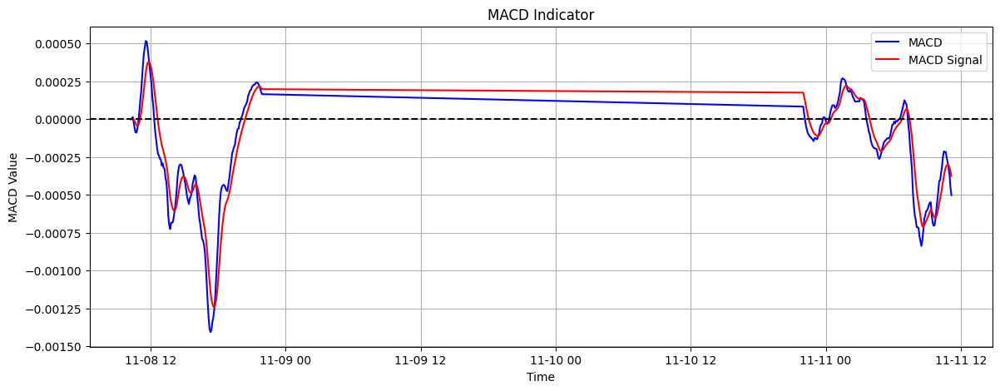

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

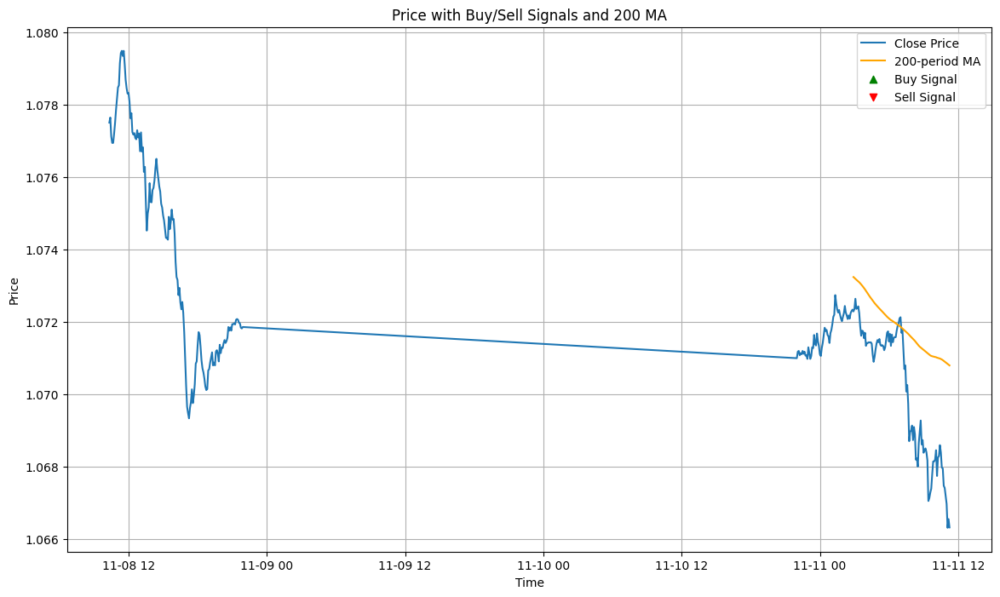

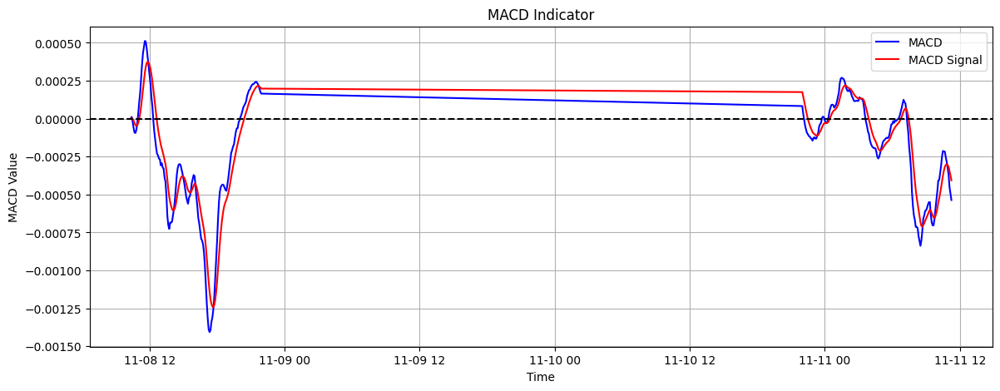

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

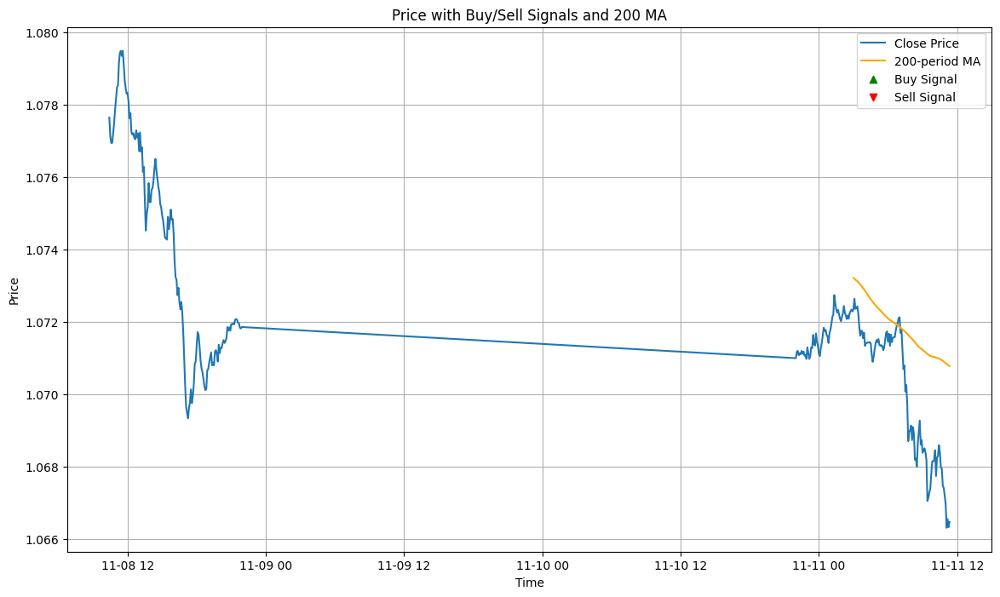

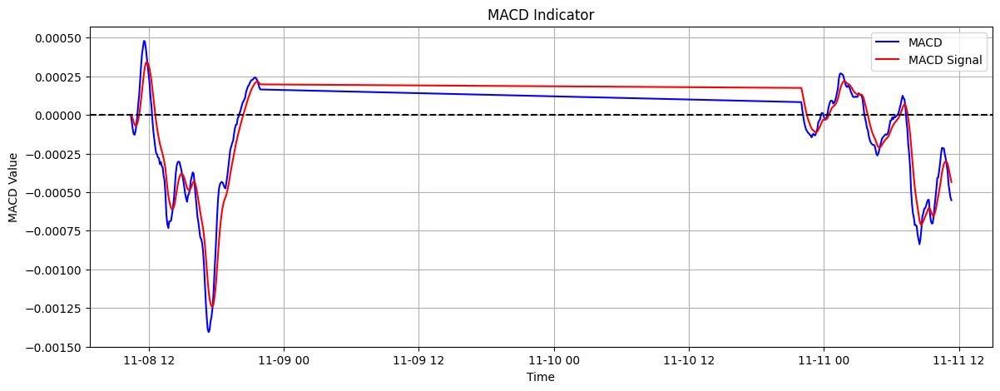

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

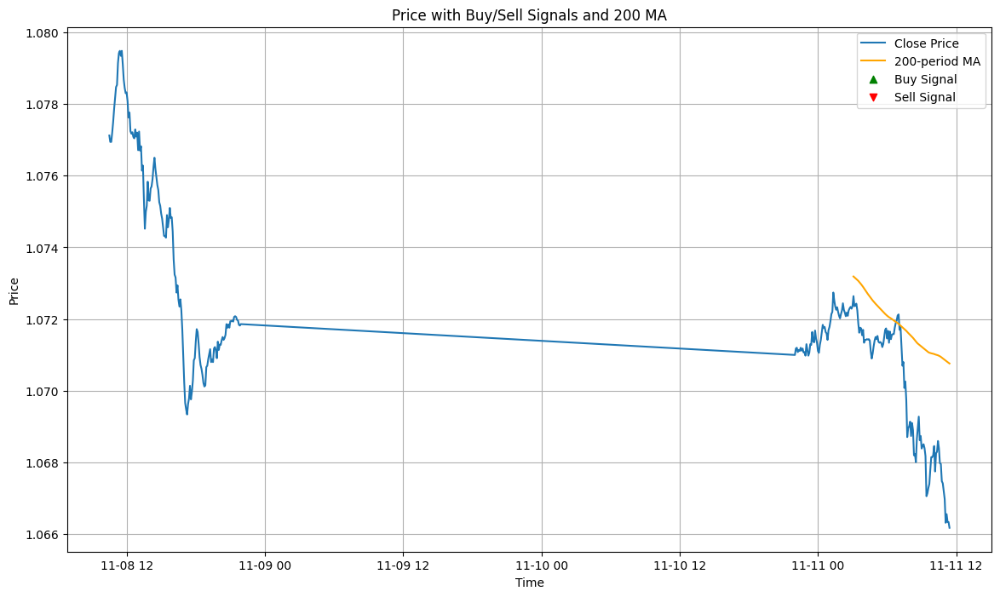

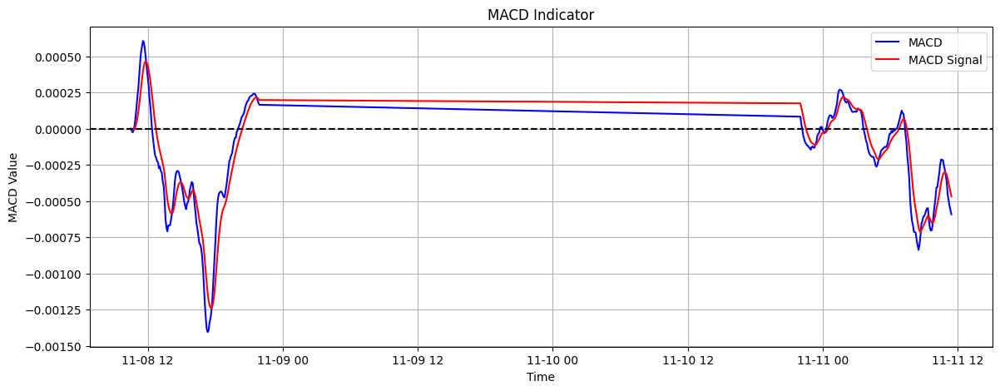

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

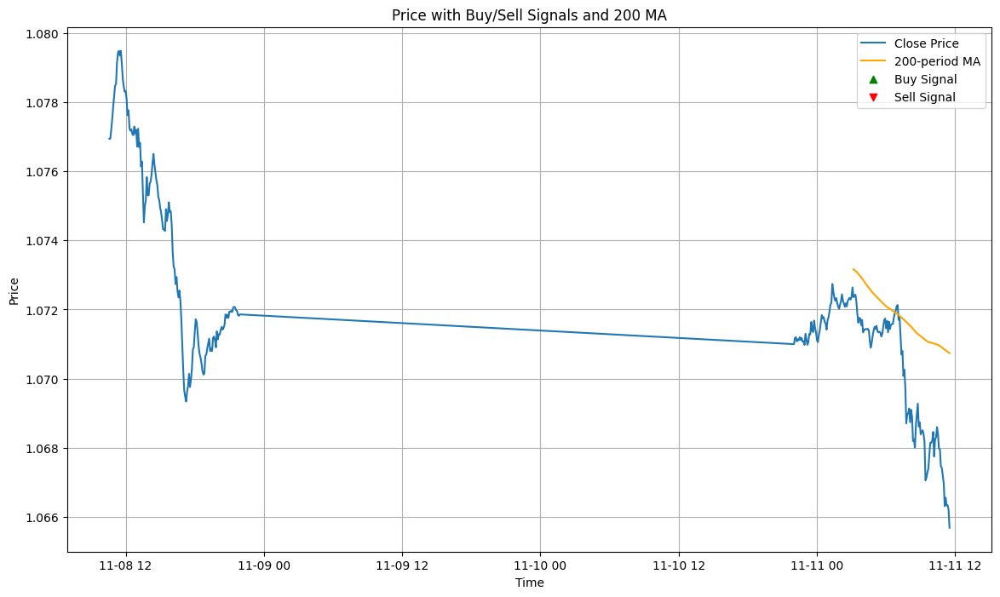

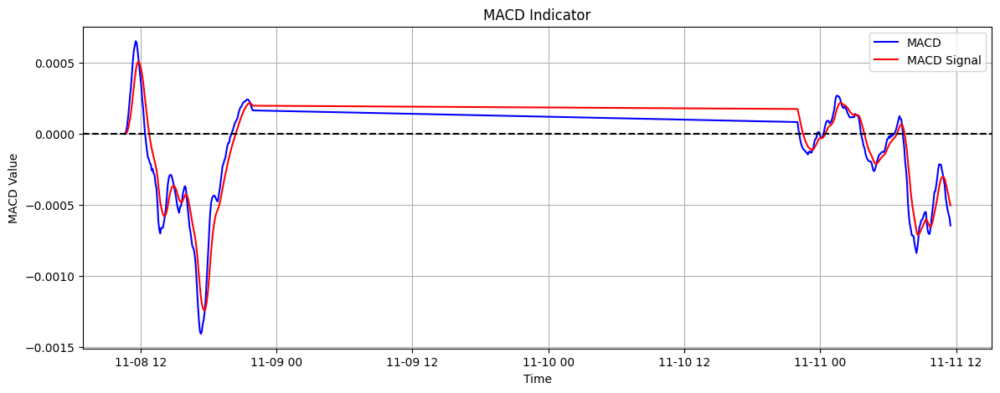

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

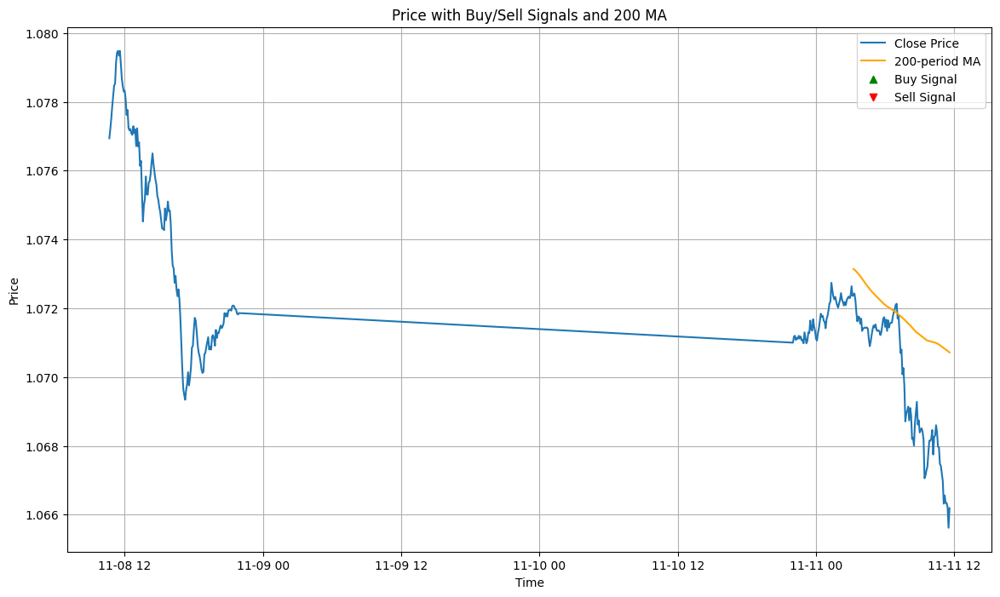

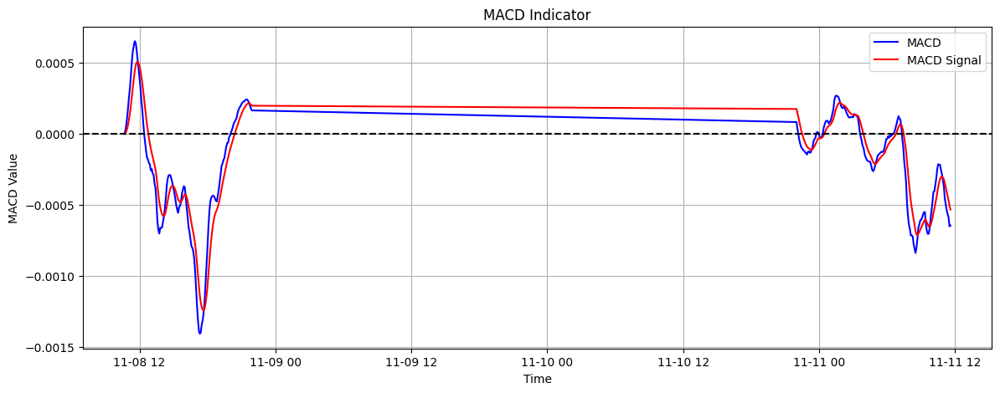

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

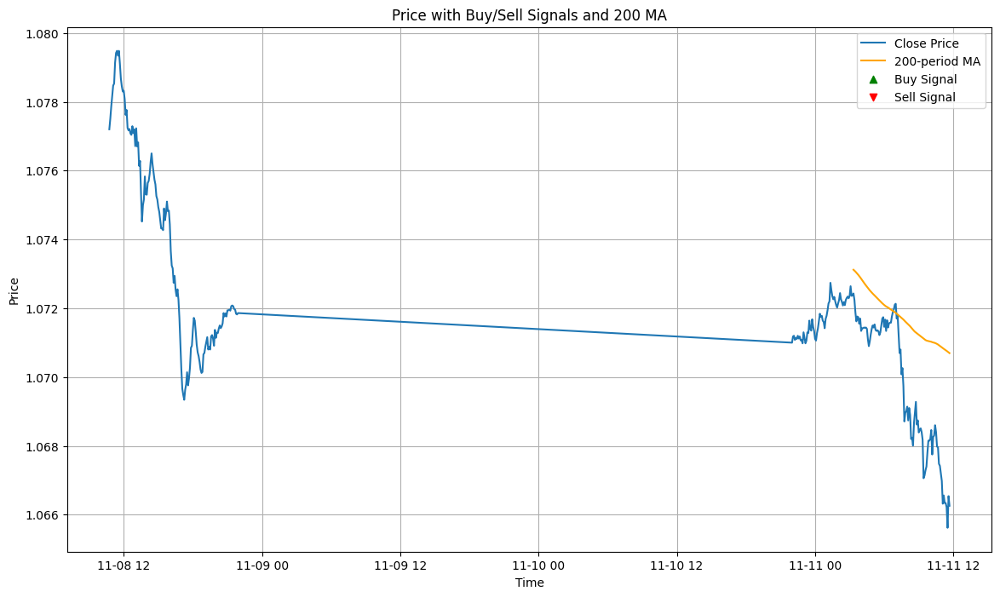

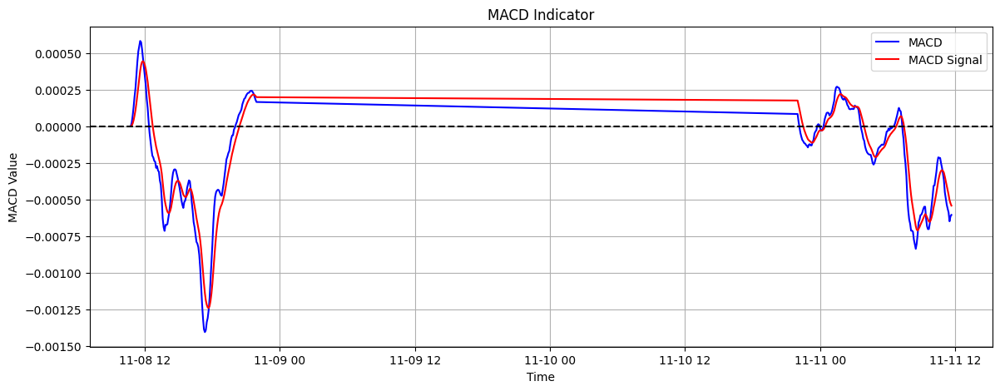

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

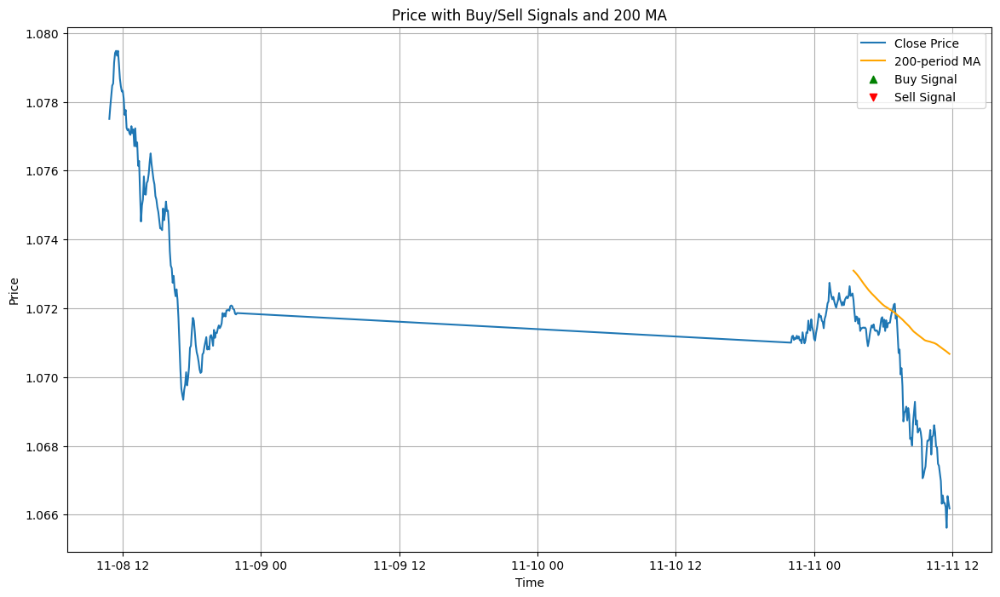

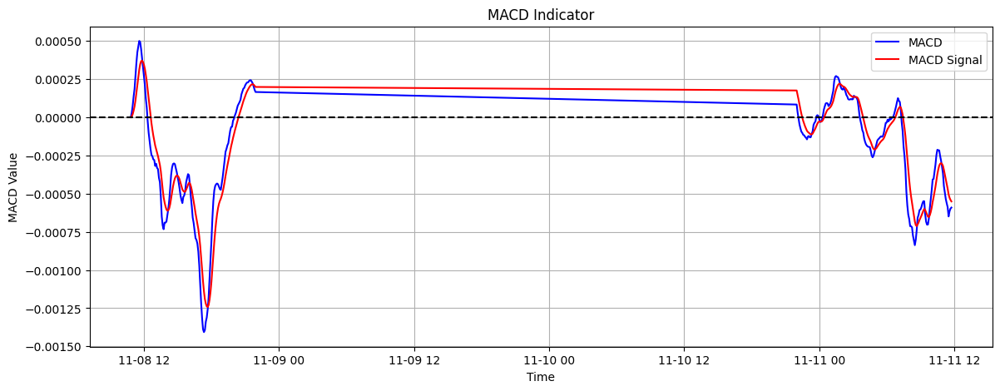

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

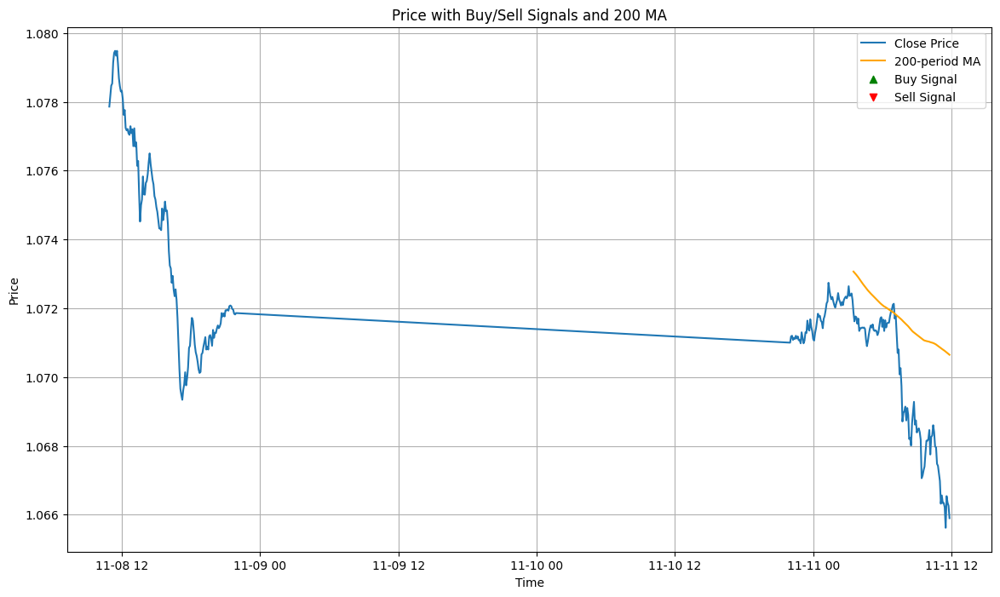

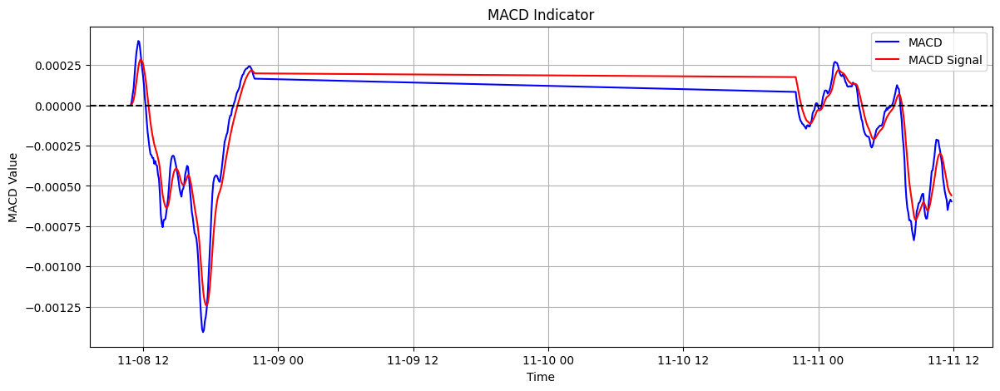

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

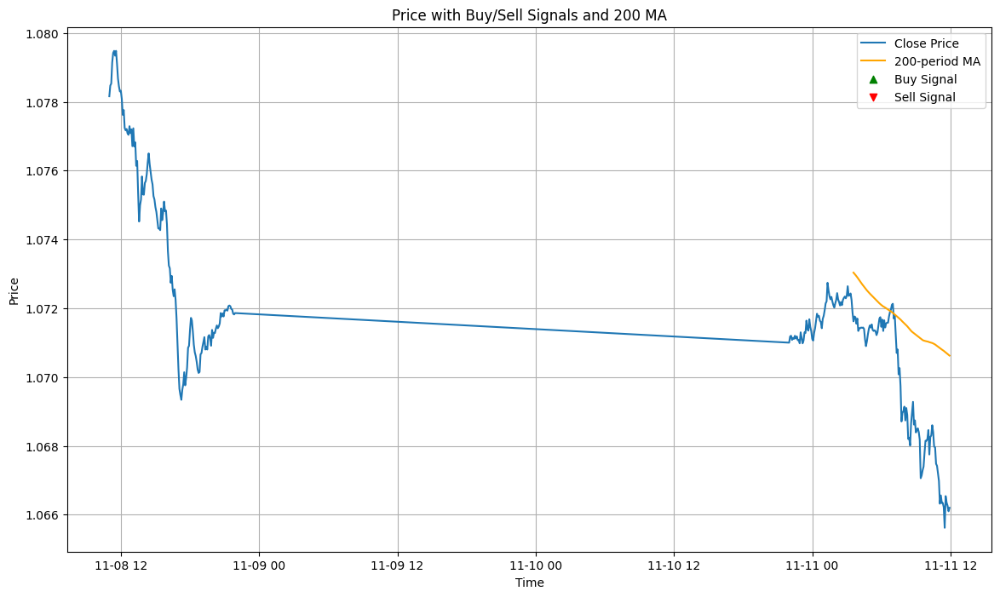

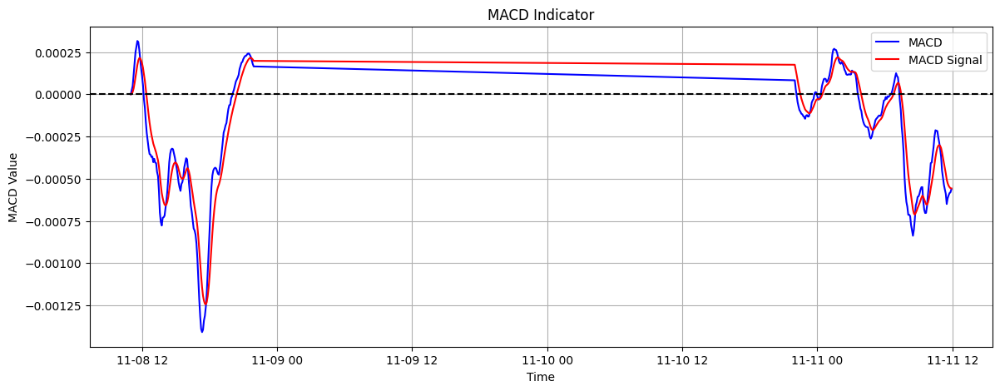

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

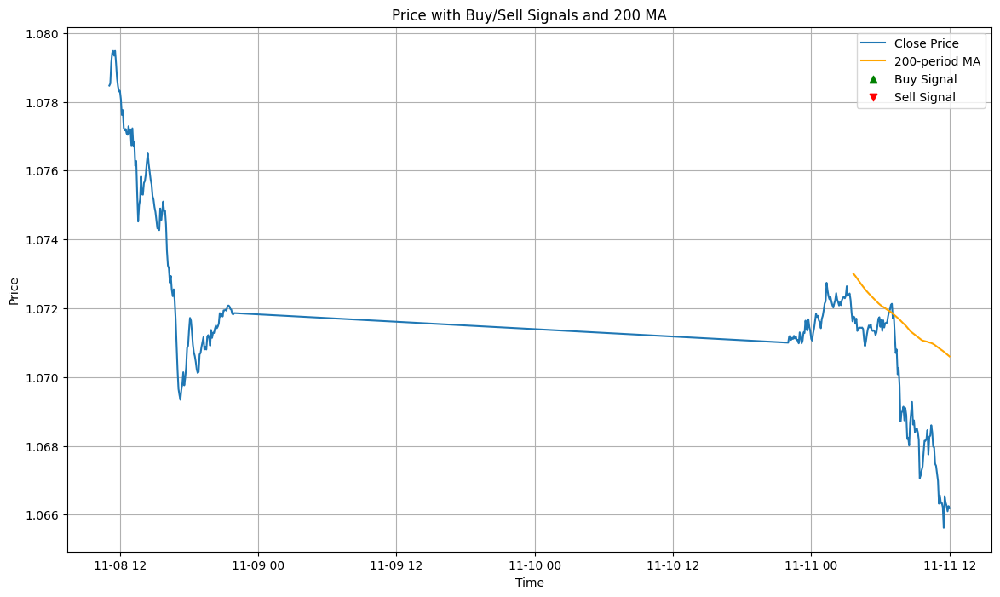

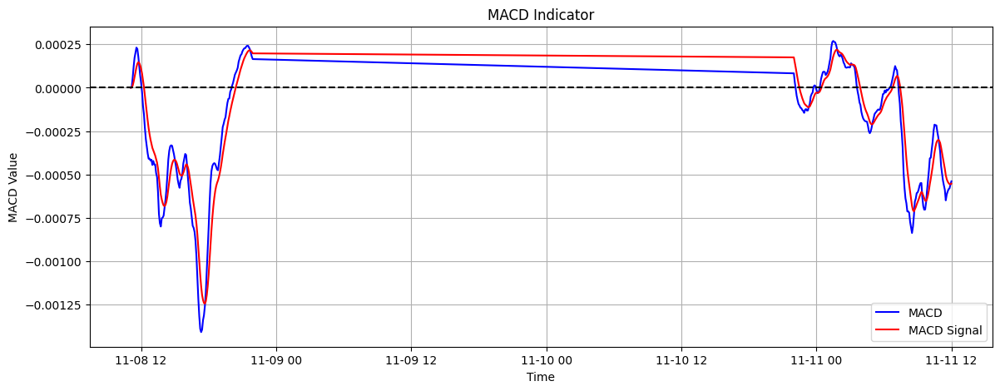

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

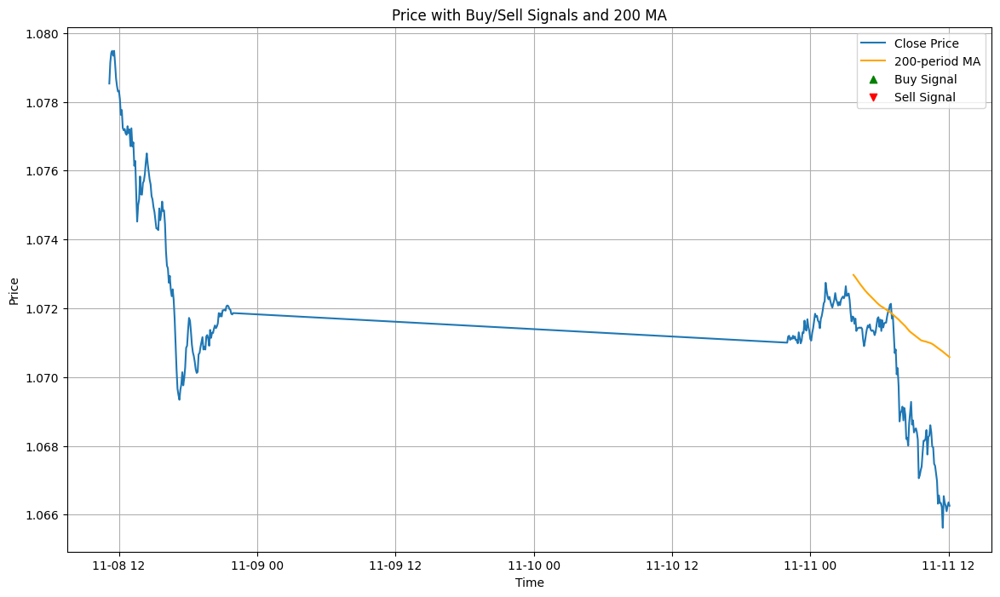

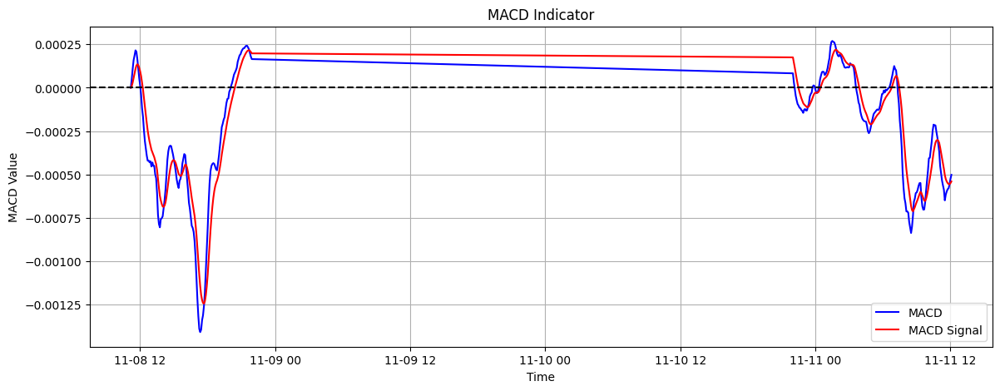

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

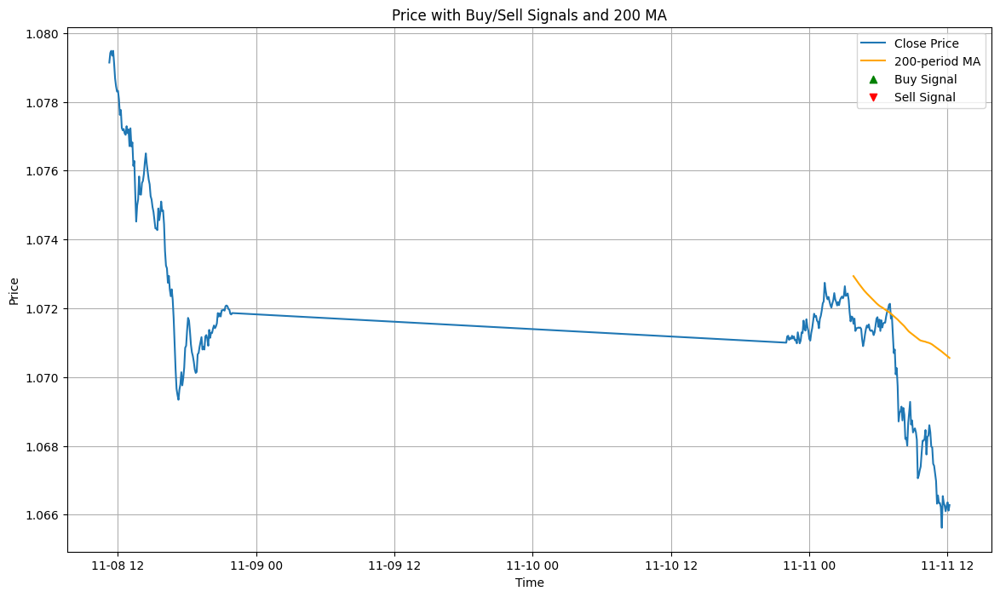

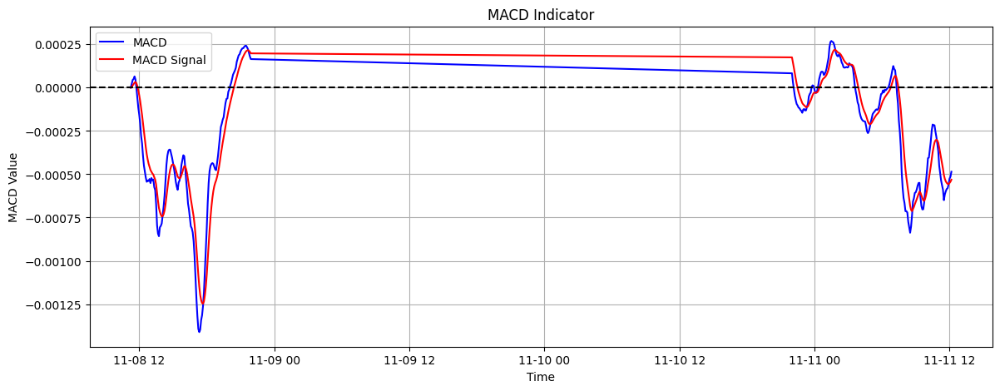

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

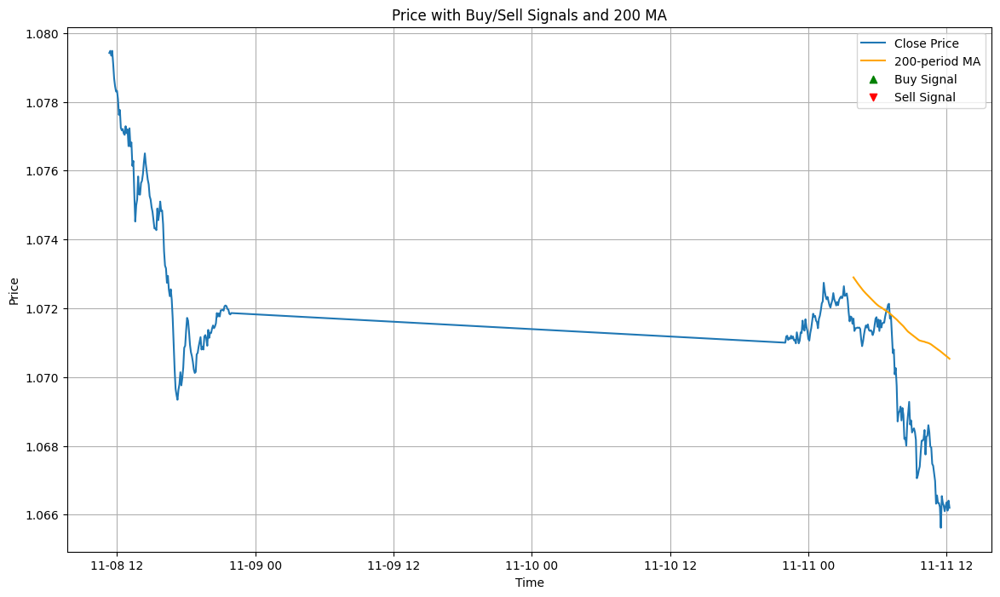

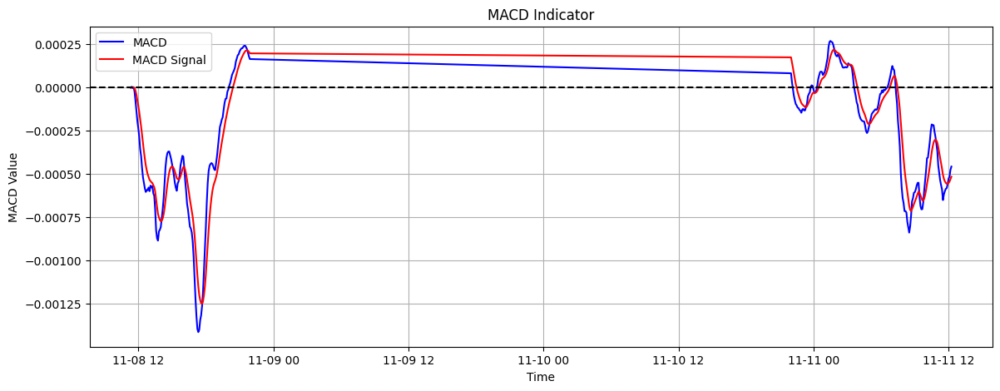

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

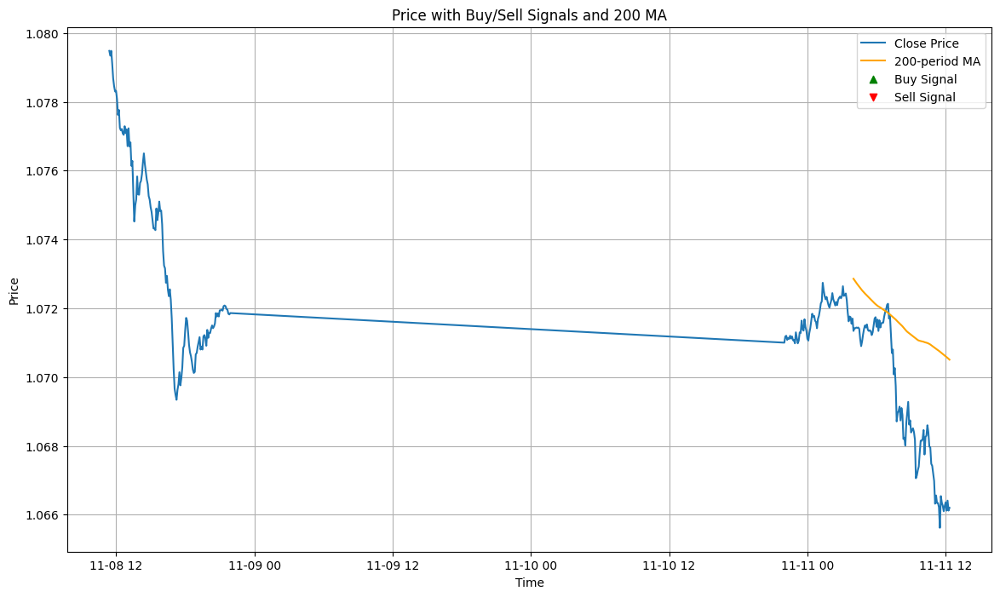

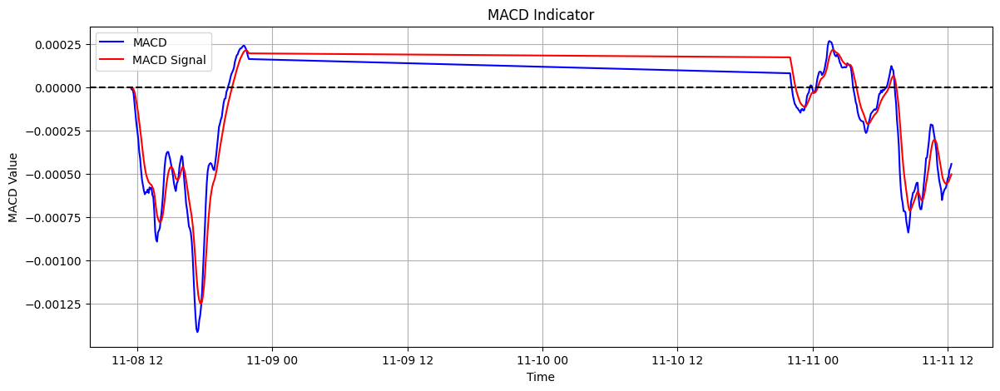

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

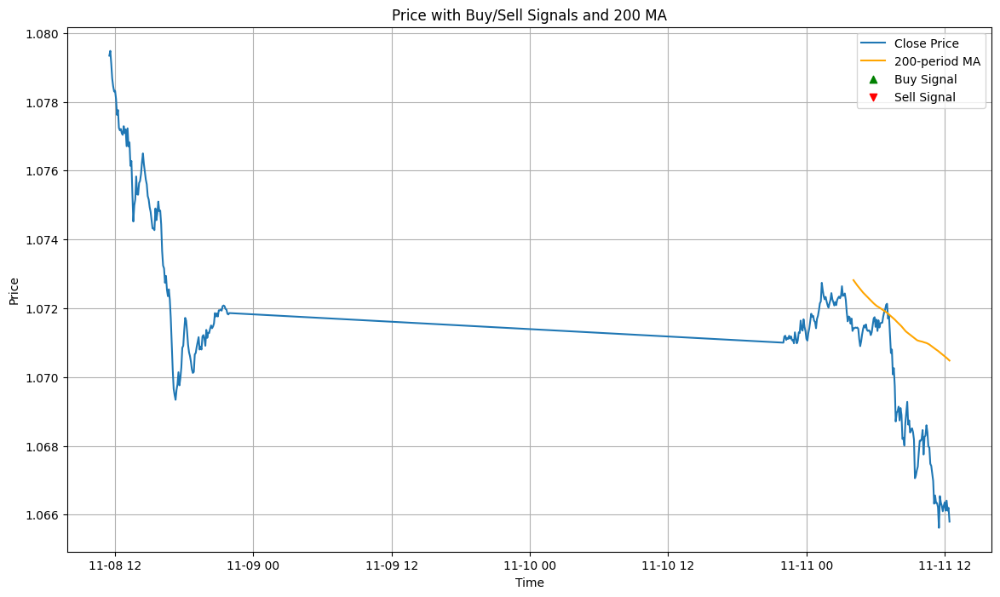

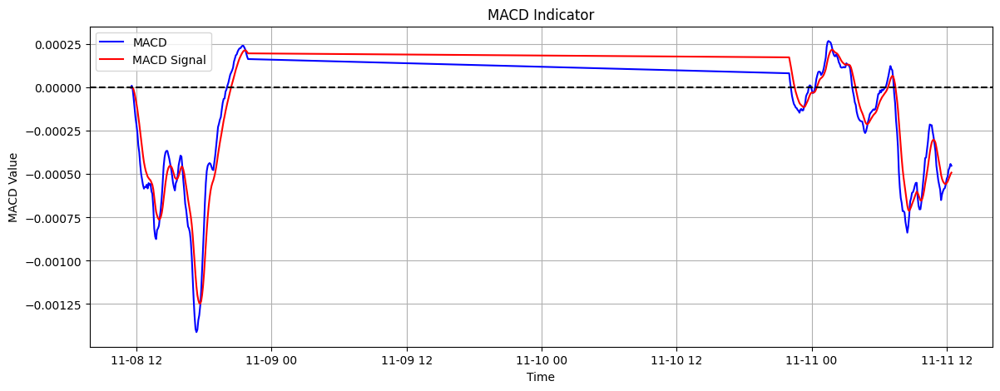

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

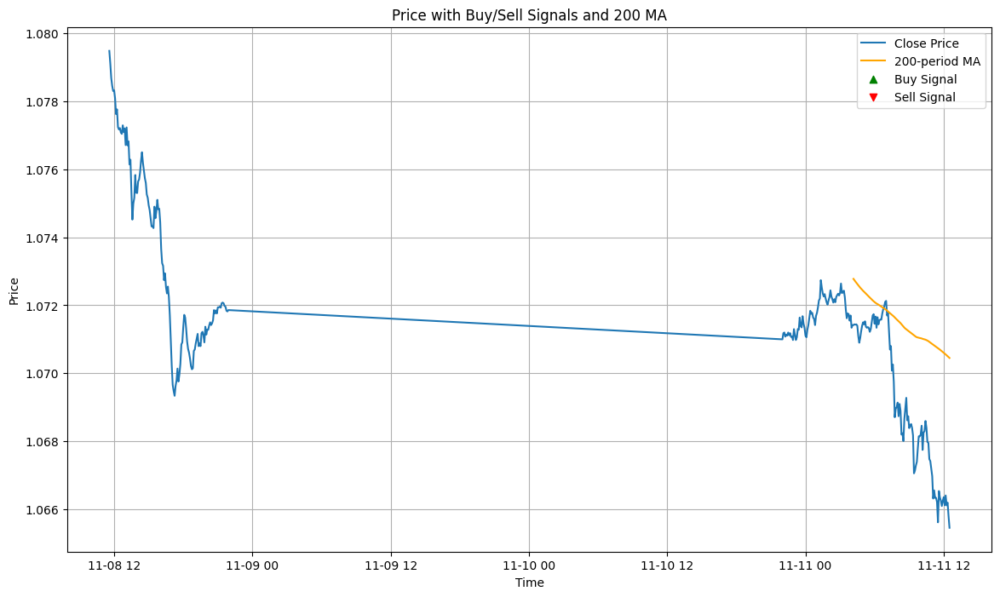

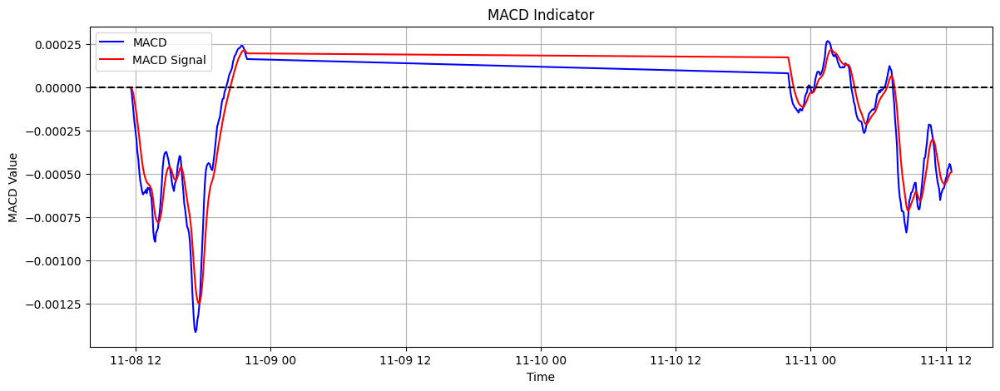

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

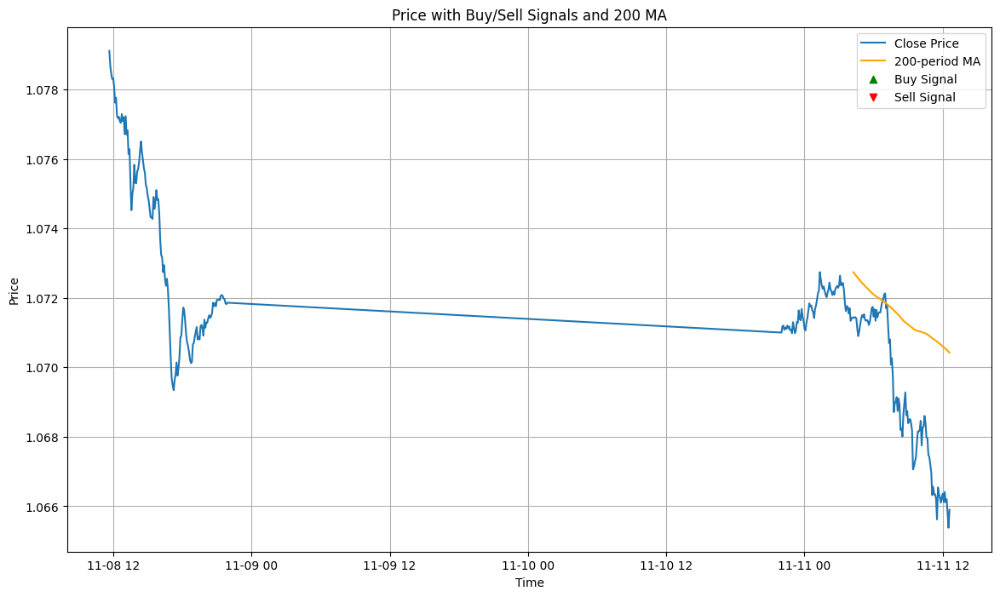

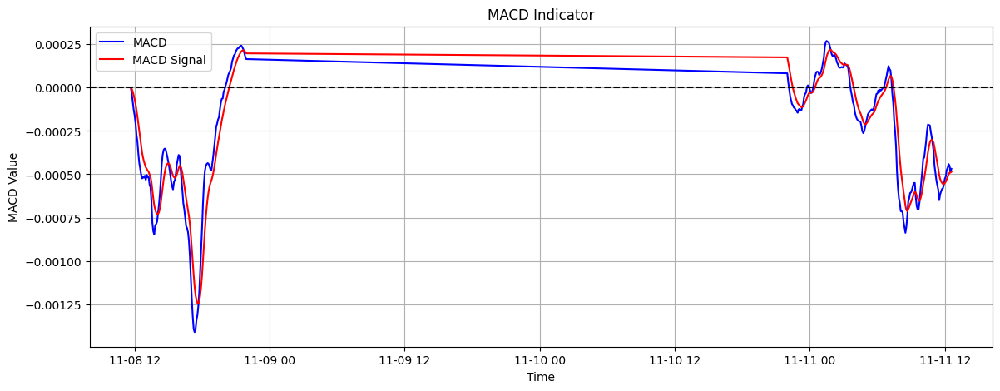

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

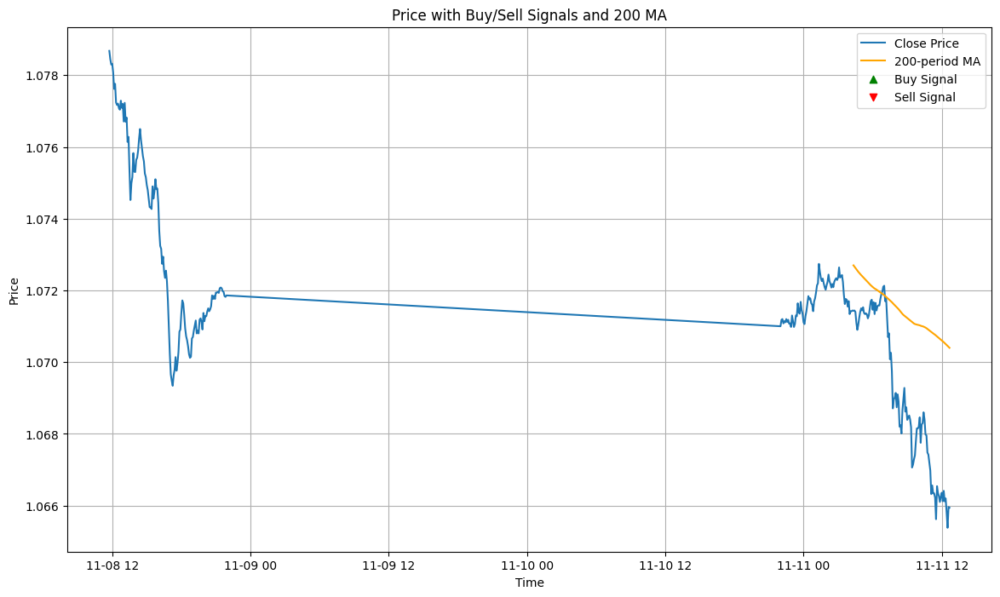

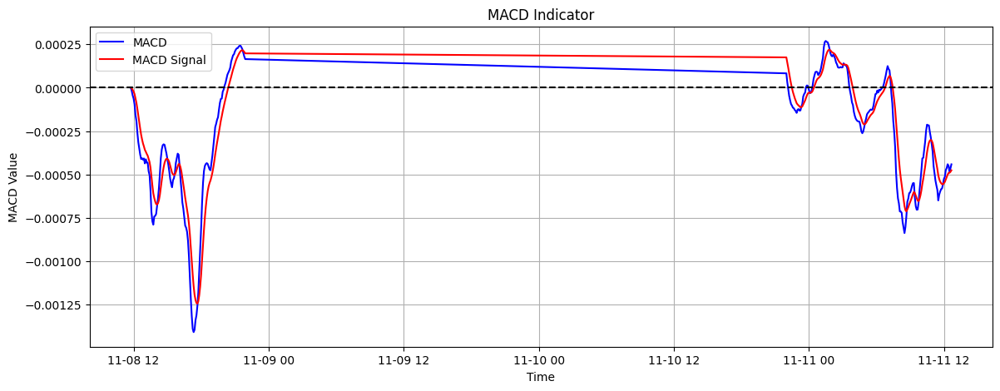

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

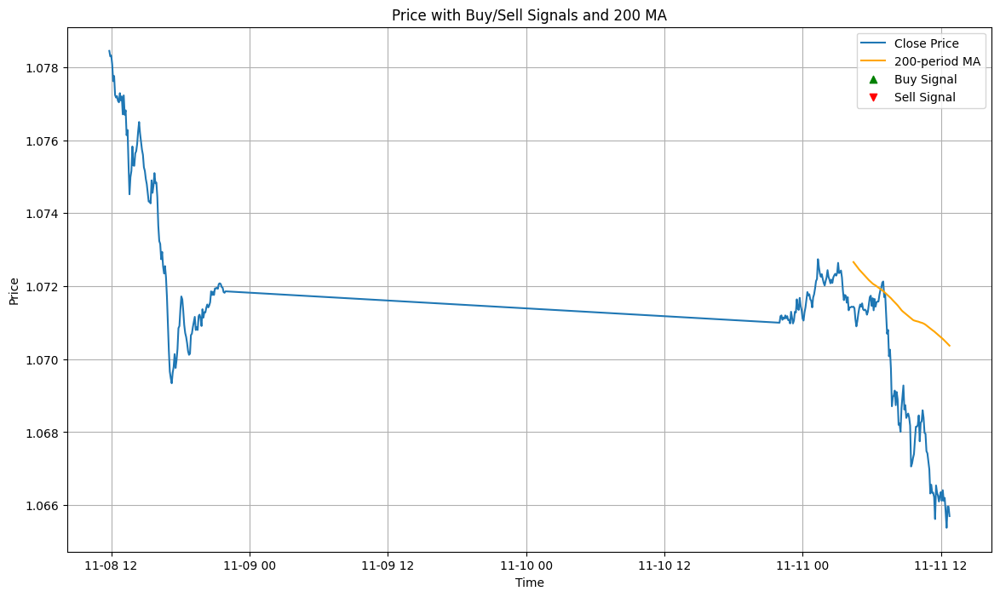

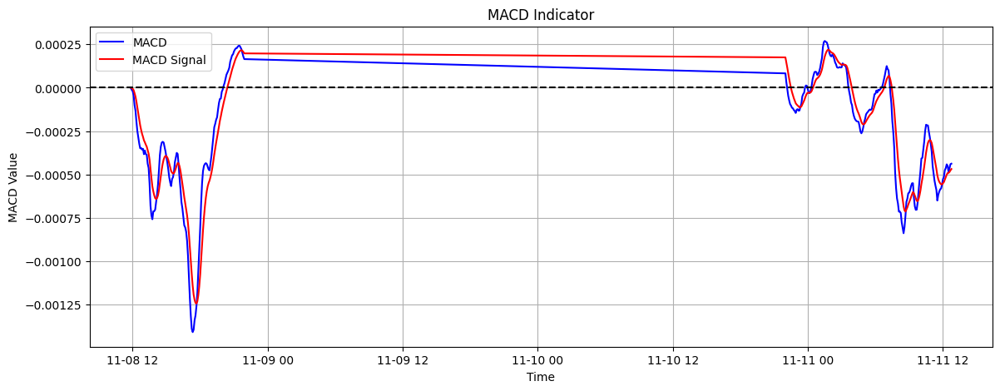

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

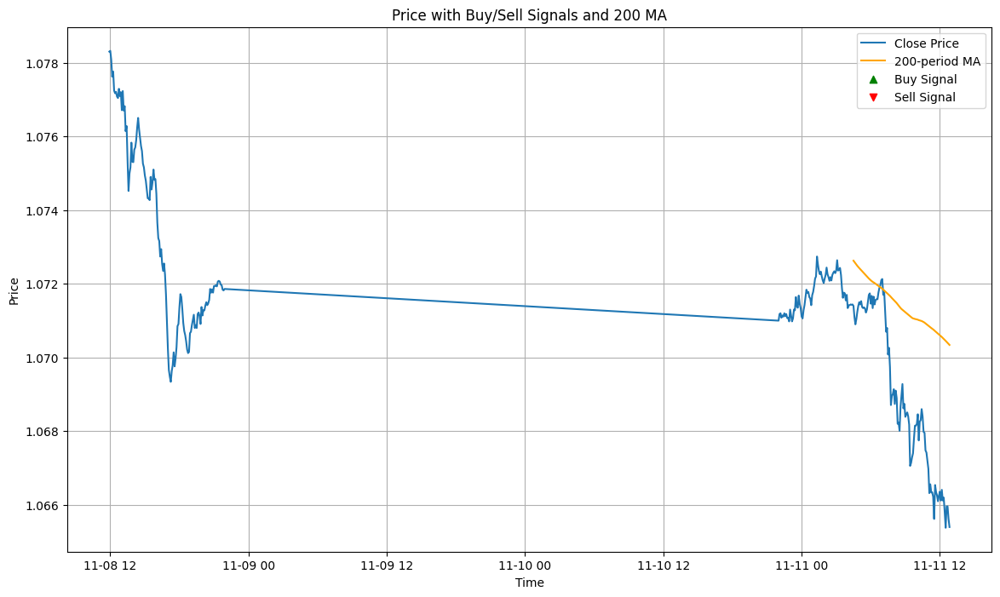

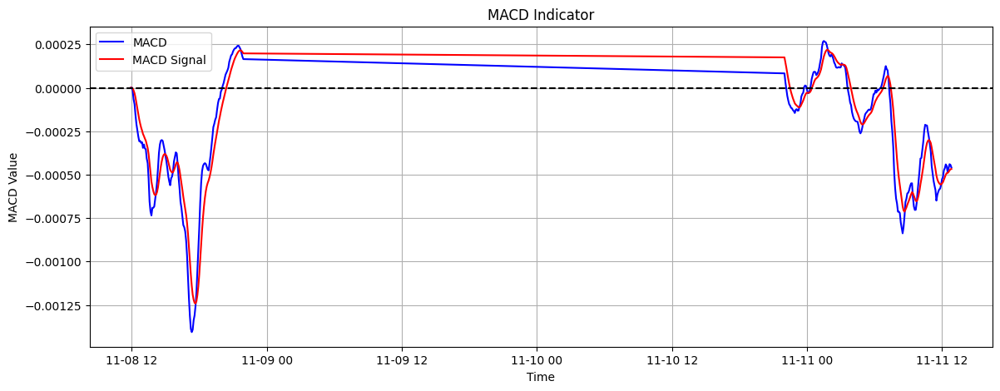

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

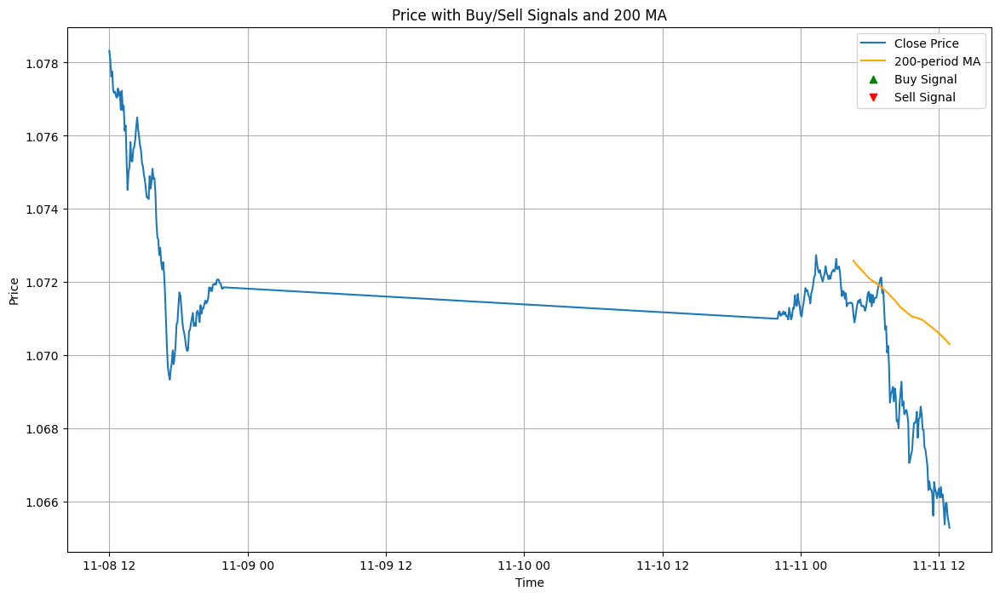

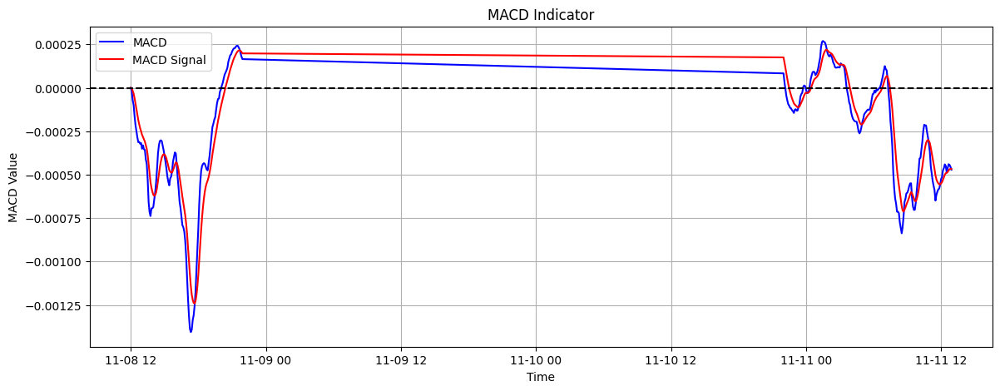

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

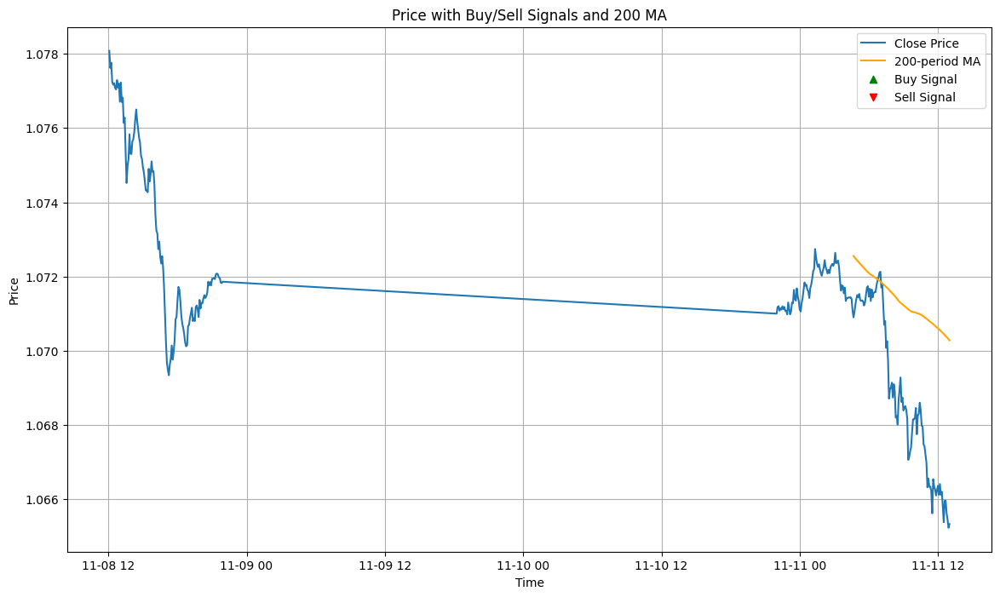

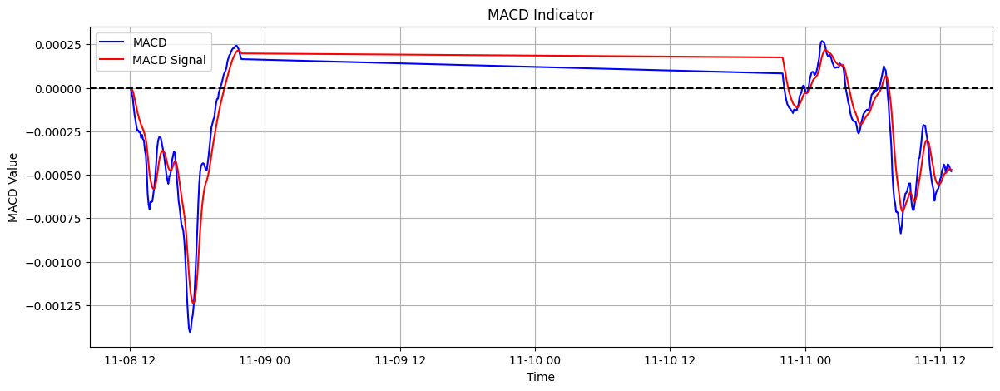

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

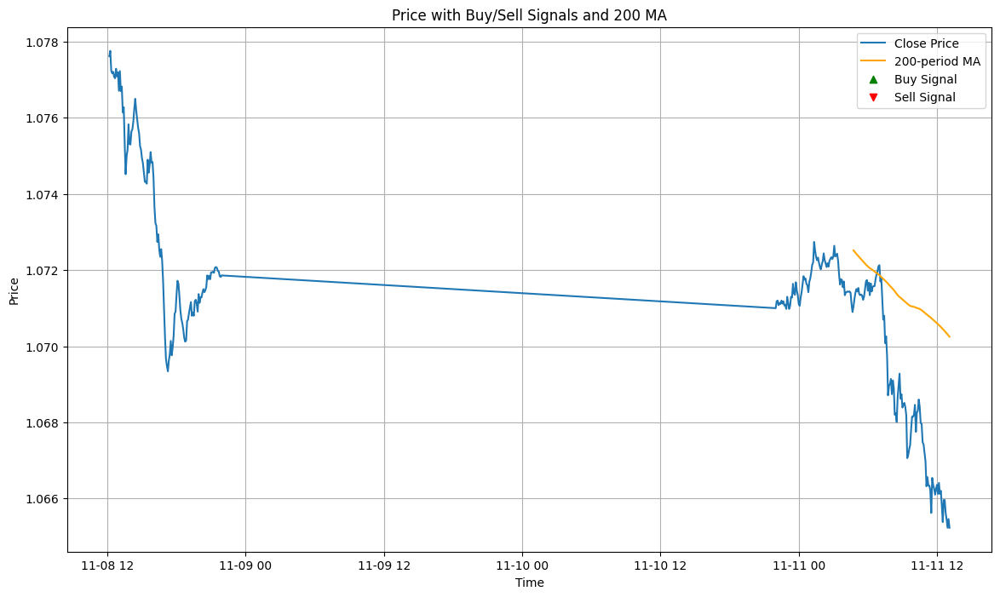

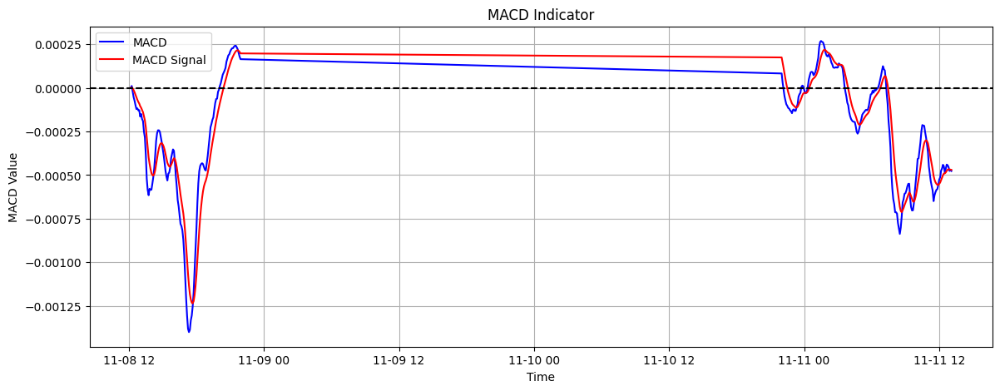

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

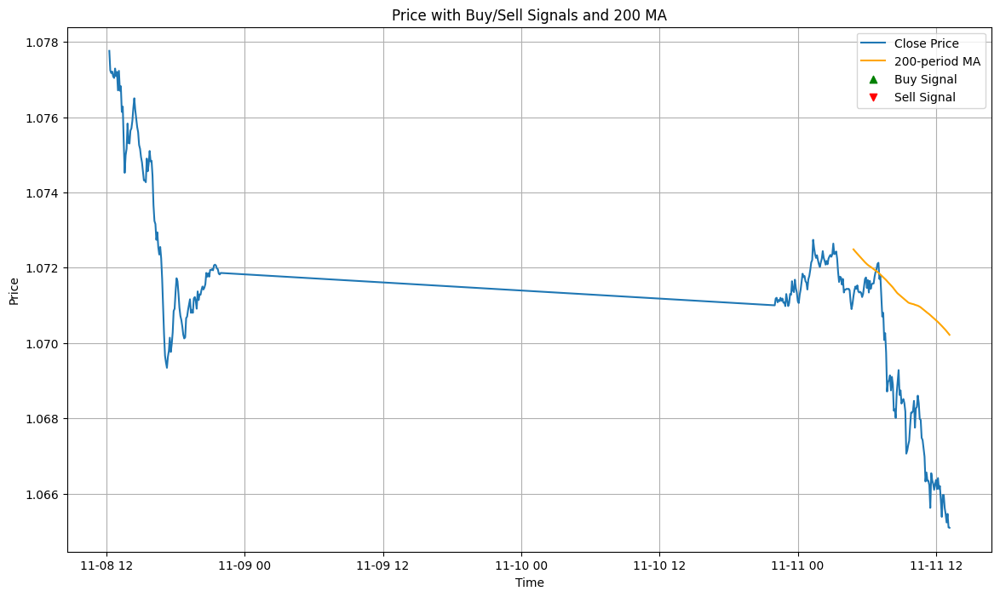

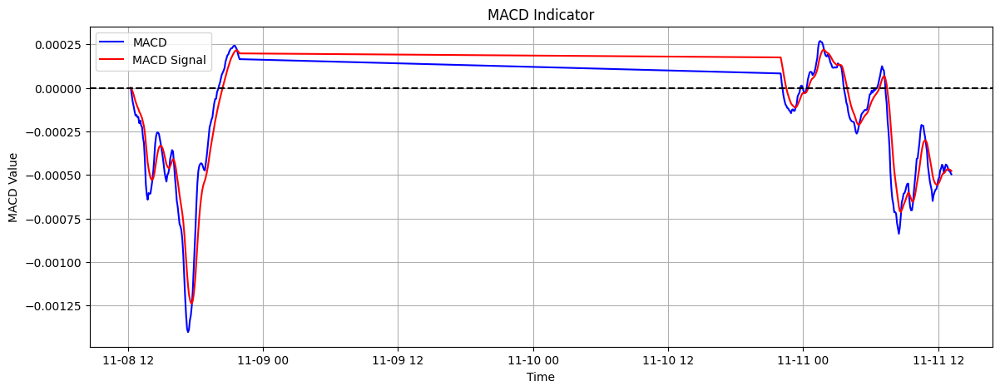

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

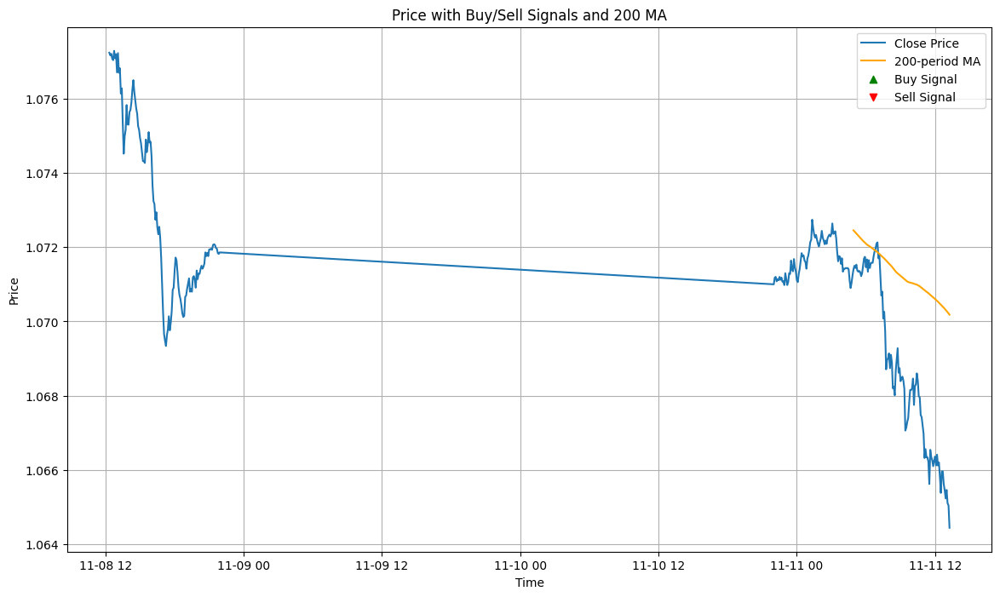

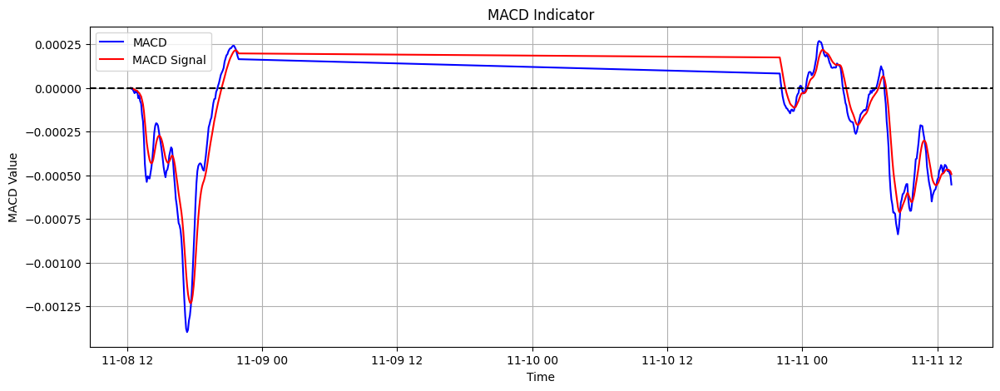

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

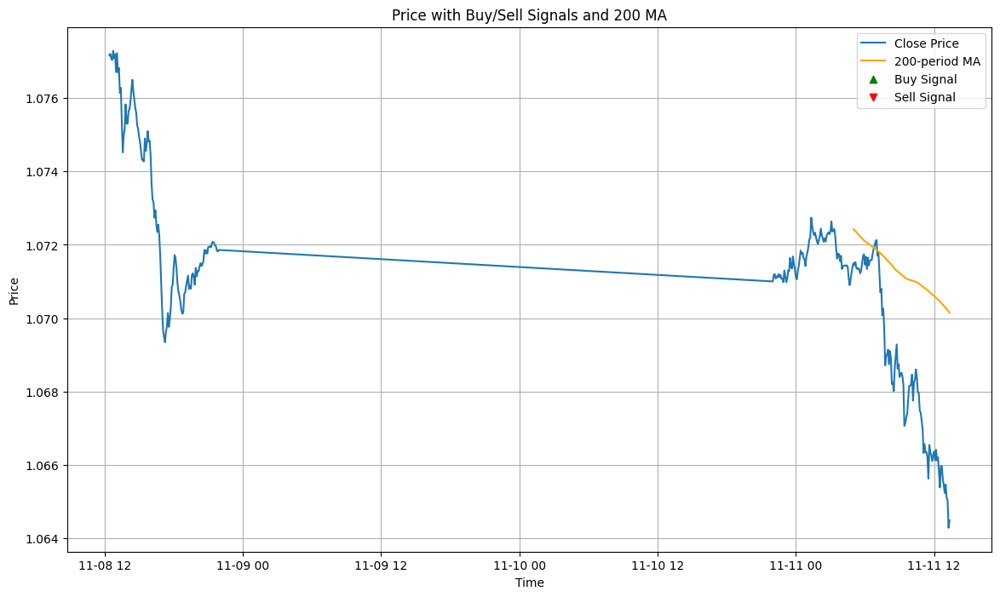

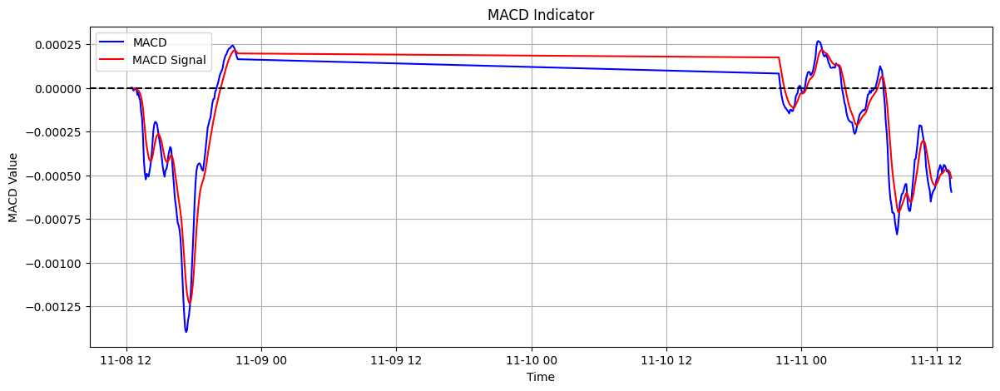

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

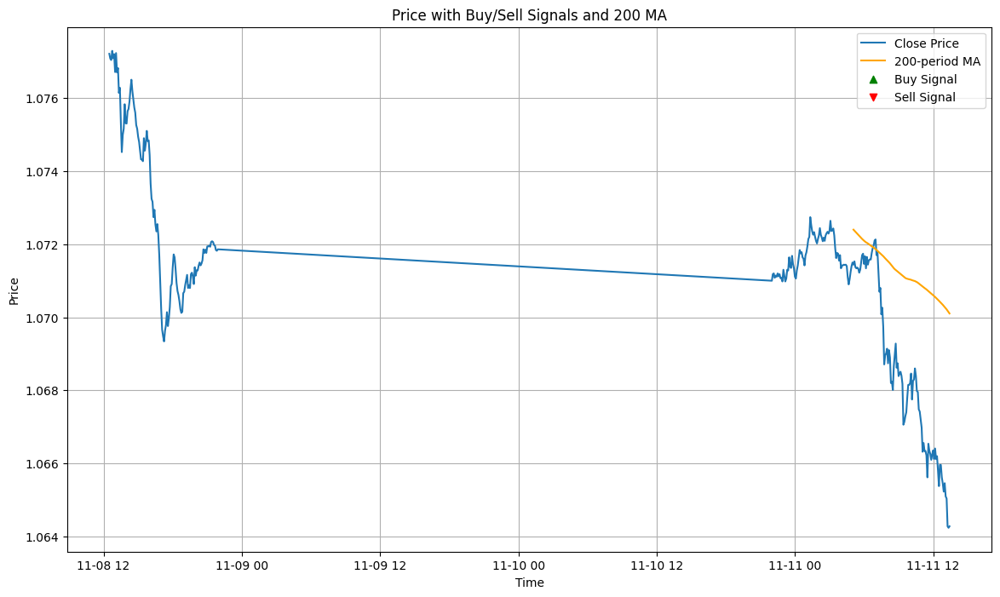

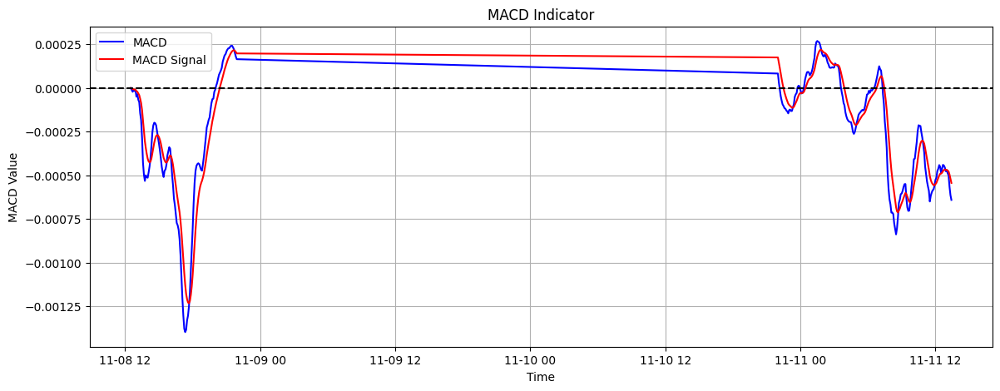

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   time         300 non-null    datetime64[ns, UTC]
 1   open         300 non-null    float64            
 2   high         300 non-null    float64            
 3   low          300 non-null    float64            
 4   close        300 non-null    float64            
 5   MA_200       101 non-null    float64            
 6   EMA12        300 non-null    float64            
 7   EMA26        300 non-null    float64            
 8   MACD         300 non-null    float64            
 9   MACD_signal  300 non-null    float64            
 10  high_low     300 non-null    float64            
 11  high_close   299 non-null    float64            
 12  low_close    299 non-null    float64            
 13  tr           300 non-null    float64            
 14  ATR          287 non-null 

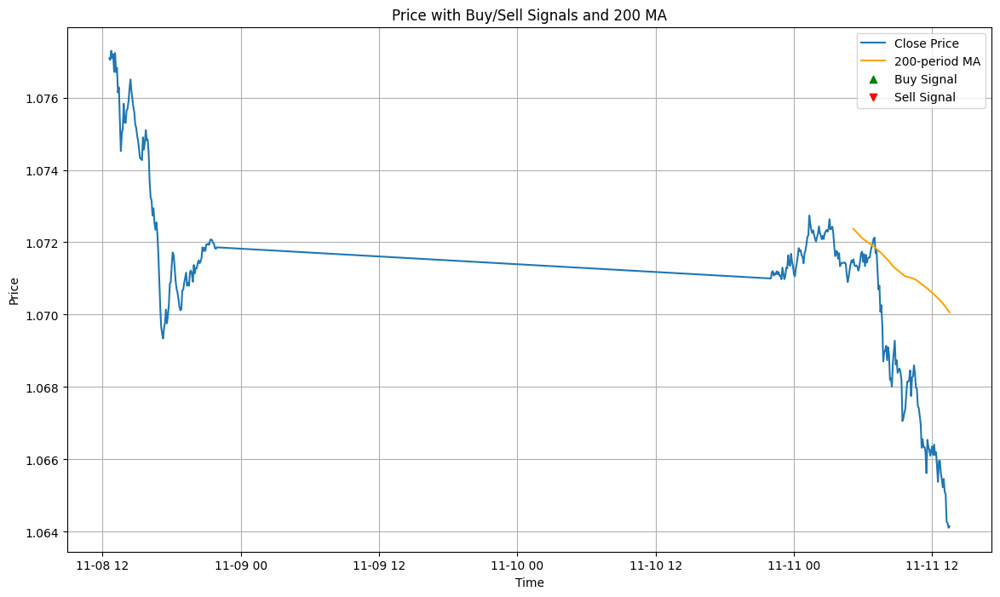

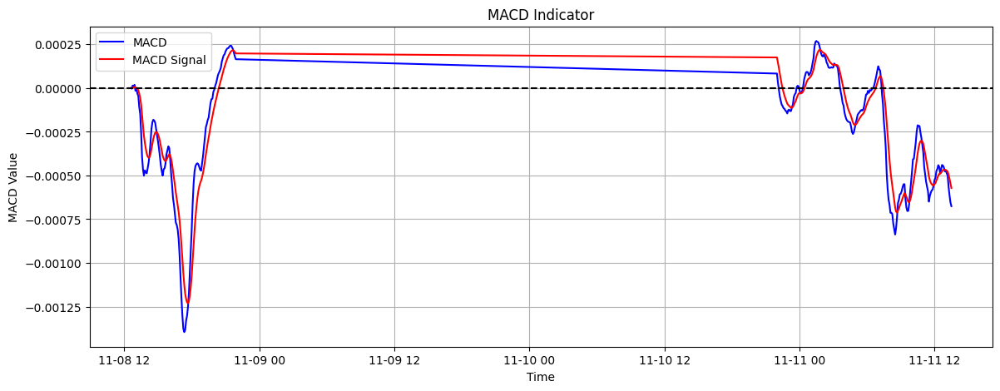

KeyboardInterrupt: 

In [ ]:
trade("EUR_USD", lot_size=1000)
